In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
import random
import matplotlib.pyplot as plt
import numpy as np
import time
import os
import cv2
import matplotlib.pyplot as plt
from timeit import default_timer as timer
from torchvision import models
from torchvision import datasets, transforms
from PIL import Image
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, roc_auc_score, roc_curve, f1_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.linear_model import LogisticRegression

In [2]:
from google.colab import drive

drive.mount('/content/drive/')

Mounted at /content/drive/


# Control images

LOAD CONTROL IMAGES

In [3]:
ruta_MRI = '/content/drive/MyDrive/TFM_last/Data/MRI/Control'
ruta_mask = '/content/drive/MyDrive/TFM_last/Data/Mask/Control'

MRI_images = []
mask_images = []

for archivo in os.listdir(ruta_MRI):
    if archivo == '.DS_Store':
        continue

    ruta_imagen_mri = os.path.join(ruta_MRI, archivo)
    imagen_mri = cv2.imread(ruta_imagen_mri)
    imagen_mri_gray = cv2.cvtColor(imagen_mri, cv2.COLOR_BGR2GRAY)
    MRI_images.append(imagen_mri_gray)

for archivo in os.listdir(ruta_mask):
    if archivo == '.DS_Store':
        continue

    ruta_imagen_mask = os.path.join(ruta_mask, archivo)
    imagen_mask = cv2.imread(ruta_imagen_mask, cv2.IMREAD_GRAYSCALE)
    mask_images.append(imagen_mask)

MRI_images = np.array(MRI_images)
mask_images = np.array(mask_images)

print("Shape of MRI_images:", MRI_images.shape)
print("Shape of mask_images:", mask_images.shape)

Shape of MRI_images: (86, 256, 256)
Shape of mask_images: (86, 256, 256)


In [4]:
combined_images = np.stack((MRI_images, mask_images), axis=-1)
print("Shape of combined_images:", combined_images.shape)

Shape of combined_images: (86, 256, 256, 2)


In [5]:
combined_images = torch.tensor(combined_images, dtype=torch.float32) / 255.0 #normalization
print(combined_images.shape)

torch.Size([86, 256, 256, 2])


In [6]:
# Change the order of the axes so that the channels are on the first axis
combined_images = np.transpose(combined_images, (0, 3, 1, 2))
print(combined_images.shape)

torch.Size([86, 2, 256, 256])


In [7]:
# Create labels (use 0 for 'control')
etiquetas = np.zeros(len(combined_images), dtype=np.int64)
combined_data = list(zip(combined_images, etiquetas))

In [8]:
print(combined_images.shape)
print(etiquetas)

torch.Size([86, 2, 256, 256])
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0]


# Treated images

LOAD TREATED IMAGES

In [9]:
ruta_MRI_tr = '/content/drive/MyDrive/TFM_last/Data/MRI/Tratado'
ruta_mask_tr = '/content/drive/MyDrive/TFM_last/Data/Mask/Tratado'

MRI_images_tr = []
mask_images_tr = []

for archivo in os.listdir(ruta_MRI_tr):
    if archivo == '.DS_Store':
        continue

    ruta_imagen_mri = os.path.join(ruta_MRI_tr, archivo)
    imagen_mri = cv2.imread(ruta_imagen_mri)
    imagen_mri_gray = cv2.cvtColor(imagen_mri, cv2.COLOR_BGR2GRAY)
    MRI_images_tr.append(imagen_mri_gray)

for archivo in os.listdir(ruta_mask_tr):
    if archivo == '.DS_Store':
        continue

    ruta_imagen_mask = os.path.join(ruta_mask_tr, archivo)
    imagen_mask = cv2.imread(ruta_imagen_mask, cv2.IMREAD_GRAYSCALE)
    mask_images_tr.append(imagen_mask)

MRI_images_tr = np.array(MRI_images_tr)
mask_images_tr = np.array(mask_images_tr)

print("Shape of MRI_images_tr:", MRI_images_tr.shape)
print("Shape of mask_images_tr:", mask_images_tr.shape)

Shape of MRI_images_tr: (430, 256, 256)
Shape of mask_images_tr: (430, 256, 256)


In [10]:
combined_images_tr = np.stack((MRI_images_tr, mask_images_tr), axis=-1)
print("Shape of combined_images_tr:", combined_images_tr.shape)

Shape of combined_images_tr: (430, 256, 256, 2)


In [11]:
combined_images_tr = torch.tensor(combined_images_tr, dtype=torch.float32) / 255.0 #normalization
print(combined_images_tr.shape)

torch.Size([430, 256, 256, 2])


In [12]:
# Change the order of the axes so that the channels are on the first axis
combined_images_tr = np.transpose(combined_images_tr, (0, 3, 1, 2))
print(combined_images_tr.shape)

torch.Size([430, 2, 256, 256])


In [13]:
# Create labels (use 1 for 'treated')
etiquetas_tr = np.ones(len(combined_images_tr), dtype=np.int64)
combined_data_tr = list(zip(combined_images_tr, etiquetas_tr))

In [14]:
print(combined_images_tr.shape)
print(etiquetas_tr)

torch.Size([430, 2, 256, 256])
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [15]:
print(etiquetas.shape)

(86,)


# Combine images

COMBINE IMAGES control and treated

In [16]:
# Combine both lists in one

combined_data_total = combined_data.copy()
combined_data_total.extend(combined_data_tr)

combined_data = combined_data_total

# Functions

In [17]:
#Custom architecture

def Layers1():
  layers = nn.ModuleList([
      #Three convolutional layers with RELU
          nn.Conv2d(2, 32, 3, padding=1),
          nn.ReLU(),
          nn.Conv2d(32, 32, 3, padding=1),
          nn.ReLU(),
          nn.Conv2d(32, 32, 3, padding=1),
          nn.ReLU(),

      #Max Pooling 2x2
          nn.MaxPool2d(2, 2),

      #Same three convolutions, half dimensions and double the filters
          nn.Conv2d(32, 64, 3, padding=1),
          nn.ReLU(),
          nn.Conv2d(64, 64, 3, padding=1),
          nn.ReLU(),
          nn.Conv2d(64, 64, 3, padding=1),
          nn.ReLU(),
      #Max Pooling again
          nn.MaxPool2d(2, 2),
      #Treat as linear layer, dense to 128
          nn.Flatten(),
          nn.Linear(64 * 64 * 64, 128),
          nn.ReLU(),
      #Final layer to the category space
          nn.Linear(128, 2),
  ])
  return layers

In [18]:
def LayersBatchNorm():
  layers = nn.ModuleList([
      #Three convolutional layers with RELU
          nn.Conv2d(2, 32, 3, padding=1),
          nn.BatchNorm2d(32),
          nn.ReLU(),
          nn.Conv2d(32, 32, 3, padding=1),
          nn.BatchNorm2d(32),
          nn.ReLU(),
          nn.Conv2d(32, 32, 3, padding=1),
          nn.BatchNorm2d(32),
          nn.ReLU(),

      #Max Pooling 2x2
          nn.MaxPool2d(2, 2),

      #Same three convolutions, half dimensions and double the filters
          nn.Conv2d(32, 64, 3, padding=1),
          nn.BatchNorm2d(64),
          nn.ReLU(),
          nn.Conv2d(64, 64, 3, padding=1),
          nn.BatchNorm2d(64),
          nn.ReLU(),
          nn.Conv2d(64, 64, 3, padding=1),
          nn.BatchNorm2d(64),
          nn.ReLU(),
      #Max Pooling again
          nn.MaxPool2d(2, 2),
      #Treat as linear layer, dense to 128
          nn.Flatten(),
          nn.Linear(64 * 64 * 64, 128),
          nn.ReLU(),
      #Final layer to the category space
          nn.Linear(128, 2),
  ])
  return layers

In [19]:
hparams = {
    'batch_size':64,
    'num_epochs':50,
    'test_batch_size':64,
    'num_classes':2,
    'learning_rate':1e-3,
    'log_interval':100,
}

hparams['device'] = 'cuda' if torch.cuda.is_available() else 'cpu'
hparams['device']

'cuda'

In [20]:
def correct_predictions(predicted_batch, label_batch):
  pred = predicted_batch.argmax(dim=1, keepdim=True) # get the index of the max log-probability
  acum = pred.eq(label_batch.view_as(pred)).sum().item()
  return acum


def train_epoch(train_loader, network, optimizer, criterion, hparams):
  # Activate the train=True flag inside the model
  network.train()
  device = hparams['device']
  avg_loss = None
  avg_weight = 0.1
  for batch_idx, (data, target) in enumerate(train_loader):
      data, target = data.to(device), target.to(device)
      optimizer.zero_grad()
      output = network(data)
      loss = criterion(output, target)
      loss.backward()
      if avg_loss:
        avg_loss = avg_weight * loss.item() + (1 - avg_weight) * avg_loss
      else:
        avg_loss = loss.item()
      optimizer.step()
      if batch_idx % hparams['log_interval'] == 0:
          print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
              epoch, batch_idx * len(data), len(train_loader.dataset),
              100. * batch_idx / len(train_loader), loss.item()))
  return avg_loss

def test_epoch(test_loader, network, criterion,hparams):
    network.eval()
    device = hparams['device']
    test_loss = 0
    acc = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = network(data)
            test_loss += criterion(output, target).item() # sum up batch loss
            # compute number of correct predictions in the batch
            acc += correct_predictions(output, target)
    # Average acc across all correct predictions batches now
    test_loss /= len(test_loader.dataset)
    test_acc = 100. * acc / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, acc, len(test_loader.dataset), test_acc,
        ))
    return test_loss, test_acc

In [21]:
# Compute ROC curve and AUC

def plot_roc_curve(model, test_loader):
    model.eval()
    device = next(model.parameters()).device
    all_targets = []
    all_probs = []
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            probs = torch.softmax(output, dim=1)[:, 1]  # probability of the positive class
            all_targets.extend(target.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    fpr, tpr, _ = roc_curve(all_targets, all_probs)
    roc_auc = auc(fpr, tpr)

    # Plot ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.show()

In [22]:
# Get the characteristics of images

def get_features(data_loader, model):
    model.eval()
    features = []
    labels = []
    with torch.no_grad():
        for images, targets in data_loader:
            images = images.to(device)
            features_batch = model(images)
            features.extend(features_batch.cpu().numpy())
            labels.extend(targets.cpu().numpy())
    return features, labels

In [23]:
def train_epoch(train_loader, model, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_accuracy = correct / total
    return epoch_loss, epoch_accuracy


def evaluate_model(test_loader, model, device):
    model.eval()
    predictions = []
    true_labels = []
    probas = []
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = outputs.max(1)
            probas.extend(outputs.softmax(dim=1).cpu().numpy())
            predictions.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
    return predictions, true_labels, probas


def get_features(data_loader, model, device):
    model.eval()
    features = []
    labels = []
    with torch.no_grad():
        for inputs, lbls in data_loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            features.append(outputs.cpu().numpy())
            labels.extend(lbls.numpy())
    return np.concatenate(features), np.array(labels)


def run_experiment(hparams, num_runs=5):

    train_data, test_data = train_test_split(combined_data, test_size=0.3, random_state=42)


    train_loader = torch.utils.data.DataLoader(train_data, batch_size=hparams['batch_size'], shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_data, batch_size=hparams['test_batch_size'], shuffle=False)

    all_tr_losses = []
    all_tr_accuracies = []
    all_te_accs = []
    all_precisions = []
    all_recalls = []
    all_f1s = []
    all_specificities = []
    all_conf_matrices = []
    all_roc_aucs = []
    mean_fpr = np.linspace(0, 1, 100)
    tprs = []
    all_features = []
    all_labels = []

    for run in range(num_runs):
        print(f'Run {run + 1}/{num_runs}')


        model = initialize_model().to(hparams['device'])
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=hparams["learning_rate"])

        tr_losses = []
        tr_accuracies = []

        for epoch in range(1, hparams['num_epochs'] + 1):
            train_loss, train_accuracy = train_epoch(train_loader, model, optimizer, criterion, hparams['device'])
            tr_losses.append(train_loss)
            tr_accuracies.append(train_accuracy)
            print(f"Epoch {epoch}/{hparams['num_epochs']}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")

        test_predictions, test_labels, test_probas = evaluate_model(test_loader, model, hparams['device'])
        test_accuracy = accuracy_score(test_labels, test_predictions)
        conf_matrix = confusion_matrix(test_labels, test_predictions)
        precision = precision_score(test_labels, test_predictions, zero_division=1)
        recall = recall_score(test_labels, test_predictions, zero_division=1)
        f1 = f1_score(test_labels, test_predictions, zero_division=1)
        specificity = conf_matrix[0, 0] / (conf_matrix[0, 0] + conf_matrix[0, 1]) if (conf_matrix[0, 0] + conf_matrix[0, 1]) > 0 else 0


        fpr, tpr, _ = roc_curve(test_labels, np.array(test_probas)[:, 1])
        roc_auc = auc(fpr, tpr)
        all_roc_aucs.append(roc_auc)


        interp_tpr = np.interp(mean_fpr, fpr, tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)

        print(f"Run {run + 1}: Test Accuracy: {test_accuracy:.4f}")
        print("Confusion Matrix:")
        print(conf_matrix)
        print(f"Precision: {precision:.4f}")
        print(f"Recall: {recall:.4f}")
        print(f"F1-Score: {f1:.4f}")
        print(f"Specificity: {specificity:.4f}")
        print(f"ROC AUC: {roc_auc:.4f}")

        all_tr_losses.append(tr_losses)
        all_tr_accuracies.append(tr_accuracies)
        all_te_accs.append(test_accuracy)
        all_precisions.append(precision)
        all_recalls.append(recall)
        all_f1s.append(f1)
        all_specificities.append(specificity)
        all_conf_matrices.append(conf_matrix)


        train_features, train_lbls = get_features(train_loader, model, hparams['device'])
        all_features.append(train_features)
        all_labels.append(train_lbls)


    avg_tr_losses = np.mean(all_tr_losses, axis=0)
    std_tr_losses = np.std(all_tr_losses, axis=0)
    avg_tr_accuracies = np.mean(all_tr_accuracies, axis=0)
    std_tr_accuracies = np.std(all_tr_accuracies, axis=0)
    avg_te_accs = np.mean(all_te_accs)
    avg_precisions = np.mean(all_precisions)
    avg_recalls = np.mean(all_recalls)
    avg_f1s = np.mean(all_f1s)
    avg_specificities = np.mean(all_specificities)
    avg_roc_auc = np.mean(all_roc_aucs)

    avg_conf_matrix = np.mean(all_conf_matrices, axis=0)


    all_features = np.concatenate(all_features, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    tsne = TSNE(n_components=2, random_state=42)
    features_tsne = tsne.fit_transform(all_features)

    return avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels


hparams = {
    "learning_rate": 0.001,
    "batch_size": 64,
    "test_batch_size": 64,
    "num_epochs": 50,
    "device": 'cuda' if torch.cuda.is_available() else 'cpu'
}


# Custom model

Run 1/5
Epoch 1/50, Train Loss: 0.6565, Train Accuracy: 0.7258
Epoch 2/50, Train Loss: 0.4501, Train Accuracy: 0.8587
Epoch 3/50, Train Loss: 0.4155, Train Accuracy: 0.8587
Epoch 4/50, Train Loss: 0.4092, Train Accuracy: 0.8587
Epoch 5/50, Train Loss: 0.4169, Train Accuracy: 0.8587
Epoch 6/50, Train Loss: 0.4101, Train Accuracy: 0.8587
Epoch 7/50, Train Loss: 0.4167, Train Accuracy: 0.8587
Epoch 8/50, Train Loss: 0.4100, Train Accuracy: 0.8587
Epoch 9/50, Train Loss: 0.3932, Train Accuracy: 0.8587
Epoch 10/50, Train Loss: 0.3796, Train Accuracy: 0.8504
Epoch 11/50, Train Loss: 0.3578, Train Accuracy: 0.8615
Epoch 12/50, Train Loss: 0.3520, Train Accuracy: 0.8587
Epoch 13/50, Train Loss: 0.2950, Train Accuracy: 0.8781
Epoch 14/50, Train Loss: 0.2803, Train Accuracy: 0.8726
Epoch 15/50, Train Loss: 0.2401, Train Accuracy: 0.8892
Epoch 16/50, Train Loss: 0.2005, Train Accuracy: 0.9141
Epoch 17/50, Train Loss: 0.1460, Train Accuracy: 0.9474
Epoch 18/50, Train Loss: 0.1430, Train Accuracy: 

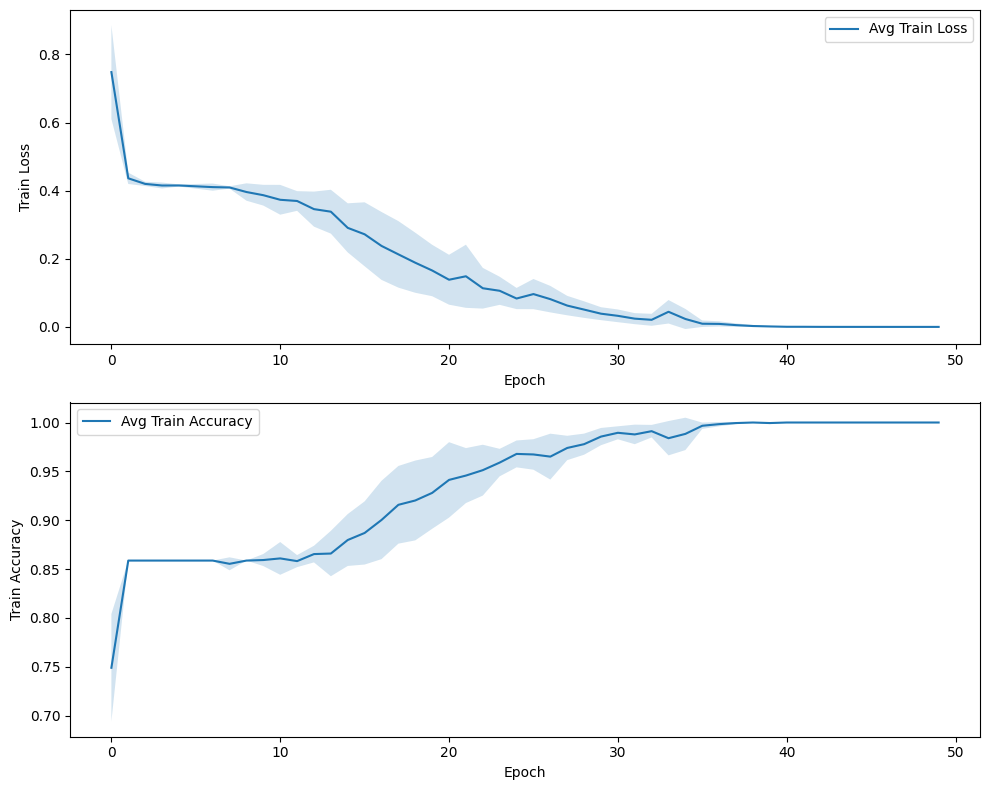

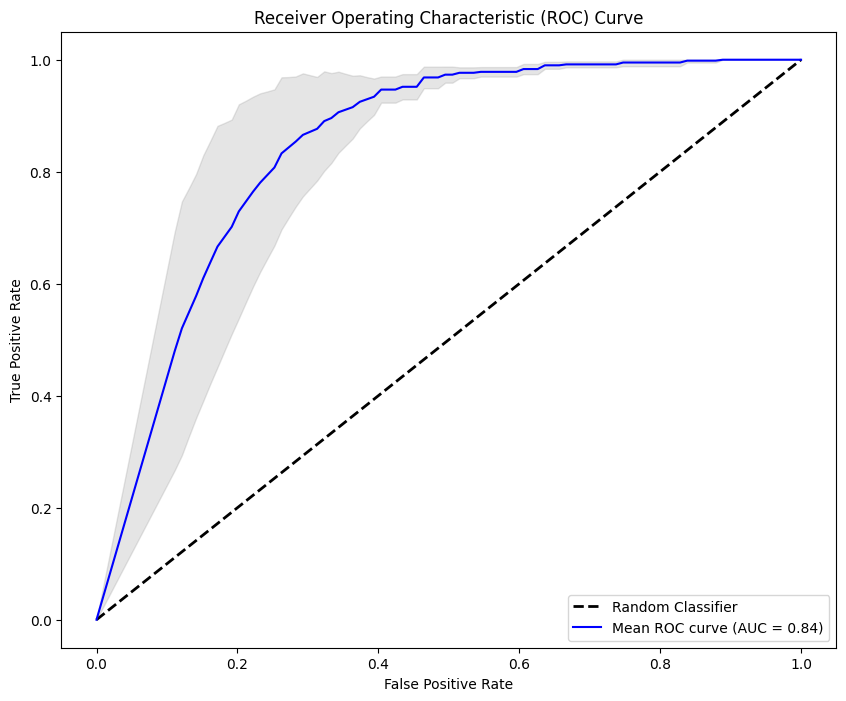

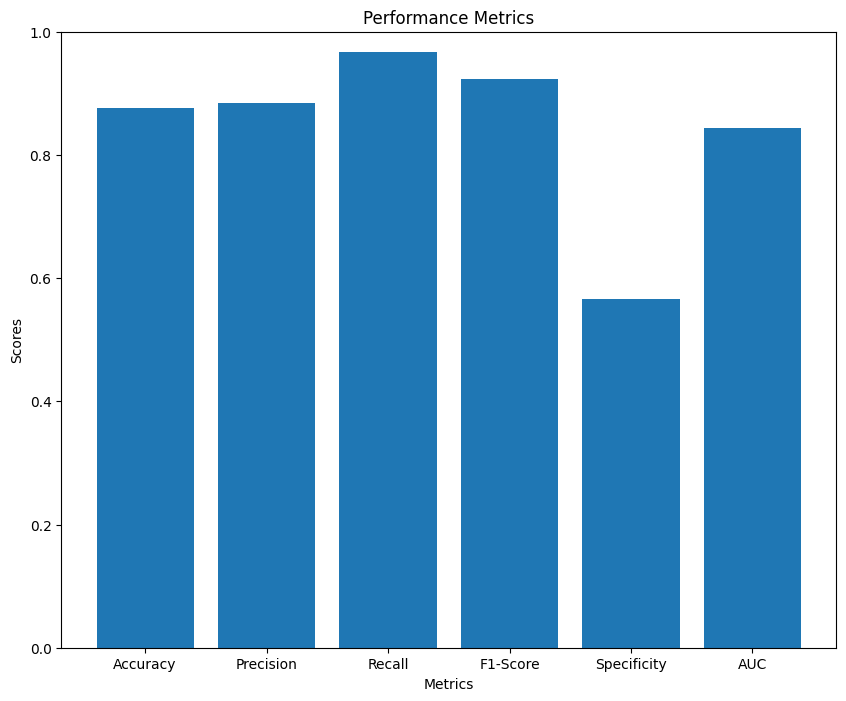

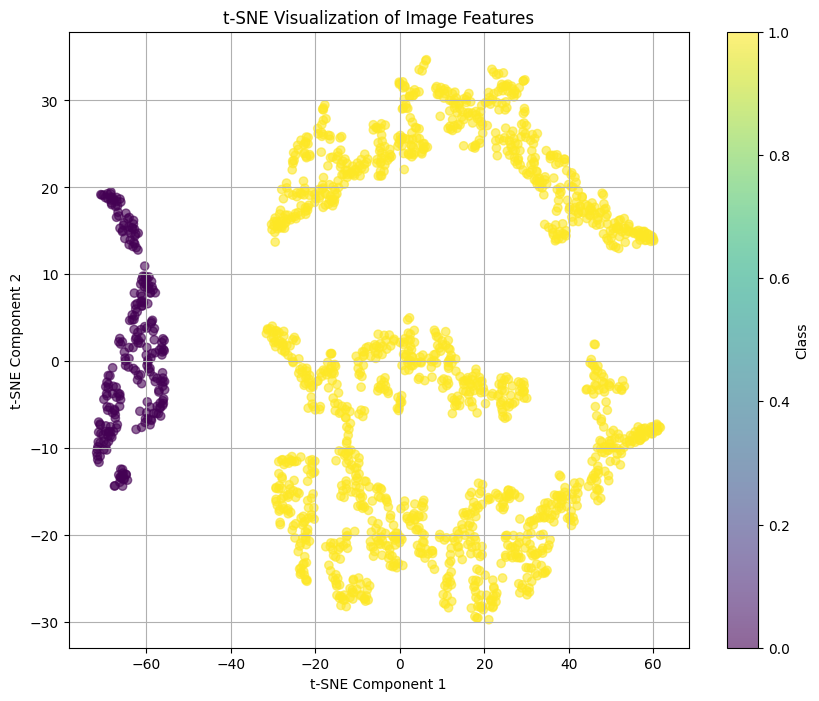

In [ ]:
num_epochs = 50
num_runs = 5


def initialize_model():
    model = nn.Sequential(*Layers1())
    return model


def train_epoch(train_loader, model, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_accuracy = correct / total
    return epoch_loss, epoch_accuracy


def evaluate_model(test_loader, model, device):
    model.eval()
    predictions = []
    true_labels = []
    probas = []
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = outputs.max(1)
            probas.extend(outputs.softmax(dim=1).cpu().numpy())
            predictions.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
    return predictions, true_labels, probas


def get_features(data_loader, model, device):
    model.eval()
    features = []
    labels = []
    with torch.no_grad():
        for inputs, lbls in data_loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            features.append(outputs.cpu().numpy())
            labels.extend(lbls.numpy())
    return np.concatenate(features), np.array(labels)


def run_experiment(hparams, num_runs=5):

    train_data, test_data = train_test_split(combined_data, test_size=0.3, random_state=42)


    train_loader = torch.utils.data.DataLoader(train_data, batch_size=hparams['batch_size'], shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_data, batch_size=hparams['test_batch_size'], shuffle=False)

    all_tr_losses = []
    all_tr_accuracies = []
    all_te_accs = []
    all_precisions = []
    all_recalls = []
    all_f1s = []
    all_specificities = []
    all_conf_matrices = []
    all_roc_aucs = []
    mean_fpr = np.linspace(0, 1, 100)
    tprs = []
    all_features = []
    all_labels = []

    for run in range(num_runs):
        print(f'Run {run + 1}/{num_runs}')


        model = initialize_model().to(hparams['device'])
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=hparams["learning_rate"])

        tr_losses = []
        tr_accuracies = []

        for epoch in range(1, hparams['num_epochs'] + 1):
            train_loss, train_accuracy = train_epoch(train_loader, model, optimizer, criterion, hparams['device'])
            tr_losses.append(train_loss)
            tr_accuracies.append(train_accuracy)
            print(f"Epoch {epoch}/{hparams['num_epochs']}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")

        test_predictions, test_labels, test_probas = evaluate_model(test_loader, model, hparams['device'])
        test_accuracy = accuracy_score(test_labels, test_predictions)
        conf_matrix = confusion_matrix(test_labels, test_predictions)
        precision = precision_score(test_labels, test_predictions, zero_division=1)
        recall = recall_score(test_labels, test_predictions, zero_division=1)
        f1 = f1_score(test_labels, test_predictions, zero_division=1)
        specificity = conf_matrix[0, 0] / (conf_matrix[0, 0] + conf_matrix[0, 1]) if (conf_matrix[0, 0] + conf_matrix[0, 1]) > 0 else 0


        fpr, tpr, _ = roc_curve(test_labels, np.array(test_probas)[:, 1])
        roc_auc = auc(fpr, tpr)
        all_roc_aucs.append(roc_auc)


        interp_tpr = np.interp(mean_fpr, fpr, tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)

        print(f"Run {run + 1}: Test Accuracy: {test_accuracy:.4f}")
        print("Confusion Matrix:")
        print(conf_matrix)
        print(f"Precision: {precision:.4f}")
        print(f"Recall: {recall:.4f}")
        print(f"F1-Score: {f1:.4f}")
        print(f"Specificity: {specificity:.4f}")
        print(f"ROC AUC: {roc_auc:.4f}")

        all_tr_losses.append(tr_losses)
        all_tr_accuracies.append(tr_accuracies)
        all_te_accs.append(test_accuracy)
        all_precisions.append(precision)
        all_recalls.append(recall)
        all_f1s.append(f1)
        all_specificities.append(specificity)
        all_conf_matrices.append(conf_matrix)


        train_features, train_lbls = get_features(train_loader, model, hparams['device'])
        all_features.append(train_features)
        all_labels.append(train_lbls)


    avg_tr_losses = np.mean(all_tr_losses, axis=0)
    std_tr_losses = np.std(all_tr_losses, axis=0)
    avg_tr_accuracies = np.mean(all_tr_accuracies, axis=0)
    std_tr_accuracies = np.std(all_tr_accuracies, axis=0)
    avg_te_accs = np.mean(all_te_accs)
    avg_precisions = np.mean(all_precisions)
    avg_recalls = np.mean(all_recalls)
    avg_f1s = np.mean(all_f1s)
    avg_specificities = np.mean(all_specificities)
    avg_roc_auc = np.mean(all_roc_aucs)

    avg_conf_matrix = np.mean(all_conf_matrices, axis=0)


    all_features = np.concatenate(all_features, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    tsne = TSNE(n_components=2, random_state=42)
    features_tsne = tsne.fit_transform(all_features)

    return avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels


hparams = {
    "learning_rate": 0.001,
    "batch_size": 64,
    "test_batch_size": 64,
    "num_epochs": 50,
    "device": 'cuda' if torch.cuda.is_available() else 'cpu'
}


results = run_experiment(hparams, num_runs=num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


# DA (90 degrees)

In [ ]:
mask_rotated_images = []

for image in mask_images:
    mask_rotated_images.append(image)
    duplicated_image = np.copy(image)

    rotated_image_90 = cv2.rotate(duplicated_image, cv2.ROTATE_90_CLOCKWISE)
    mask_rotated_images.append(rotated_image_90)

In [ ]:
num_images = len(mask_rotated_images)
print("Number of images in mask_rotated_images:", num_images)

Number of images in mask_rotated_images: 172


In [ ]:
mri_rotated_images = []

for image in MRI_images:
    mri_rotated_images.append(image)
    duplicated_image = np.copy(image)

    rotated_image_90 = cv2.rotate(duplicated_image, cv2.ROTATE_90_CLOCKWISE)
    mri_rotated_images.append(rotated_image_90)

In [ ]:
num_images_mri = len(mri_rotated_images)
print("Number of images in mri_rotated_images:", num_images_mri)

Number of images in mri_rotated_images: 172


In [ ]:
#Combine rotated mri and rotated mask
combined_images_rotated = np.stack((mri_rotated_images, mask_rotated_images), axis=-1)
print("Shape of combined_images:", combined_images_rotated.shape)

Shape of combined_images: (172, 256, 256, 2)


In [ ]:
combined_images_rotated = torch.tensor(combined_images_rotated, dtype=torch.float32) / 255.0 #normalization
print(combined_images_rotated.shape)

torch.Size([172, 256, 256, 2])


In [ ]:
# Change the order of the axes so that the channels are on the first axis
combined_images_rotated = np.transpose(combined_images_rotated, (0, 3, 1, 2))
print(combined_images_rotated.shape)

torch.Size([172, 2, 256, 256])


In [ ]:
# Create labels (use 0 for 'control')
etiquetas = np.zeros(len(combined_images_rotated), dtype=np.int64)
combined_data = list(zip(combined_images_rotated, etiquetas))

In [ ]:
#Combine rotated_control with rotated_treated
combined_data_total = combined_data.copy()
combined_data_total.extend(combined_data_tr)

combined_data = combined_data_total

In [ ]:
train_data, test_data = train_test_split(combined_data, test_size=0.3, random_state=42)

print("Tamaño de train_data:", len(train_data))
print("Tamaño de test_data:", len(test_data))

Tamaño de train_data: 421
Tamaño de test_data: 181


In [ ]:
train_loader = torch.utils.data.DataLoader(
    train_data,
    batch_size=hparams['batch_size'],
    shuffle=True)

test_loader = torch.utils.data.DataLoader(
    test_data,
    batch_size=hparams['test_batch_size'],
    shuffle=False)

Run 1/5
Epoch 1/50, Train Loss: 0.8906, Train Accuracy: 0.5914
Epoch 2/50, Train Loss: 0.6573, Train Accuracy: 0.7340
Epoch 3/50, Train Loss: 0.5739, Train Accuracy: 0.7340
Epoch 4/50, Train Loss: 0.5800, Train Accuracy: 0.7340
Epoch 5/50, Train Loss: 0.5829, Train Accuracy: 0.7340
Epoch 6/50, Train Loss: 0.5714, Train Accuracy: 0.7340
Epoch 7/50, Train Loss: 0.4863, Train Accuracy: 0.7933
Epoch 8/50, Train Loss: 0.3193, Train Accuracy: 0.8646
Epoch 9/50, Train Loss: 0.3386, Train Accuracy: 0.8551
Epoch 10/50, Train Loss: 0.2633, Train Accuracy: 0.8931
Epoch 11/50, Train Loss: 0.2225, Train Accuracy: 0.9169
Epoch 12/50, Train Loss: 0.2697, Train Accuracy: 0.8907
Epoch 13/50, Train Loss: 0.2540, Train Accuracy: 0.9026
Epoch 14/50, Train Loss: 0.2162, Train Accuracy: 0.9074
Epoch 15/50, Train Loss: 0.1890, Train Accuracy: 0.9192
Epoch 16/50, Train Loss: 0.1848, Train Accuracy: 0.9145
Epoch 17/50, Train Loss: 0.1558, Train Accuracy: 0.9359
Epoch 18/50, Train Loss: 0.1697, Train Accuracy: 

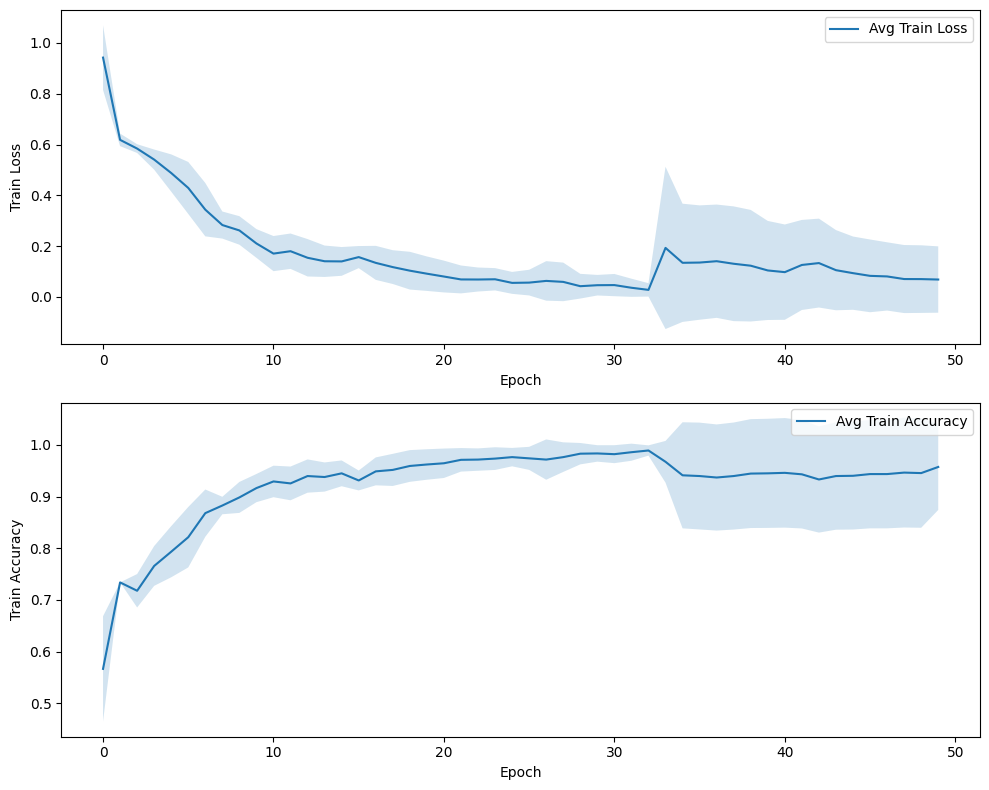

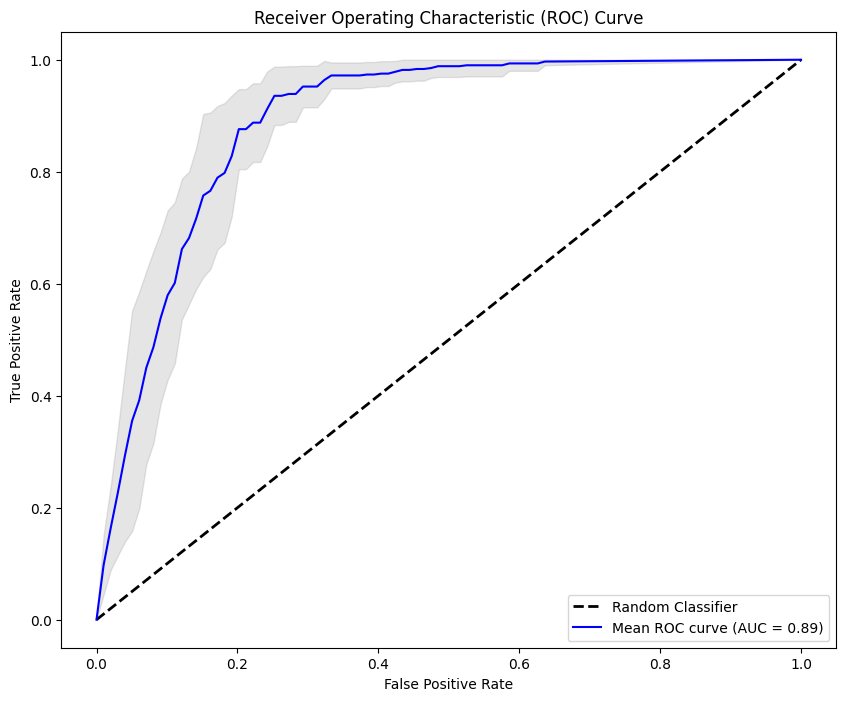

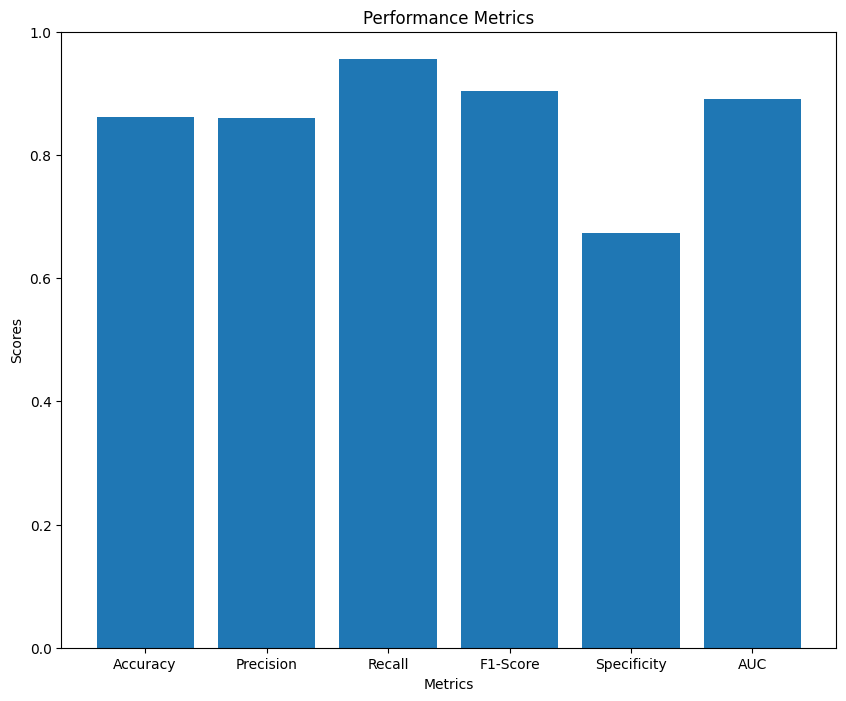

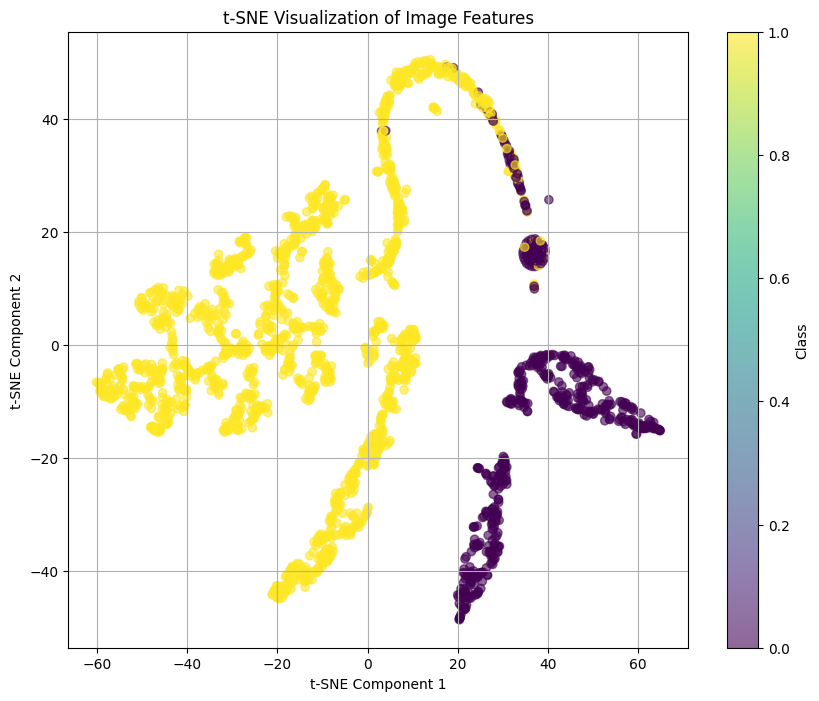

In [ ]:
num_epochs = 50
num_runs = 5


def initialize_model():
    model = nn.Sequential(*Layers1())
    return model


results = run_experiment(hparams, num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()

# DA (-90 degrees)

In [ ]:
mask_rotated_images = []

for image in mask_images:
    mask_rotated_images.append(image)
    duplicated_image = np.copy(image)

    rotated_image_90 = cv2.rotate(duplicated_image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    mask_rotated_images.append(rotated_image_90)

In [ ]:
num_images = len(mask_rotated_images)
print("Number of images in mask_rotated_images:", num_images)

Number of images in mask_rotated_images: 172


In [ ]:
mri_rotated_images = []

for image in MRI_images:
    mri_rotated_images.append(image)
    duplicated_image = np.copy(image)

    rotated_image_90 = cv2.rotate(duplicated_image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    mri_rotated_images.append(rotated_image_90)

In [ ]:
num_images_mri = len(mri_rotated_images)
print("Number of images in mri_rotated_images:", num_images_mri)

Number of images in mri_rotated_images: 172


In [ ]:
#Combine rotated mri and rotated mask
combined_images_rotated = np.stack((mri_rotated_images, mask_rotated_images), axis=-1)
print("Shape of combined_images:", combined_images_rotated.shape)

Shape of combined_images: (172, 256, 256, 2)


In [ ]:
combined_images_rotated = torch.tensor(combined_images_rotated, dtype=torch.float32) / 255.0 #normalization
print(combined_images_rotated.shape)

torch.Size([172, 256, 256, 2])


In [ ]:
# Change the order of the axes so that the channels are on the first axis
combined_images_rotated = np.transpose(combined_images_rotated, (0, 3, 1, 2))
print(combined_images_rotated.shape)

torch.Size([172, 2, 256, 256])


In [ ]:
# Create labels (use 0 for 'control')
etiquetas = np.zeros(len(combined_images_rotated), dtype=np.int64)
combined_data = list(zip(combined_images_rotated, etiquetas))

In [ ]:
#Combine rotated_control with rotated_treated
combined_data_total = combined_data.copy()
combined_data_total.extend(combined_data_tr)

combined_data = combined_data_total

In [ ]:
train_data, test_data = train_test_split(combined_data, test_size=0.3, random_state=42)

print("Tamaño de train_data:", len(train_data))
print("Tamaño de test_data:", len(test_data))

Tamaño de train_data: 421
Tamaño de test_data: 181


In [ ]:
train_loader = torch.utils.data.DataLoader(
    train_data,
    batch_size=hparams['batch_size'],
    shuffle=True)

test_loader = torch.utils.data.DataLoader(
    test_data,
    batch_size=hparams['test_batch_size'],
    shuffle=False)

Run 1/5
Epoch 1/50, Train Loss: 0.8030, Train Accuracy: 0.6152
Epoch 2/50, Train Loss: 0.5875, Train Accuracy: 0.7340
Epoch 3/50, Train Loss: 0.5832, Train Accuracy: 0.7340
Epoch 4/50, Train Loss: 0.6013, Train Accuracy: 0.7340
Epoch 5/50, Train Loss: 0.6023, Train Accuracy: 0.7340
Epoch 6/50, Train Loss: 0.5906, Train Accuracy: 0.7340
Epoch 7/50, Train Loss: 0.5748, Train Accuracy: 0.7340
Epoch 8/50, Train Loss: 0.5971, Train Accuracy: 0.7126
Epoch 9/50, Train Loss: 0.5523, Train Accuracy: 0.7340
Epoch 10/50, Train Loss: 0.3890, Train Accuracy: 0.8741
Epoch 11/50, Train Loss: 0.3108, Train Accuracy: 0.8789
Epoch 12/50, Train Loss: 0.2391, Train Accuracy: 0.9169
Epoch 13/50, Train Loss: 0.2376, Train Accuracy: 0.9121
Epoch 14/50, Train Loss: 0.1648, Train Accuracy: 0.9382
Epoch 15/50, Train Loss: 0.1554, Train Accuracy: 0.9406
Epoch 16/50, Train Loss: 0.1550, Train Accuracy: 0.9406
Epoch 17/50, Train Loss: 0.1588, Train Accuracy: 0.9359
Epoch 18/50, Train Loss: 0.1274, Train Accuracy: 

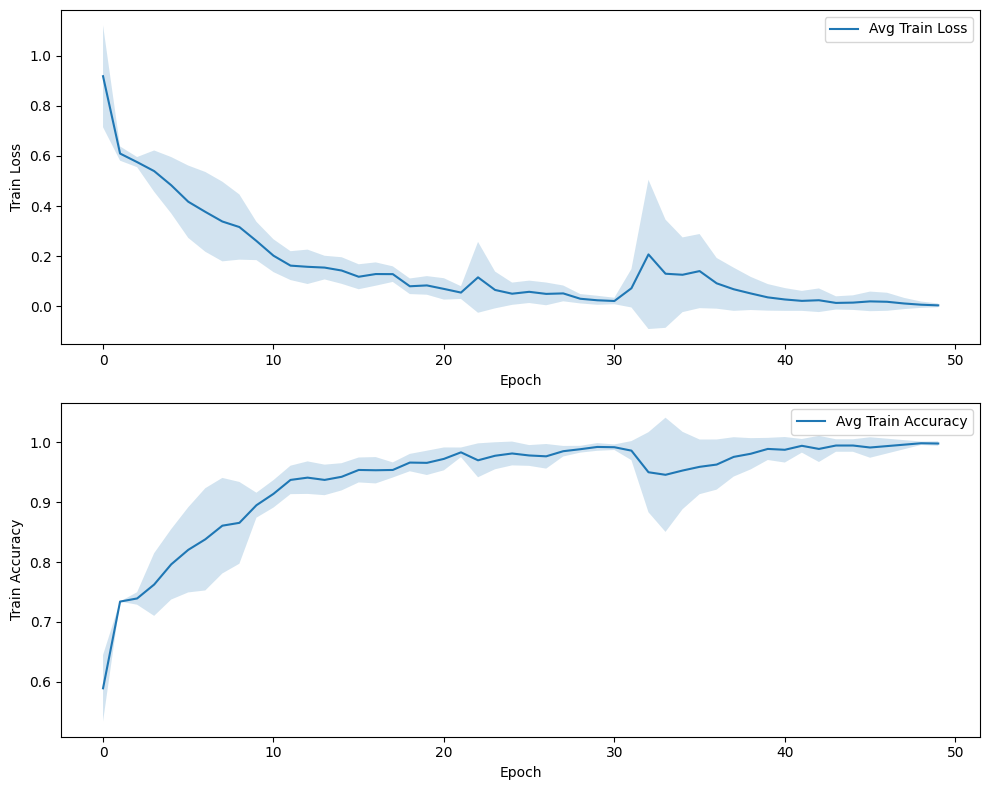

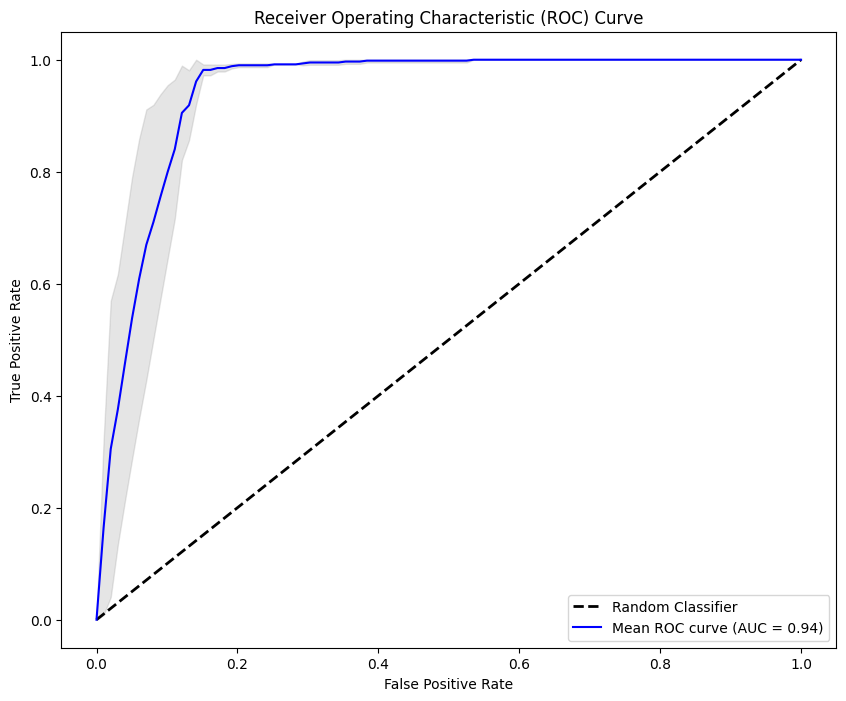

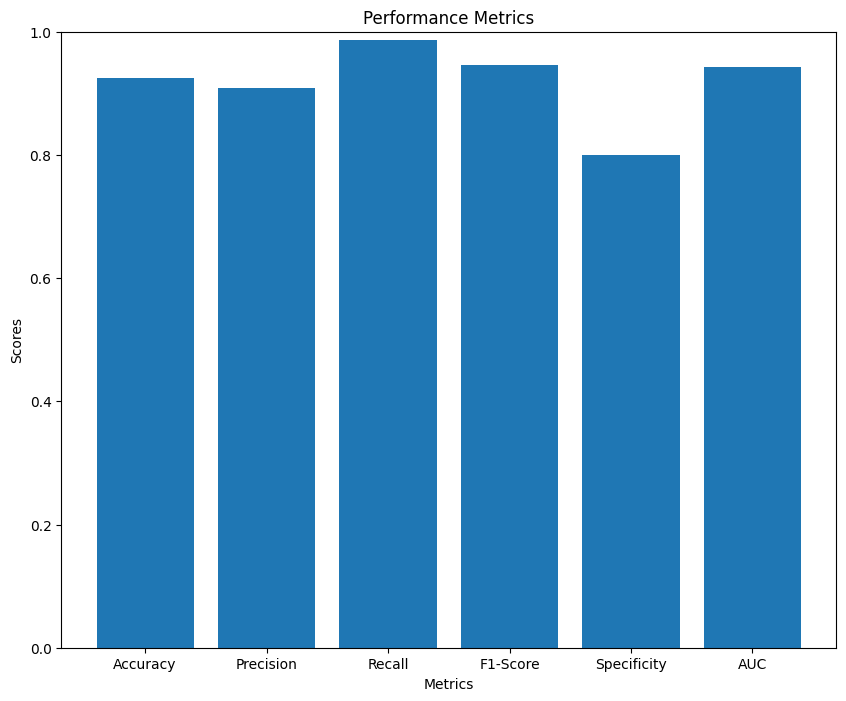

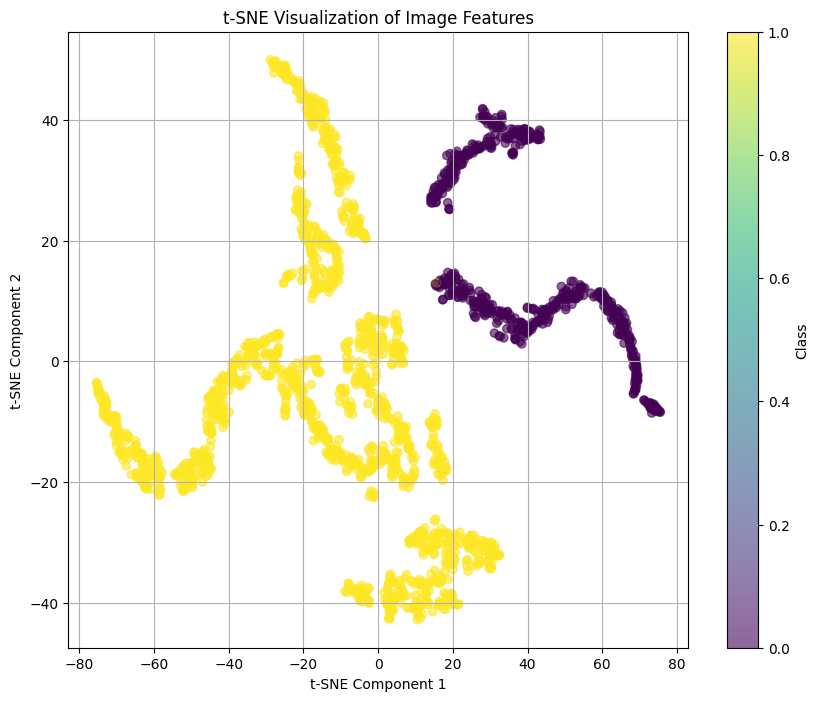

In [ ]:
num_epochs = 50
num_runs = 5


def initialize_model():
    model = nn.Sequential(*Layers1())
    return model


results = run_experiment(hparams, num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()

# DA (180 degrees)

In [ ]:
mask_rotated_images = []

for image in mask_images:
    mask_rotated_images.append(image)
    duplicated_image = np.copy(image)

    rotated_image_90 = cv2.rotate(duplicated_image, cv2.ROTATE_180)
    mask_rotated_images.append(rotated_image_90)

In [ ]:
num_images = len(mask_rotated_images)
print("Number of images in mask_rotated_images:", num_images)

Number of images in mask_rotated_images: 172


In [ ]:
mri_rotated_images = []

for image in MRI_images:
    mri_rotated_images.append(image)
    duplicated_image = np.copy(image)

    rotated_image_90 = cv2.rotate(duplicated_image, cv2.ROTATE_180)
    mri_rotated_images.append(rotated_image_90)

In [ ]:
num_images_mri = len(mri_rotated_images)
print("Number of images in mri_rotated_images:", num_images_mri)

Number of images in mri_rotated_images: 172


In [ ]:
#Combine rotated mri and rotated mask
combined_images_rotated = np.stack((mri_rotated_images, mask_rotated_images), axis=-1)
print("Shape of combined_images:", combined_images_rotated.shape)

Shape of combined_images: (172, 256, 256, 2)


In [ ]:
combined_images_rotated = torch.tensor(combined_images_rotated, dtype=torch.float32) / 255.0 #normalization
print(combined_images_rotated.shape)

torch.Size([172, 256, 256, 2])


In [ ]:
# Change the order of the axes so that the channels are on the first axis
combined_images_rotated = np.transpose(combined_images_rotated, (0, 3, 1, 2))
print(combined_images_rotated.shape)

torch.Size([172, 2, 256, 256])


In [ ]:
# Create labels (use 0 for 'control')
etiquetas = np.zeros(len(combined_images_rotated), dtype=np.int64)
combined_data = list(zip(combined_images_rotated, etiquetas))

In [ ]:
#Combine rotated_control with rotated_treated
combined_data_total = combined_data.copy()
combined_data_total.extend(combined_data_tr)

combined_data = combined_data_total

In [ ]:
train_data, test_data = train_test_split(combined_data, test_size=0.3, random_state=42)

print("Tamaño de train_data:", len(train_data))
print("Tamaño de test_data:", len(test_data))

Tamaño de train_data: 421
Tamaño de test_data: 181


In [ ]:
train_loader = torch.utils.data.DataLoader(
    train_data,
    batch_size=hparams['batch_size'],
    shuffle=True)

test_loader = torch.utils.data.DataLoader(
    test_data,
    batch_size=hparams['test_batch_size'],
    shuffle=False)

Run 1/5
Epoch 1/50, Train Loss: 0.6832, Train Accuracy: 0.6580
Epoch 2/50, Train Loss: 0.5273, Train Accuracy: 0.7720
Epoch 3/50, Train Loss: 0.3389, Train Accuracy: 0.8551
Epoch 4/50, Train Loss: 0.2535, Train Accuracy: 0.8931
Epoch 5/50, Train Loss: 0.2025, Train Accuracy: 0.9192
Epoch 6/50, Train Loss: 0.1998, Train Accuracy: 0.9169
Epoch 7/50, Train Loss: 0.2088, Train Accuracy: 0.8979
Epoch 8/50, Train Loss: 0.1727, Train Accuracy: 0.9264
Epoch 9/50, Train Loss: 0.1462, Train Accuracy: 0.9406
Epoch 10/50, Train Loss: 0.1201, Train Accuracy: 0.9644
Epoch 11/50, Train Loss: 0.1160, Train Accuracy: 0.9667
Epoch 12/50, Train Loss: 0.0696, Train Accuracy: 0.9762
Epoch 13/50, Train Loss: 0.0460, Train Accuracy: 0.9857
Epoch 14/50, Train Loss: 0.4128, Train Accuracy: 0.9240
Epoch 15/50, Train Loss: 0.1559, Train Accuracy: 0.9454
Epoch 16/50, Train Loss: 0.1411, Train Accuracy: 0.9549
Epoch 17/50, Train Loss: 0.1169, Train Accuracy: 0.9406
Epoch 18/50, Train Loss: 0.0914, Train Accuracy: 

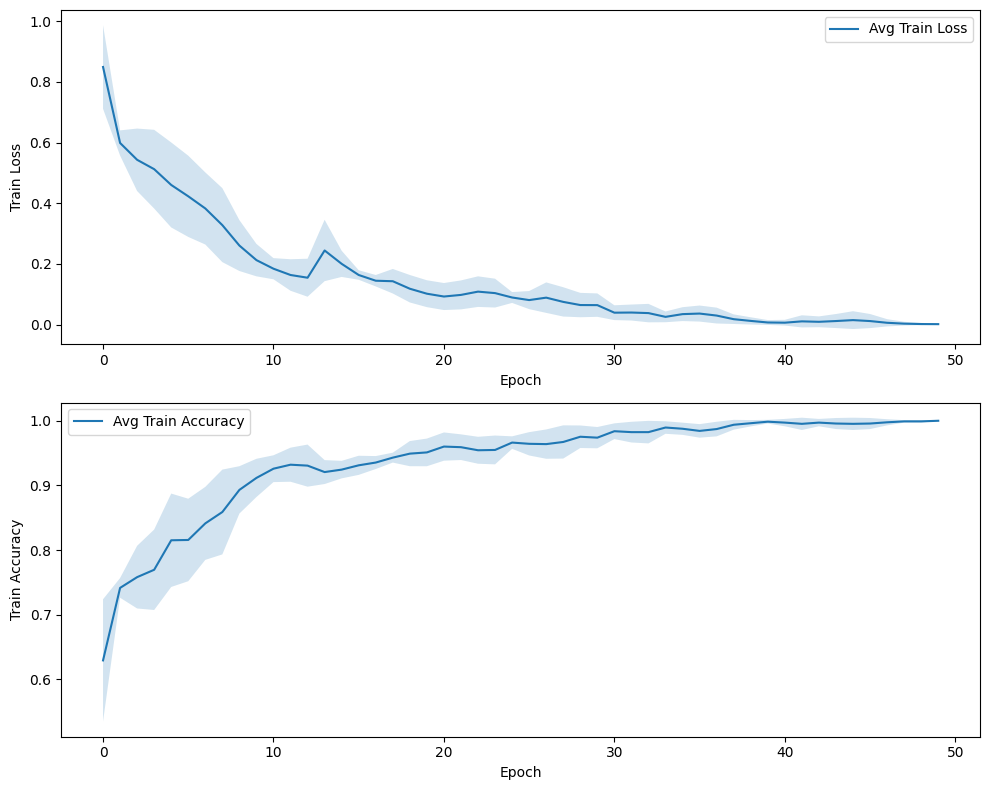

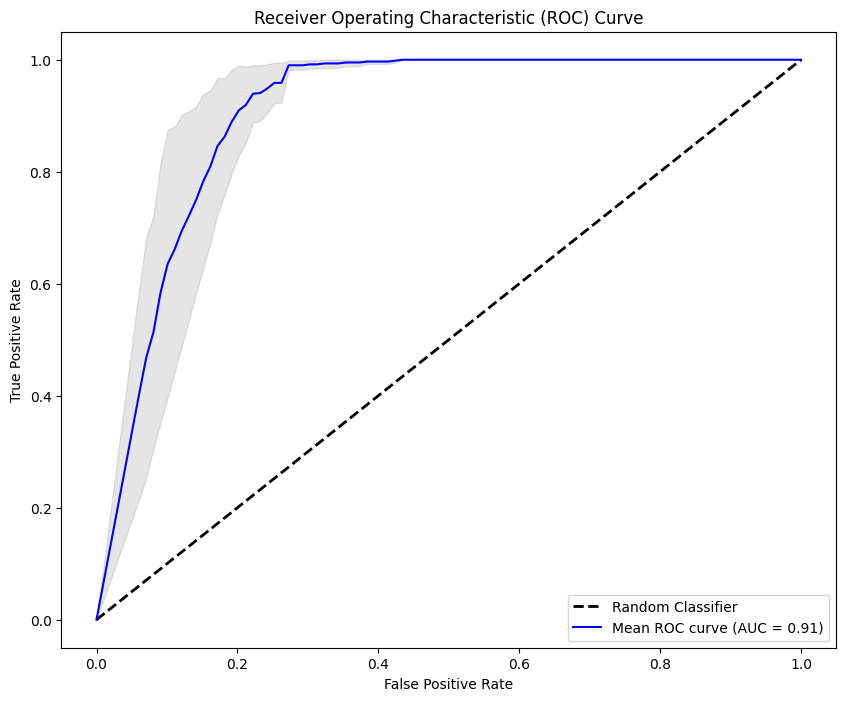

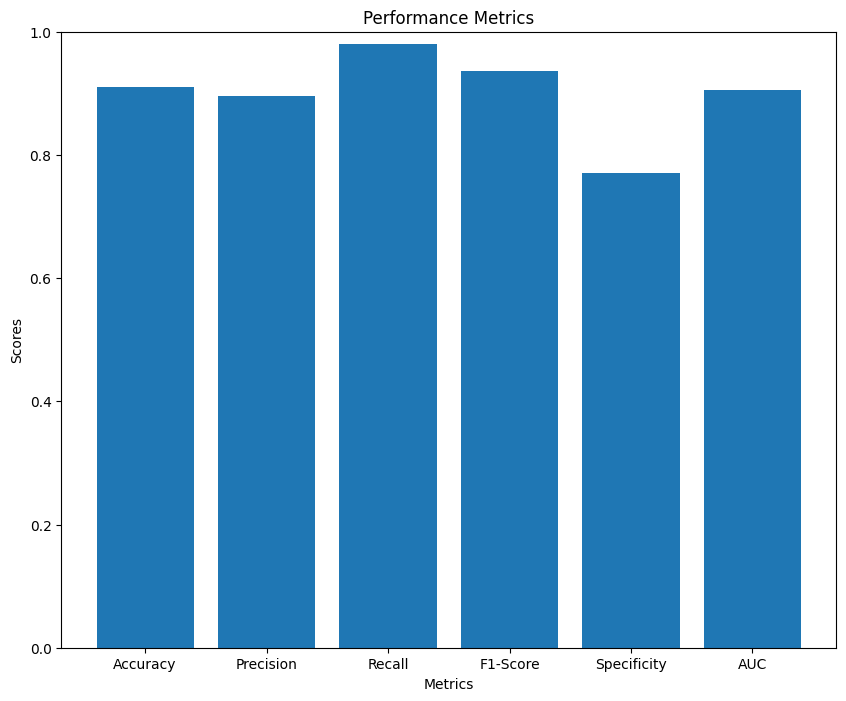

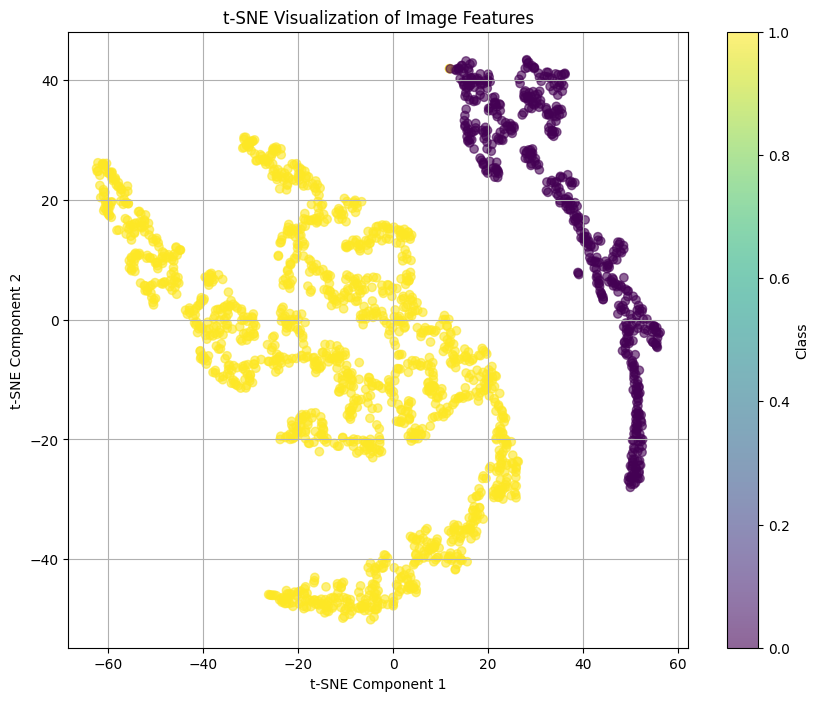

In [ ]:
num_epochs = 50
num_runs = 5


def initialize_model():
    model = nn.Sequential(*Layers1())
    return model


results = run_experiment(hparams, num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()

# DA (flip)

In [ ]:
mask_rotated_images = []

for image in mask_images:
    mask_rotated_images.append(image)
    duplicated_image = np.copy(image)

    flipped_image = cv2.flip(duplicated_image, 1)
    mask_rotated_images.append(flipped_image)

In [ ]:
num_images = len(mask_rotated_images)
print("Number of images in mask_rotated_images:", num_images)

Number of images in mask_rotated_images: 172


In [ ]:
mri_rotated_images = []

for image in MRI_images:
    mri_rotated_images.append(image)
    duplicated_image = np.copy(image)

    flipped_image = cv2.flip(duplicated_image, 1)
    mri_rotated_images.append(flipped_image)

In [ ]:
num_images_mri = len(mri_rotated_images)
print("Number of images in mri_rotated_images:", num_images_mri)

Number of images in mri_rotated_images: 172


In [ ]:
#Combine rotated mri and rotated mask
combined_images_rotated = np.stack((mri_rotated_images, mask_rotated_images), axis=-1)
print("Shape of combined_images:", combined_images_rotated.shape)

Shape of combined_images: (172, 256, 256, 2)


In [ ]:
combined_images_rotated = torch.tensor(combined_images_rotated, dtype=torch.float32) / 255.0 #normalization
print(combined_images_rotated.shape)

torch.Size([172, 256, 256, 2])


In [ ]:
# Change the order of the axes so that the channels are on the first axis
combined_images_rotated = np.transpose(combined_images_rotated, (0, 3, 1, 2))
print(combined_images_rotated.shape)

torch.Size([172, 2, 256, 256])


In [ ]:
# Create labels (use 0 for 'control')
etiquetas = np.zeros(len(combined_images_rotated), dtype=np.int64)
combined_data = list(zip(combined_images_rotated, etiquetas))

In [ ]:
#Combine rotated_control with rotated_treated
combined_data_total = combined_data.copy()
combined_data_total.extend(combined_data_tr)

combined_data = combined_data_total

In [ ]:
train_data, test_data = train_test_split(combined_data, test_size=0.3, random_state=42)

print("Tamaño de train_data:", len(train_data))
print("Tamaño de test_data:", len(test_data))

Tamaño de train_data: 421
Tamaño de test_data: 181


In [ ]:
train_loader = torch.utils.data.DataLoader(
    train_data,
    batch_size=hparams['batch_size'],
    shuffle=True)

test_loader = torch.utils.data.DataLoader(
    test_data,
    batch_size=hparams['test_batch_size'],
    shuffle=False)

Run 1/5
Epoch 1/50, Train Loss: 0.8171, Train Accuracy: 0.5724
Epoch 2/50, Train Loss: 0.5428, Train Accuracy: 0.7577
Epoch 3/50, Train Loss: 0.4090, Train Accuracy: 0.8290
Epoch 4/50, Train Loss: 0.3358, Train Accuracy: 0.8694
Epoch 5/50, Train Loss: 0.2582, Train Accuracy: 0.8907
Epoch 6/50, Train Loss: 0.2006, Train Accuracy: 0.9121
Epoch 7/50, Train Loss: 0.1887, Train Accuracy: 0.8979
Epoch 8/50, Train Loss: 0.1698, Train Accuracy: 0.9264
Epoch 9/50, Train Loss: 0.1601, Train Accuracy: 0.9145
Epoch 10/50, Train Loss: 0.1143, Train Accuracy: 0.9501
Epoch 11/50, Train Loss: 0.1157, Train Accuracy: 0.9454
Epoch 12/50, Train Loss: 0.1420, Train Accuracy: 0.9430
Epoch 13/50, Train Loss: 0.1660, Train Accuracy: 0.9406
Epoch 14/50, Train Loss: 0.1284, Train Accuracy: 0.9501
Epoch 15/50, Train Loss: 0.0859, Train Accuracy: 0.9667
Epoch 16/50, Train Loss: 0.0752, Train Accuracy: 0.9691
Epoch 17/50, Train Loss: 0.0536, Train Accuracy: 0.9762
Epoch 18/50, Train Loss: 0.0666, Train Accuracy: 

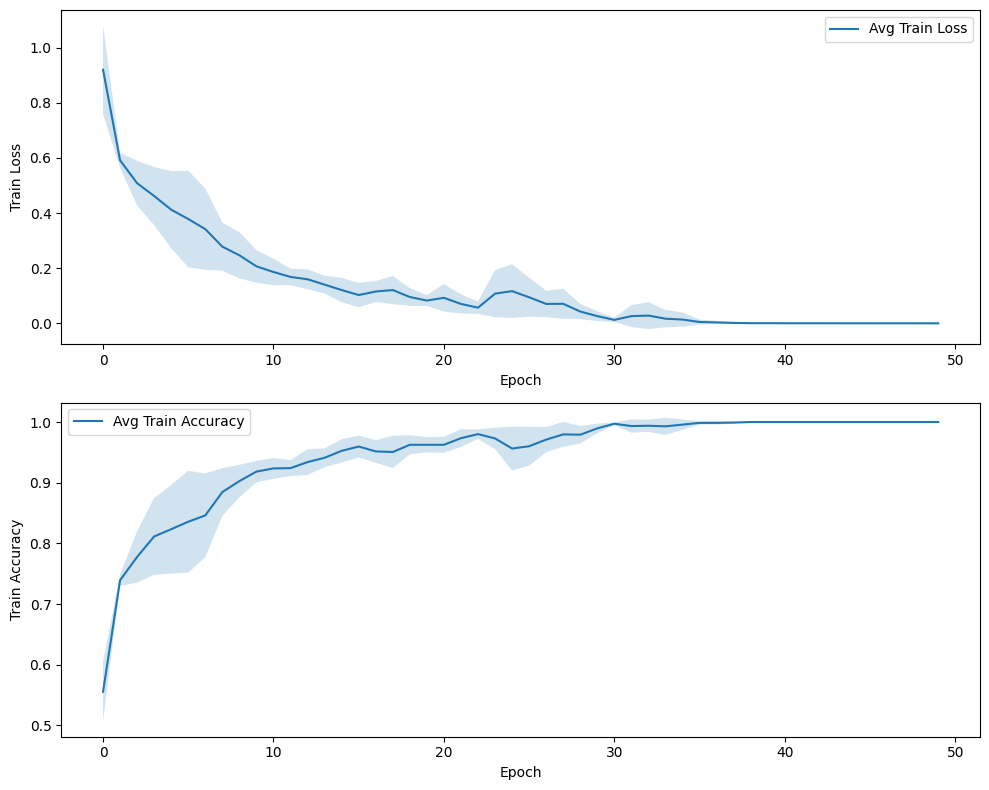

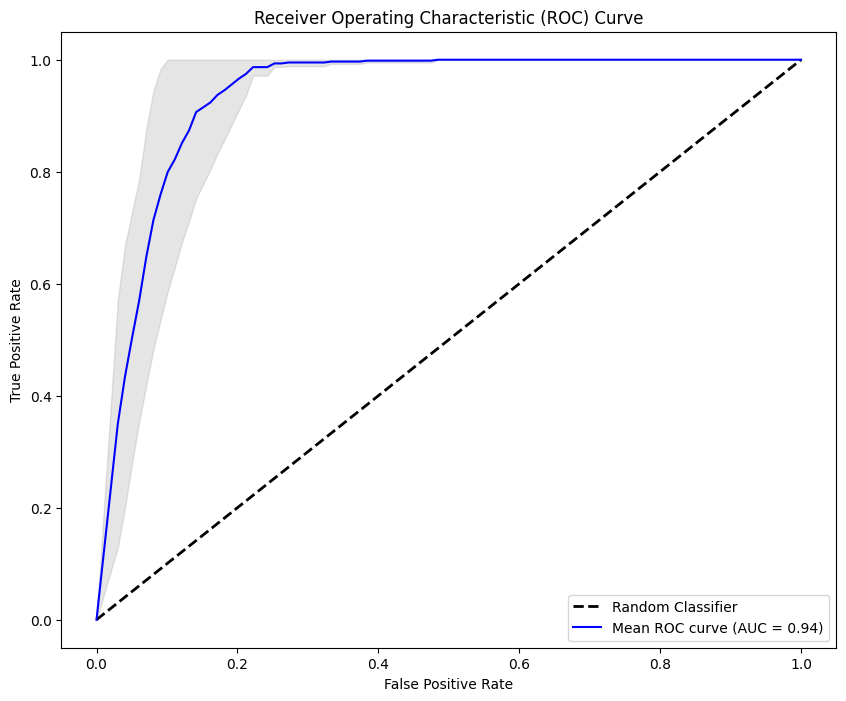

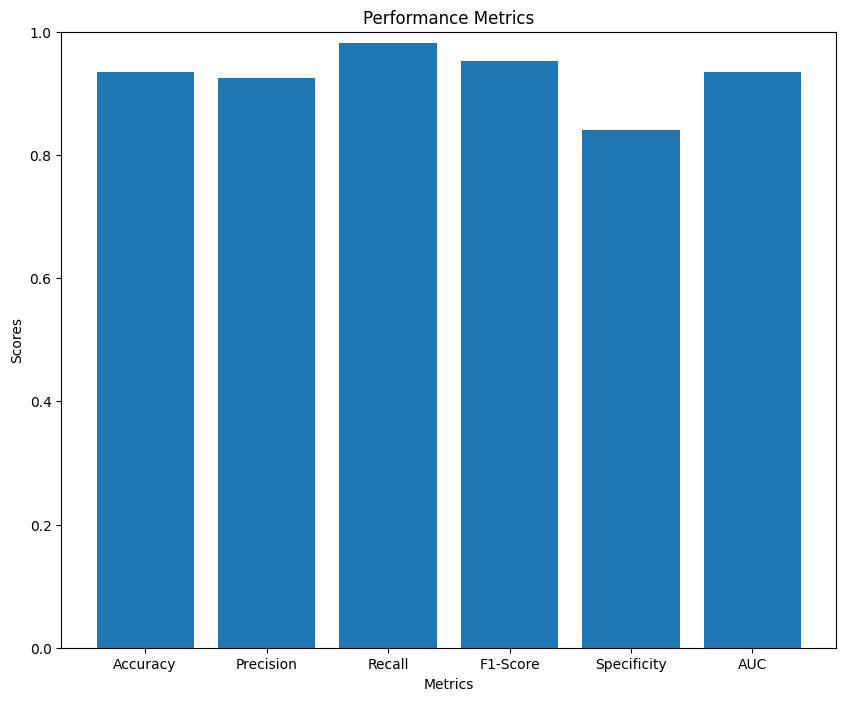

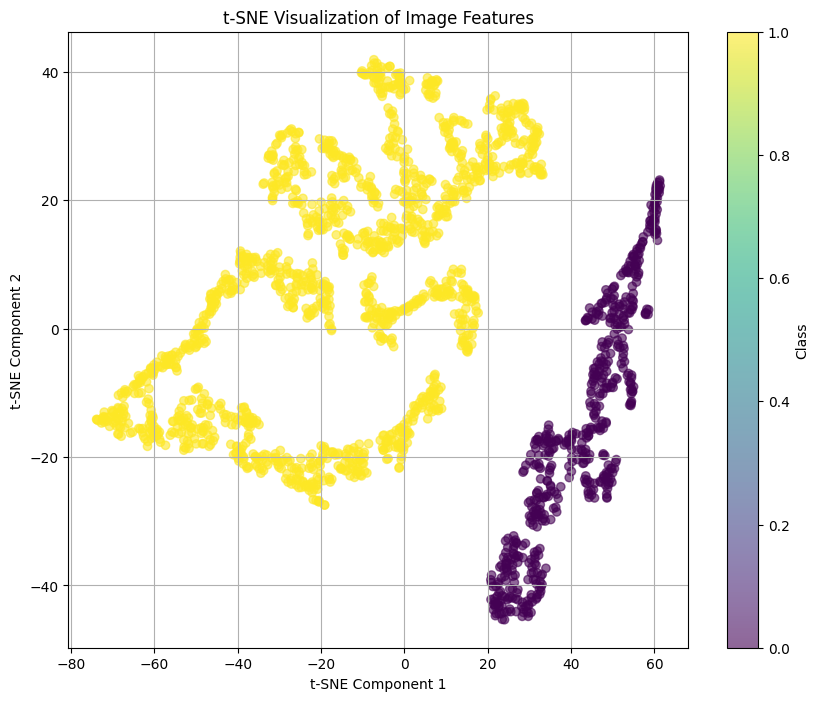

In [ ]:
num_epochs = 50
num_runs = 5


def initialize_model():
    model = nn.Sequential(*Layers1())
    return model


results = run_experiment(hparams, num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()

# Data Augmentation

Data augmentation: solo en control

In [24]:
mask_rotated_images = []

for image in mask_images:
    mask_rotated_images.append(image)
    duplicated_image = np.copy(image)

    rotated_image_90 = cv2.rotate(duplicated_image, cv2.ROTATE_90_CLOCKWISE)
    mask_rotated_images.append(rotated_image_90)

    rotated_image_180 = cv2.rotate(duplicated_image, cv2.ROTATE_180)
    mask_rotated_images.append(rotated_image_180)

    rotated_image_270 = cv2.rotate(duplicated_image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    mask_rotated_images.append(rotated_image_270)

    flipped_image = cv2.flip(duplicated_image, 1)
    mask_rotated_images.append(flipped_image)

In [25]:
num_images = len(mask_rotated_images)
print("Number of images in mask_rotated_images:", num_images)

Number of images in mask_rotated_images: 430


In [26]:
mri_rotated_images = []

for image in MRI_images:
    mri_rotated_images.append(image)
    duplicated_image = np.copy(image)

    rotated_image_90 = cv2.rotate(duplicated_image, cv2.ROTATE_90_CLOCKWISE)
    mri_rotated_images.append(rotated_image_90)

    rotated_image_180 = cv2.rotate(duplicated_image, cv2.ROTATE_180)
    mri_rotated_images.append(rotated_image_180)

    rotated_image_270 = cv2.rotate(duplicated_image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    mri_rotated_images.append(rotated_image_270)

    flipped_image = cv2.flip(duplicated_image, 1)
    mri_rotated_images.append(flipped_image)

In [27]:
num_images_mri = len(mri_rotated_images)
print("Number of images in mri_rotated_images:", num_images_mri)

Number of images in mri_rotated_images: 430


In [28]:
#Combine rotated mri and rotated mask
combined_images_rotated = np.stack((mri_rotated_images, mask_rotated_images), axis=-1)
print("Shape of combined_images:", combined_images_rotated.shape)

Shape of combined_images: (430, 256, 256, 2)


In [29]:
combined_images_rotated = torch.tensor(combined_images_rotated, dtype=torch.float32) / 255.0 #normalization
print(combined_images_rotated.shape)

torch.Size([430, 256, 256, 2])


In [30]:
# Change the order of the axes so that the channels are on the first axis
combined_images_rotated = np.transpose(combined_images_rotated, (0, 3, 1, 2))
print(combined_images_rotated.shape)

torch.Size([430, 2, 256, 256])


In [31]:
# Create labels (use 0 for 'control')
etiquetas = np.zeros(len(combined_images_rotated), dtype=np.int64)
combined_data = list(zip(combined_images_rotated, etiquetas))

In [32]:
#Combine rotated_control with rotated_treated
combined_data_total = combined_data.copy()
combined_data_total.extend(combined_data_tr)

combined_data = combined_data_total

In [33]:
train_data, test_data = train_test_split(combined_data, test_size=0.3, random_state=42)

print("Tamaño de train_data:", len(train_data))
print("Tamaño de test_data:", len(test_data))

Tamaño de train_data: 602
Tamaño de test_data: 258


In [34]:
train_loader = torch.utils.data.DataLoader(
    train_data,
    batch_size=hparams['batch_size'],
    shuffle=True)

test_loader = torch.utils.data.DataLoader(
    test_data,
    batch_size=hparams['test_batch_size'],
    shuffle=False)

# Custom model with DA

Run 1/5
Epoch 1/50, Train Loss: 0.8799, Train Accuracy: 0.5681
Epoch 2/50, Train Loss: 0.6793, Train Accuracy: 0.7957
Epoch 3/50, Train Loss: 0.4205, Train Accuracy: 0.8621
Epoch 4/50, Train Loss: 0.3182, Train Accuracy: 0.8688
Epoch 5/50, Train Loss: 0.2446, Train Accuracy: 0.8920
Epoch 6/50, Train Loss: 0.2025, Train Accuracy: 0.9203
Epoch 7/50, Train Loss: 0.1789, Train Accuracy: 0.9236
Epoch 8/50, Train Loss: 0.1642, Train Accuracy: 0.9302
Epoch 9/50, Train Loss: 0.1930, Train Accuracy: 0.9086
Epoch 10/50, Train Loss: 0.1620, Train Accuracy: 0.9286
Epoch 11/50, Train Loss: 0.1410, Train Accuracy: 0.9468
Epoch 12/50, Train Loss: 0.1512, Train Accuracy: 0.9252
Epoch 13/50, Train Loss: 0.1457, Train Accuracy: 0.9352
Epoch 14/50, Train Loss: 0.1199, Train Accuracy: 0.9518
Epoch 15/50, Train Loss: 0.1126, Train Accuracy: 0.9551
Epoch 16/50, Train Loss: 0.1227, Train Accuracy: 0.9485
Epoch 17/50, Train Loss: 0.1101, Train Accuracy: 0.9468
Epoch 18/50, Train Loss: 0.1102, Train Accuracy: 

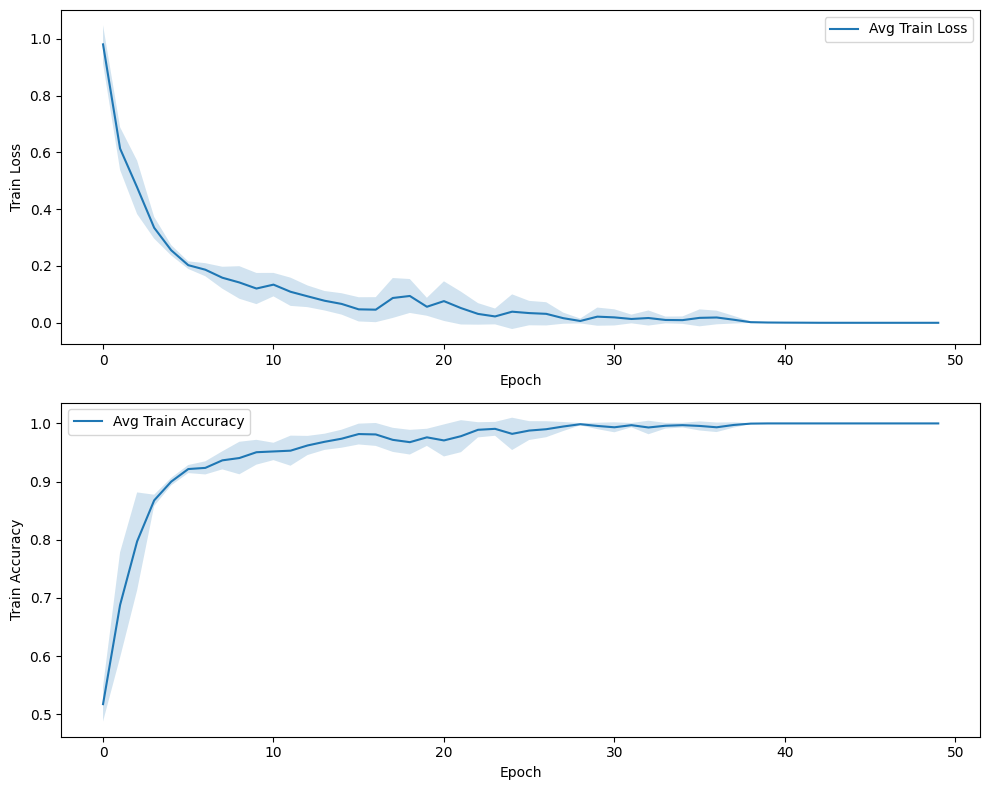

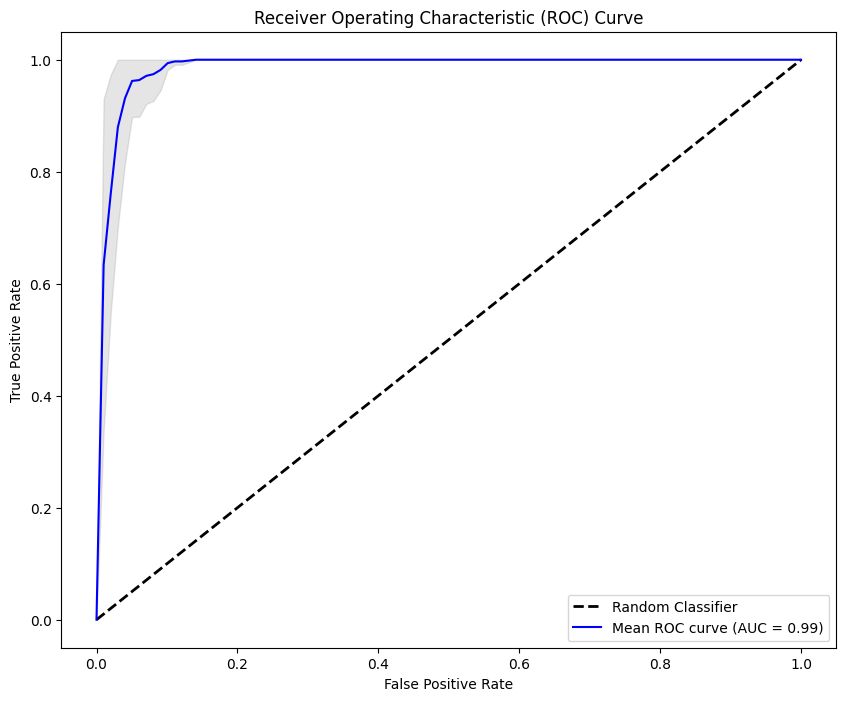

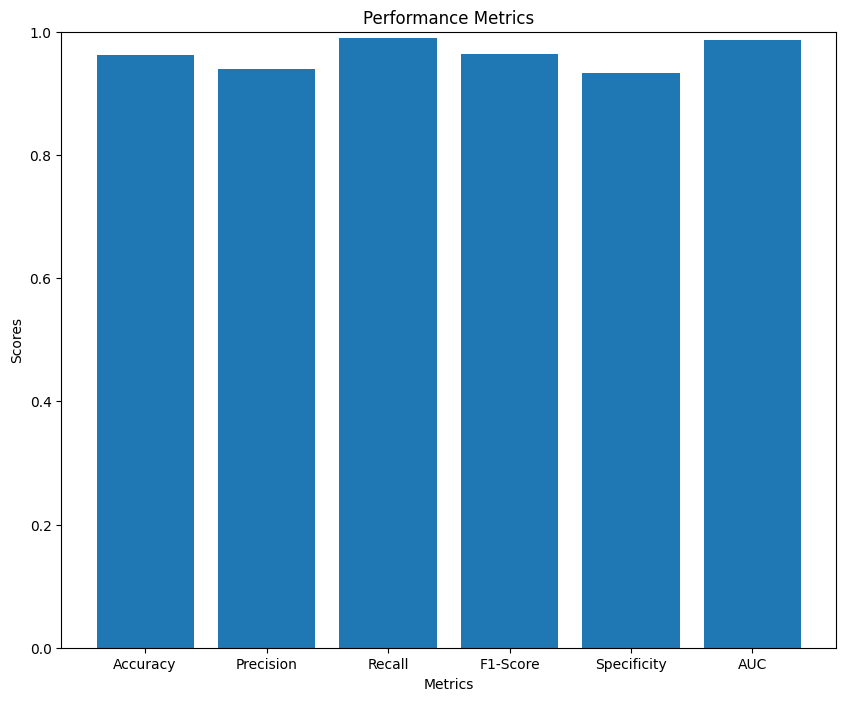

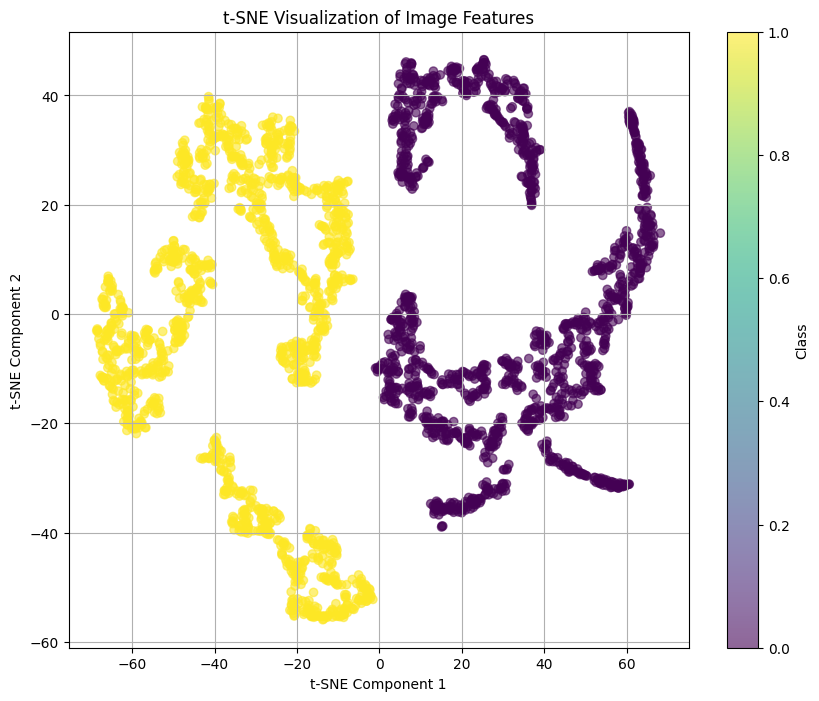

In [ ]:
num_epochs = 50
num_runs = 5


def initialize_model():
    model = nn.Sequential(*Layers1())
    return model


results = run_experiment(hparams, num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


# Custom model with DA and batch norm

Run 1/5
Epoch 1/50, Train Loss: 16.2737, Train Accuracy: 0.7027
Epoch 2/50, Train Loss: 3.9842, Train Accuracy: 0.8206
Epoch 3/50, Train Loss: 1.5580, Train Accuracy: 0.8571
Epoch 4/50, Train Loss: 0.6621, Train Accuracy: 0.9037
Epoch 5/50, Train Loss: 0.6596, Train Accuracy: 0.9070
Epoch 6/50, Train Loss: 0.3513, Train Accuracy: 0.9186
Epoch 7/50, Train Loss: 0.3013, Train Accuracy: 0.9419
Epoch 8/50, Train Loss: 0.1970, Train Accuracy: 0.9452
Epoch 9/50, Train Loss: 0.1674, Train Accuracy: 0.9485
Epoch 10/50, Train Loss: 0.0839, Train Accuracy: 0.9734
Epoch 11/50, Train Loss: 0.0301, Train Accuracy: 0.9817
Epoch 12/50, Train Loss: 0.0338, Train Accuracy: 0.9850
Epoch 13/50, Train Loss: 0.0105, Train Accuracy: 0.9934
Epoch 14/50, Train Loss: 0.0132, Train Accuracy: 0.9950
Epoch 15/50, Train Loss: 0.0023, Train Accuracy: 1.0000
Epoch 16/50, Train Loss: 0.0011, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0008, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0007, Train Accuracy:

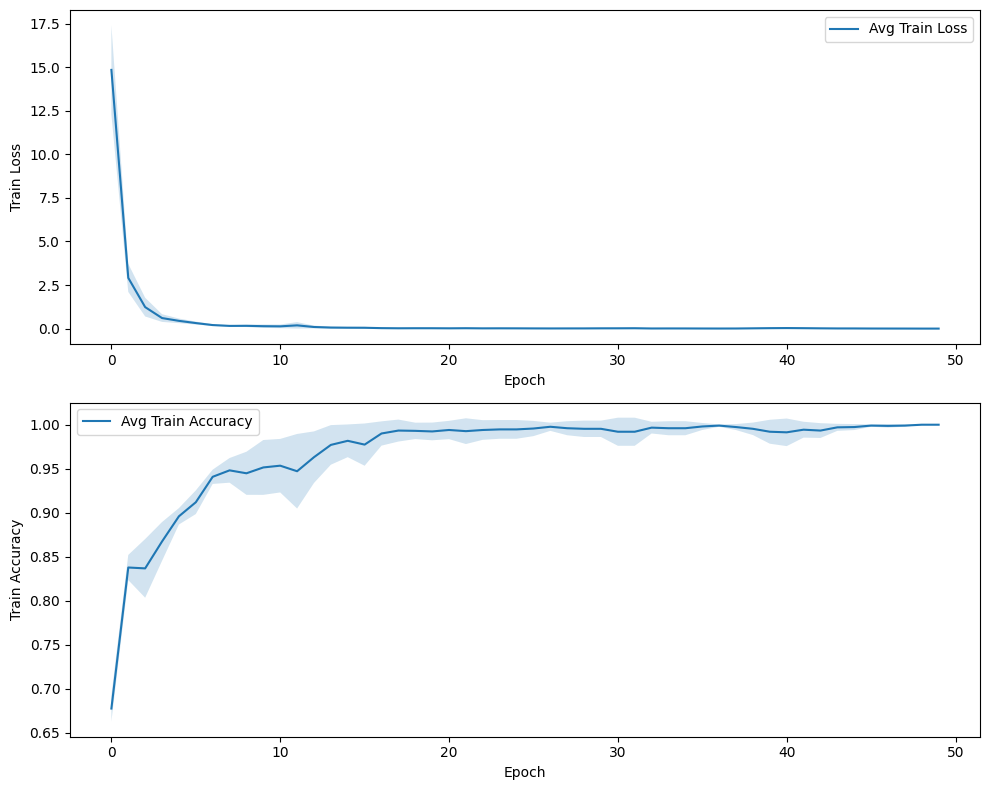

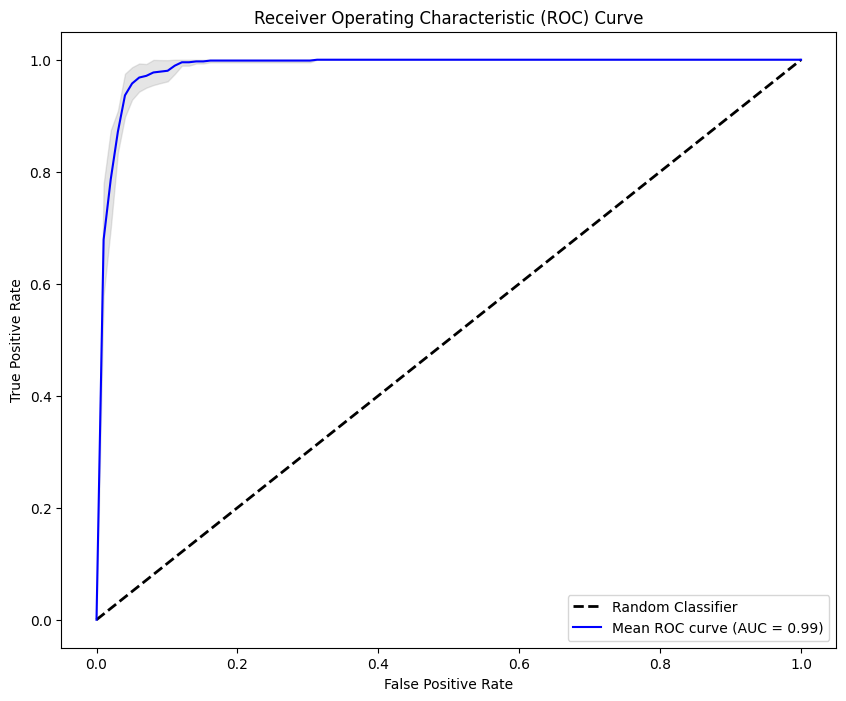

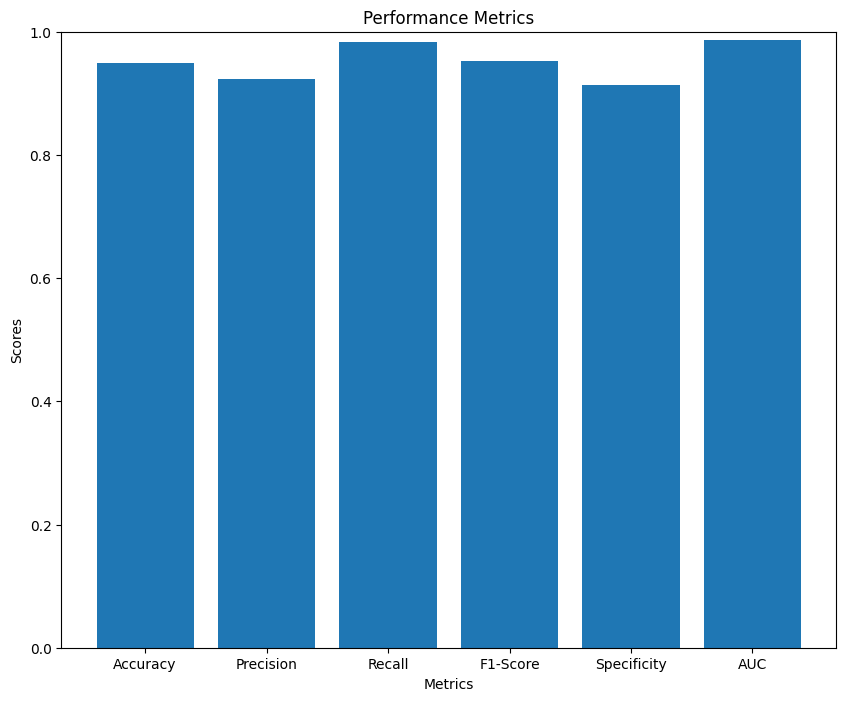

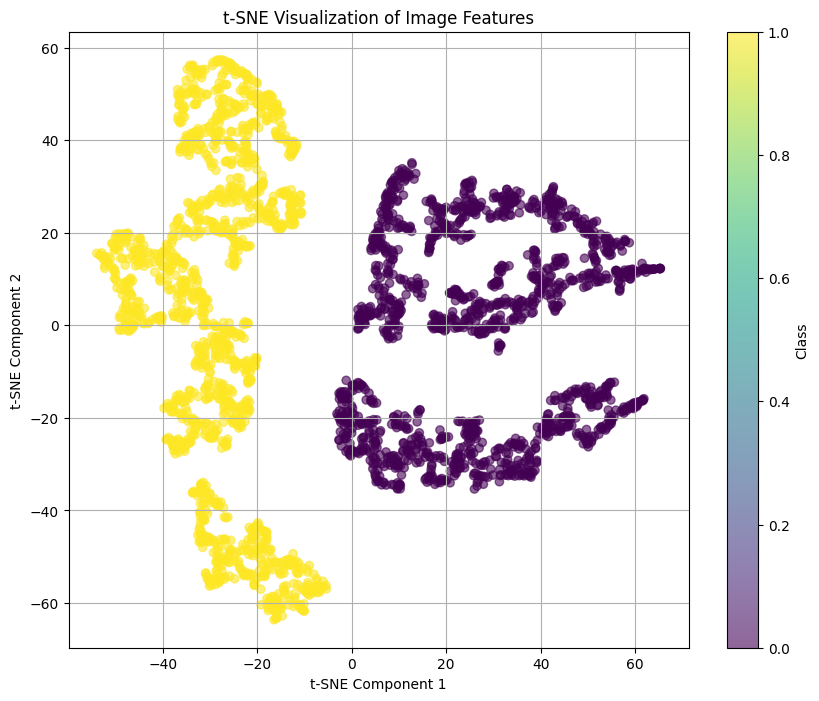

In [ ]:
num_epochs = 50
num_runs = 5


def initialize_model():
    model=nn.Sequential(*LayersBatchNorm())
    return model


results = run_experiment(hparams, num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


# TRANSFER LEARNING: fine-tuning

TRANSFER LEARNING

In [35]:
# Let's define some hyper-parameters
hparams = {
    'batch_size':64,
    'num_epochs':50,
    'test_batch_size':64,
    'num_classes':2,
    'learning_rate':1e-3,
    'log_interval':100,
}

# we select to work on GPU if it is available in the machine, otherwise
# will run on CPU
hparams['device'] = 'cuda' if torch.cuda.is_available() else 'cpu'
hparams['device']

'cuda'

# ResNet

ResNet18

Run 1/5


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 147MB/s]


Epoch 1/50, Train Loss: 0.5532, Train Accuracy: 0.7757
Epoch 2/50, Train Loss: 0.1270, Train Accuracy: 0.9452
Epoch 3/50, Train Loss: 0.0826, Train Accuracy: 0.9618
Epoch 4/50, Train Loss: 0.0287, Train Accuracy: 0.9900
Epoch 5/50, Train Loss: 0.0074, Train Accuracy: 1.0000
Epoch 6/50, Train Loss: 0.0048, Train Accuracy: 1.0000
Epoch 7/50, Train Loss: 0.0024, Train Accuracy: 1.0000
Epoch 8/50, Train Loss: 0.0030, Train Accuracy: 0.9983
Epoch 9/50, Train Loss: 0.0157, Train Accuracy: 0.9950
Epoch 10/50, Train Loss: 0.0103, Train Accuracy: 0.9967
Epoch 11/50, Train Loss: 0.0048, Train Accuracy: 1.0000
Epoch 12/50, Train Loss: 0.0030, Train Accuracy: 0.9983
Epoch 13/50, Train Loss: 0.0006, Train Accuracy: 1.0000
Epoch 14/50, Train Loss: 0.0010, Train Accuracy: 1.0000
Epoch 15/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 16/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0004, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0003, Train Accuracy: 1.0000
E

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/50, Train Loss: 0.6827, Train Accuracy: 0.7309
Epoch 2/50, Train Loss: 0.1864, Train Accuracy: 0.9136
Epoch 3/50, Train Loss: 0.0786, Train Accuracy: 0.9684
Epoch 4/50, Train Loss: 0.0414, Train Accuracy: 0.9850
Epoch 5/50, Train Loss: 0.0279, Train Accuracy: 0.9917
Epoch 6/50, Train Loss: 0.0097, Train Accuracy: 0.9983
Epoch 7/50, Train Loss: 0.0035, Train Accuracy: 1.0000
Epoch 8/50, Train Loss: 0.0023, Train Accuracy: 1.0000
Epoch 9/50, Train Loss: 0.0008, Train Accuracy: 1.0000
Epoch 10/50, Train Loss: 0.0013, Train Accuracy: 1.0000
Epoch 11/50, Train Loss: 0.0006, Train Accuracy: 1.0000
Epoch 12/50, Train Loss: 0.0004, Train Accuracy: 1.0000
Epoch 13/50, Train Loss: 0.0006, Train Accuracy: 1.0000
Epoch 14/50, Train Loss: 0.0002, Train Accuracy: 1.0000
Epoch 15/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 16/50, Train Loss: 0.0004, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0002, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0002, Train Accuracy: 1.0000
E

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/50, Train Loss: 0.5455, Train Accuracy: 0.7724
Epoch 2/50, Train Loss: 0.1155, Train Accuracy: 0.9551
Epoch 3/50, Train Loss: 0.0323, Train Accuracy: 0.9900
Epoch 4/50, Train Loss: 0.0233, Train Accuracy: 0.9967
Epoch 5/50, Train Loss: 0.0077, Train Accuracy: 0.9983
Epoch 6/50, Train Loss: 0.0085, Train Accuracy: 0.9983
Epoch 7/50, Train Loss: 0.0065, Train Accuracy: 0.9967
Epoch 8/50, Train Loss: 0.0036, Train Accuracy: 1.0000
Epoch 9/50, Train Loss: 0.0018, Train Accuracy: 1.0000
Epoch 10/50, Train Loss: 0.0007, Train Accuracy: 1.0000
Epoch 11/50, Train Loss: 0.0007, Train Accuracy: 1.0000
Epoch 12/50, Train Loss: 0.0004, Train Accuracy: 1.0000
Epoch 13/50, Train Loss: 0.0003, Train Accuracy: 1.0000
Epoch 14/50, Train Loss: 0.0003, Train Accuracy: 1.0000
Epoch 15/50, Train Loss: 0.0002, Train Accuracy: 1.0000
Epoch 16/50, Train Loss: 0.0002, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0002, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0001, Train Accuracy: 1.0000
E

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/50, Train Loss: 0.5357, Train Accuracy: 0.7857
Epoch 2/50, Train Loss: 0.1242, Train Accuracy: 0.9485
Epoch 3/50, Train Loss: 0.1117, Train Accuracy: 0.9502
Epoch 4/50, Train Loss: 0.0737, Train Accuracy: 0.9734
Epoch 5/50, Train Loss: 0.0491, Train Accuracy: 0.9817
Epoch 6/50, Train Loss: 0.0306, Train Accuracy: 0.9884
Epoch 7/50, Train Loss: 0.0273, Train Accuracy: 0.9900
Epoch 8/50, Train Loss: 0.0141, Train Accuracy: 0.9934
Epoch 9/50, Train Loss: 0.0046, Train Accuracy: 1.0000
Epoch 10/50, Train Loss: 0.0020, Train Accuracy: 1.0000
Epoch 11/50, Train Loss: 0.0020, Train Accuracy: 1.0000
Epoch 12/50, Train Loss: 0.0009, Train Accuracy: 1.0000
Epoch 13/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 14/50, Train Loss: 0.0003, Train Accuracy: 1.0000
Epoch 15/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 16/50, Train Loss: 0.0002, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0006, Train Accuracy: 1.0000
E

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/50, Train Loss: 0.5192, Train Accuracy: 0.7907
Epoch 2/50, Train Loss: 0.1094, Train Accuracy: 0.9585
Epoch 3/50, Train Loss: 0.0433, Train Accuracy: 0.9867
Epoch 4/50, Train Loss: 0.0295, Train Accuracy: 0.9884
Epoch 5/50, Train Loss: 0.0461, Train Accuracy: 0.9850
Epoch 6/50, Train Loss: 0.0290, Train Accuracy: 0.9867
Epoch 7/50, Train Loss: 0.0074, Train Accuracy: 1.0000
Epoch 8/50, Train Loss: 0.0061, Train Accuracy: 0.9983
Epoch 9/50, Train Loss: 0.0021, Train Accuracy: 1.0000
Epoch 10/50, Train Loss: 0.0017, Train Accuracy: 1.0000
Epoch 11/50, Train Loss: 0.0061, Train Accuracy: 0.9967
Epoch 12/50, Train Loss: 0.0793, Train Accuracy: 0.9734
Epoch 13/50, Train Loss: 0.0744, Train Accuracy: 0.9701
Epoch 14/50, Train Loss: 0.0213, Train Accuracy: 0.9884
Epoch 15/50, Train Loss: 0.0186, Train Accuracy: 0.9934
Epoch 16/50, Train Loss: 0.0077, Train Accuracy: 0.9983
Epoch 17/50, Train Loss: 0.0020, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0030, Train Accuracy: 1.0000
E

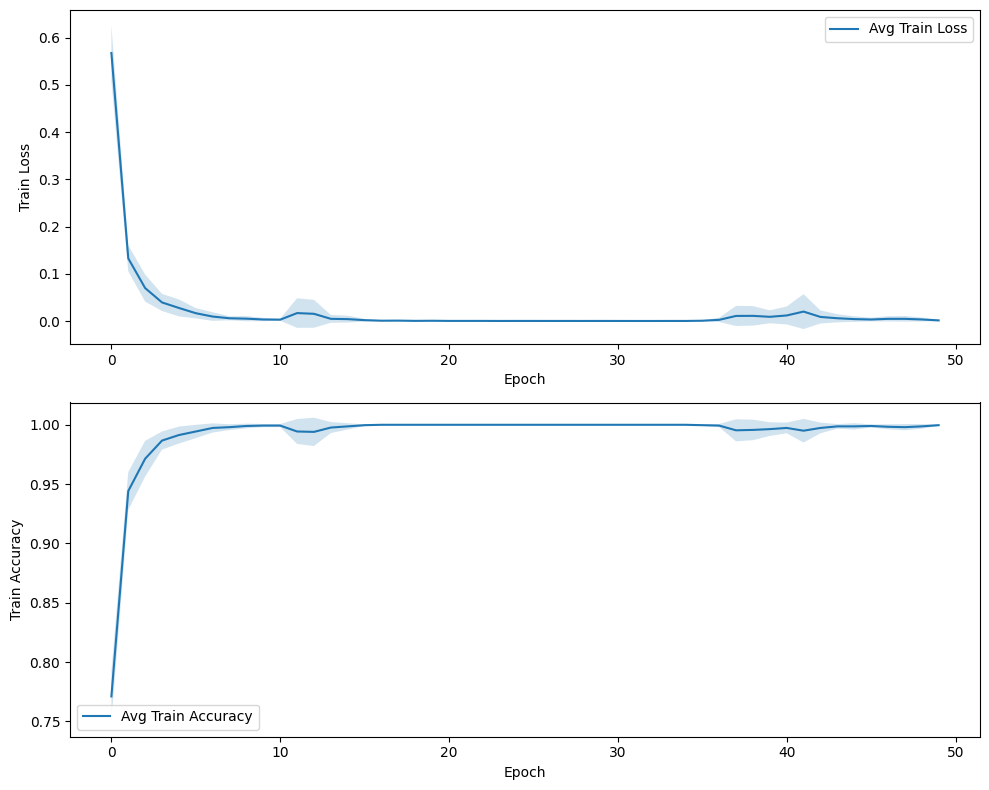

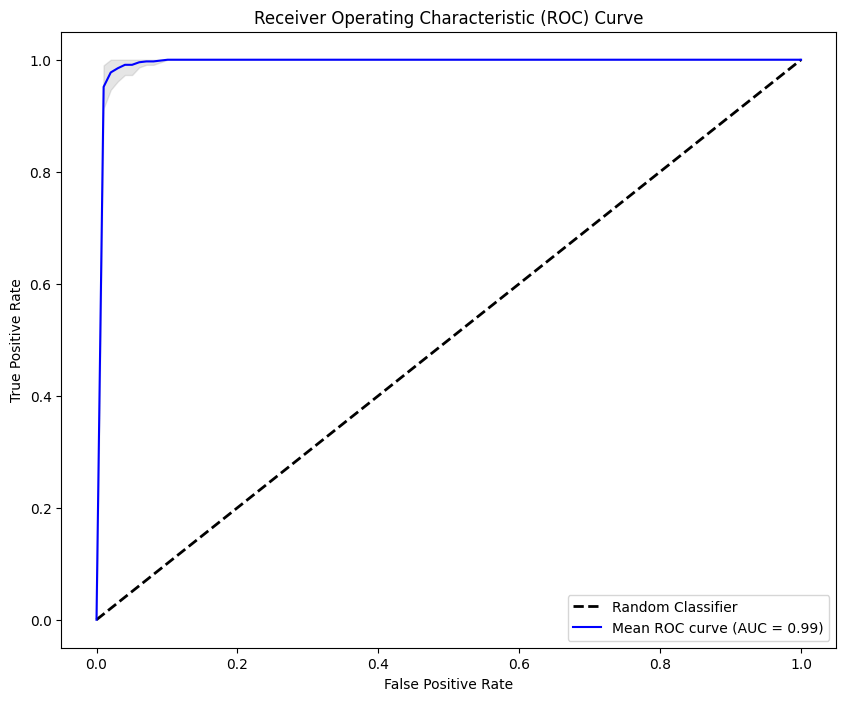

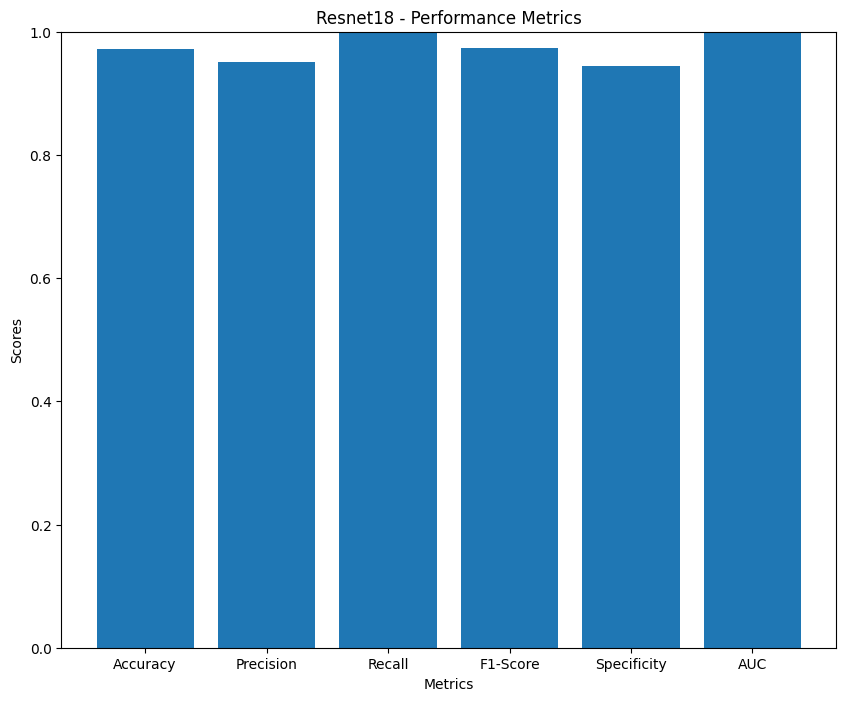

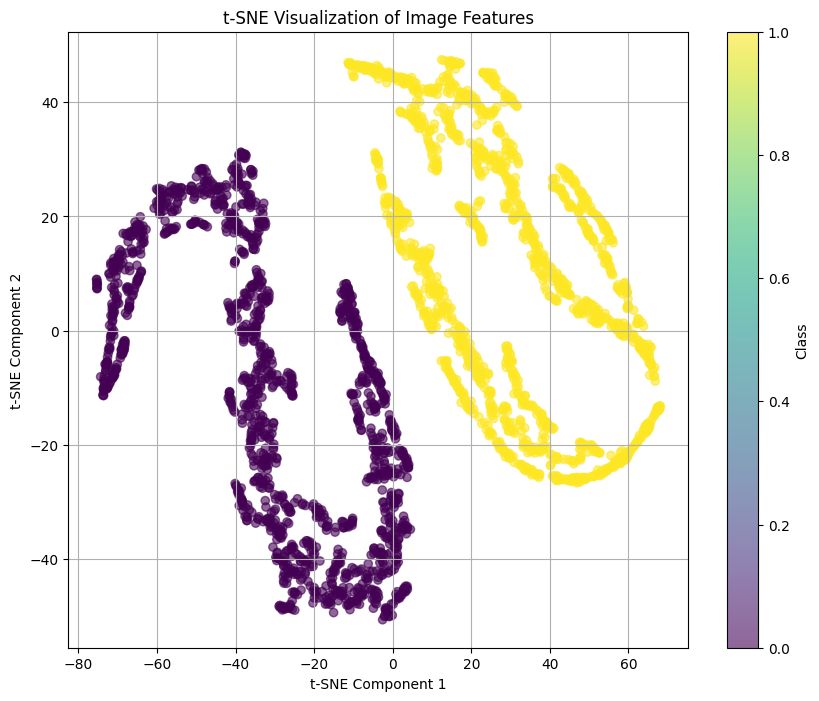

In [ ]:
num_epochs = 50
num_runs = 5


def initialize_model():
    model = models.resnet18(pretrained=True)
    for param in model.parameters():
        param.requires_grad = False
    for param in model.layer4.parameters():
        param.requires_grad = True
    for param in model.fc.parameters():
        param.requires_grad = True
    model.conv1 = nn.Conv2d(2, 64, kernel_size=7, stride=2, padding=3, bias=False)
    num_features = model.fc.in_features
    model.fc = nn.Linear(num_features, 2)
    return model


results = run_experiment(hparams, num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Resnet18 - Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


ResNet50

Run 1/5


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 177MB/s]


Epoch 1/50, Train Loss: 0.6560, Train Accuracy: 0.7243
Epoch 2/50, Train Loss: 0.1270, Train Accuracy: 0.9435
Epoch 3/50, Train Loss: 0.0311, Train Accuracy: 0.9967
Epoch 4/50, Train Loss: 0.0151, Train Accuracy: 0.9967
Epoch 5/50, Train Loss: 0.0072, Train Accuracy: 0.9983
Epoch 6/50, Train Loss: 0.0170, Train Accuracy: 0.9917
Epoch 7/50, Train Loss: 0.0185, Train Accuracy: 0.9900
Epoch 8/50, Train Loss: 0.0207, Train Accuracy: 0.9900
Epoch 9/50, Train Loss: 0.0079, Train Accuracy: 0.9983
Epoch 10/50, Train Loss: 0.0045, Train Accuracy: 1.0000
Epoch 11/50, Train Loss: 0.0014, Train Accuracy: 1.0000
Epoch 12/50, Train Loss: 0.0012, Train Accuracy: 1.0000
Epoch 13/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 14/50, Train Loss: 0.0003, Train Accuracy: 1.0000
Epoch 15/50, Train Loss: 0.0003, Train Accuracy: 1.0000
Epoch 16/50, Train Loss: 0.0003, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0001, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0001, Train Accuracy: 1.0000
E

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/50, Train Loss: 0.5692, Train Accuracy: 0.7326
Epoch 2/50, Train Loss: 0.1465, Train Accuracy: 0.9518
Epoch 3/50, Train Loss: 0.0689, Train Accuracy: 0.9751
Epoch 4/50, Train Loss: 0.0405, Train Accuracy: 0.9884
Epoch 5/50, Train Loss: 0.0126, Train Accuracy: 1.0000
Epoch 6/50, Train Loss: 0.0031, Train Accuracy: 1.0000
Epoch 7/50, Train Loss: 0.0015, Train Accuracy: 1.0000
Epoch 8/50, Train Loss: 0.0022, Train Accuracy: 1.0000
Epoch 9/50, Train Loss: 0.0524, Train Accuracy: 0.9817
Epoch 10/50, Train Loss: 0.0896, Train Accuracy: 0.9684
Epoch 11/50, Train Loss: 0.0618, Train Accuracy: 0.9784
Epoch 12/50, Train Loss: 0.0156, Train Accuracy: 0.9967
Epoch 13/50, Train Loss: 0.0052, Train Accuracy: 1.0000
Epoch 14/50, Train Loss: 0.0085, Train Accuracy: 0.9967
Epoch 15/50, Train Loss: 0.0016, Train Accuracy: 1.0000
Epoch 16/50, Train Loss: 0.0019, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0007, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0010, Train Accuracy: 1.0000
E

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/50, Train Loss: 0.6903, Train Accuracy: 0.7010
Epoch 2/50, Train Loss: 0.1711, Train Accuracy: 0.9336
Epoch 3/50, Train Loss: 0.1048, Train Accuracy: 0.9535
Epoch 4/50, Train Loss: 0.0405, Train Accuracy: 0.9834
Epoch 5/50, Train Loss: 0.0260, Train Accuracy: 0.9884
Epoch 6/50, Train Loss: 0.0280, Train Accuracy: 0.9884
Epoch 7/50, Train Loss: 0.0105, Train Accuracy: 0.9983
Epoch 8/50, Train Loss: 0.0093, Train Accuracy: 0.9967
Epoch 9/50, Train Loss: 0.0091, Train Accuracy: 0.9967
Epoch 10/50, Train Loss: 0.0054, Train Accuracy: 0.9983
Epoch 11/50, Train Loss: 0.0010, Train Accuracy: 1.0000
Epoch 12/50, Train Loss: 0.0012, Train Accuracy: 1.0000
Epoch 13/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 14/50, Train Loss: 0.0003, Train Accuracy: 1.0000
Epoch 15/50, Train Loss: 0.0009, Train Accuracy: 1.0000
Epoch 16/50, Train Loss: 0.0003, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0008, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0004, Train Accuracy: 1.0000
E

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/50, Train Loss: 0.3900, Train Accuracy: 0.8223
Epoch 2/50, Train Loss: 0.1178, Train Accuracy: 0.9452
Epoch 3/50, Train Loss: 0.0367, Train Accuracy: 0.9867
Epoch 4/50, Train Loss: 0.0176, Train Accuracy: 0.9950
Epoch 5/50, Train Loss: 0.0166, Train Accuracy: 0.9967
Epoch 6/50, Train Loss: 0.0100, Train Accuracy: 0.9983
Epoch 7/50, Train Loss: 0.0034, Train Accuracy: 1.0000
Epoch 8/50, Train Loss: 0.0009, Train Accuracy: 1.0000
Epoch 9/50, Train Loss: 0.0008, Train Accuracy: 1.0000
Epoch 10/50, Train Loss: 0.0011, Train Accuracy: 1.0000
Epoch 11/50, Train Loss: 0.0003, Train Accuracy: 1.0000
Epoch 12/50, Train Loss: 0.0003, Train Accuracy: 1.0000
Epoch 13/50, Train Loss: 0.0001, Train Accuracy: 1.0000
Epoch 14/50, Train Loss: 0.0002, Train Accuracy: 1.0000
Epoch 15/50, Train Loss: 0.0004, Train Accuracy: 1.0000
Epoch 16/50, Train Loss: 0.0001, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0001, Train Accuracy: 1.0000
E

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/50, Train Loss: 0.8379, Train Accuracy: 0.6711
Epoch 2/50, Train Loss: 0.2502, Train Accuracy: 0.8870
Epoch 3/50, Train Loss: 0.0828, Train Accuracy: 0.9784
Epoch 4/50, Train Loss: 0.0402, Train Accuracy: 0.9867
Epoch 5/50, Train Loss: 0.0319, Train Accuracy: 0.9934
Epoch 6/50, Train Loss: 0.0201, Train Accuracy: 0.9950
Epoch 7/50, Train Loss: 0.0097, Train Accuracy: 0.9983
Epoch 8/50, Train Loss: 0.0038, Train Accuracy: 0.9983
Epoch 9/50, Train Loss: 0.0062, Train Accuracy: 0.9967
Epoch 10/50, Train Loss: 0.0123, Train Accuracy: 0.9967
Epoch 11/50, Train Loss: 0.0099, Train Accuracy: 0.9983
Epoch 12/50, Train Loss: 0.0119, Train Accuracy: 0.9950
Epoch 13/50, Train Loss: 0.0227, Train Accuracy: 0.9900
Epoch 14/50, Train Loss: 0.0122, Train Accuracy: 0.9967
Epoch 15/50, Train Loss: 0.0097, Train Accuracy: 0.9950
Epoch 16/50, Train Loss: 0.0057, Train Accuracy: 0.9983
Epoch 17/50, Train Loss: 0.0105, Train Accuracy: 0.9967
Epoch 18/50, Train Loss: 0.0323, Train Accuracy: 0.9867
E

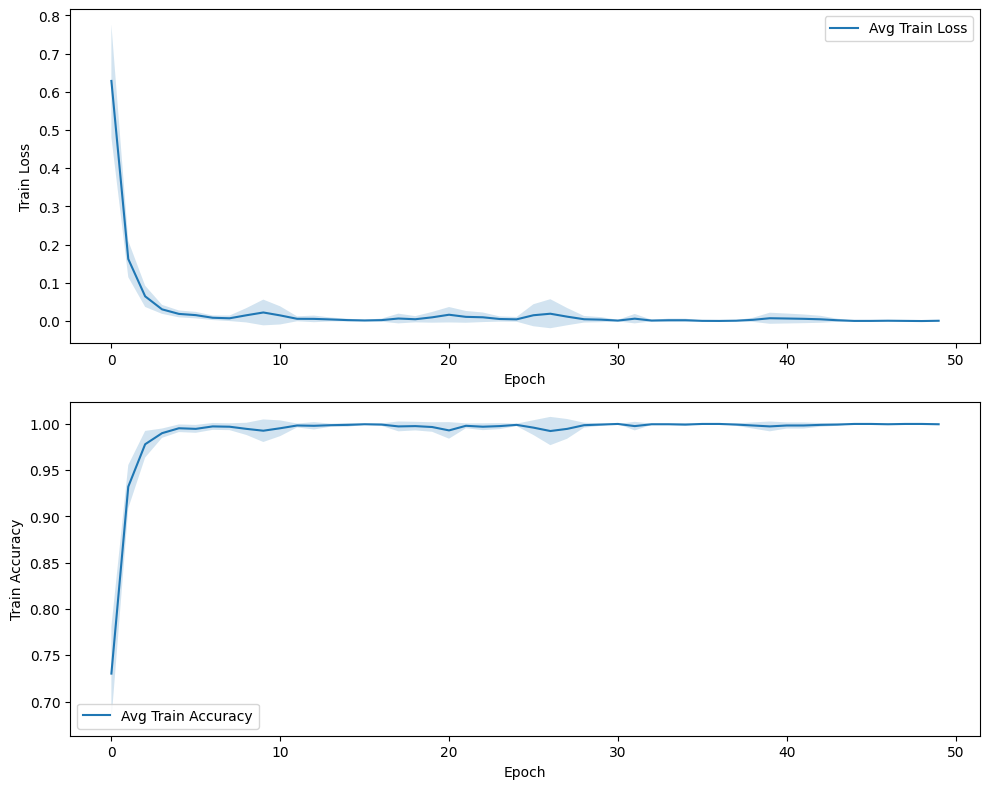

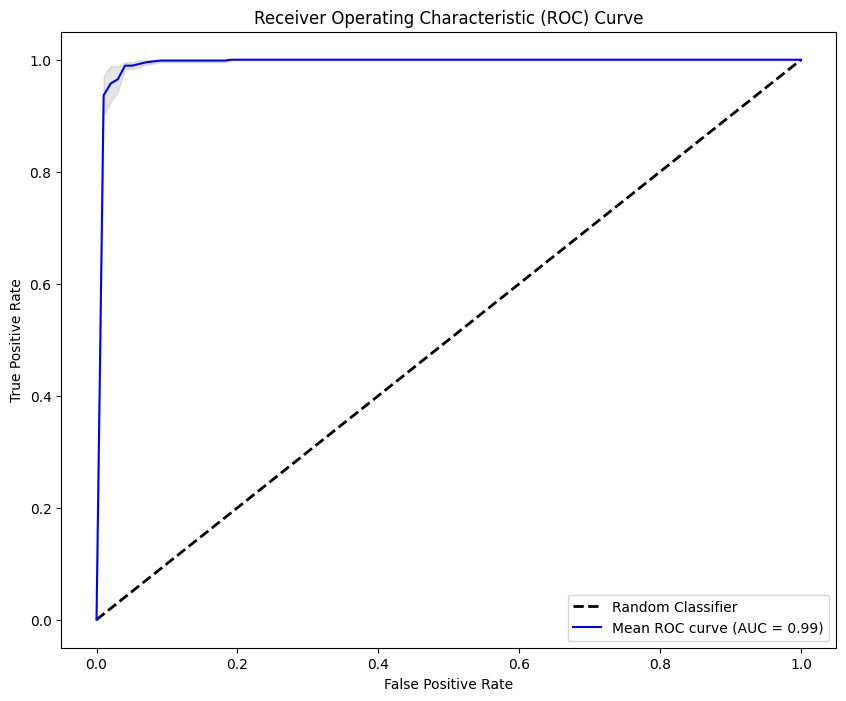

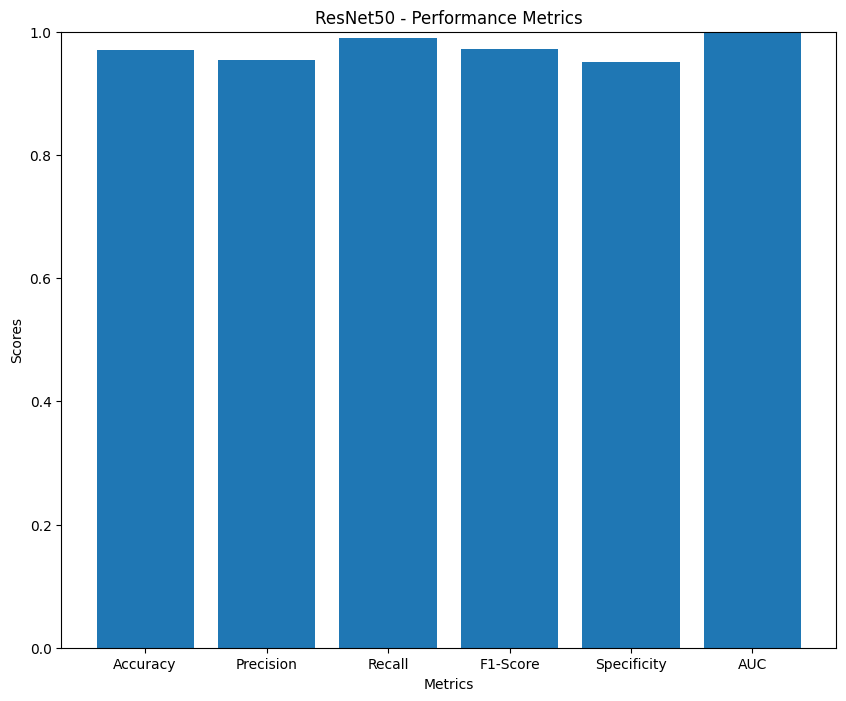

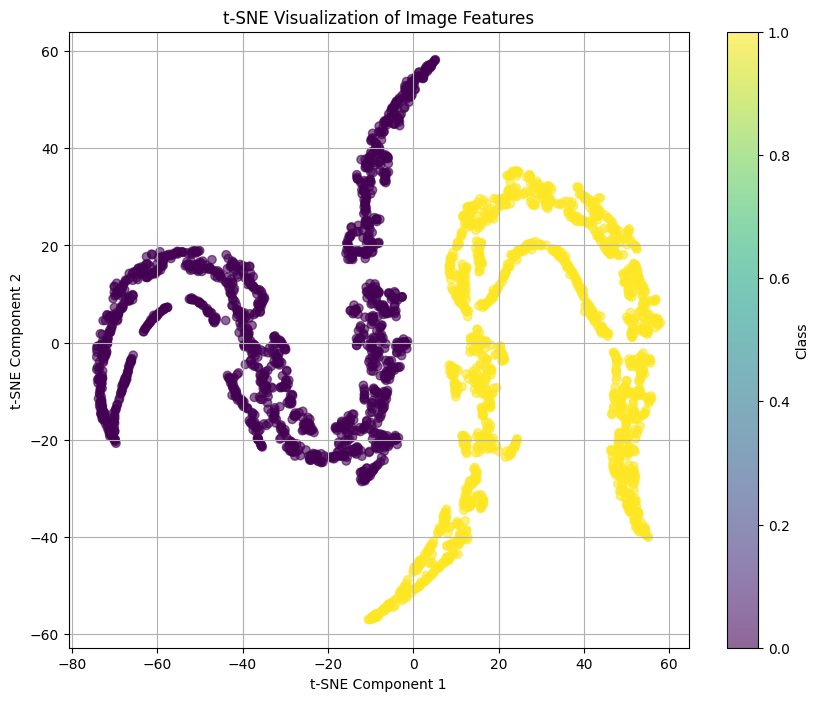

In [ ]:
num_epochs = 50
num_runs = 5


def initialize_model():
    model = models.resnet50(pretrained=True)
    for param in model.parameters():
        param.requires_grad = False
    for param in model.layer4.parameters():
        param.requires_grad = True
    for param in model.fc.parameters():
        param.requires_grad = True
    model.conv1 = nn.Conv2d(2, 64, kernel_size=7, stride=2, padding=3, bias=False)
    num_features = model.fc.in_features
    model.fc = nn.Linear(num_features, 2)
    return model


results = run_experiment(hparams, num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet50 - Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


Resnet101

Run 1/5


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:01<00:00, 176MB/s]


Epoch 1/50, Train Loss: 0.6175, Train Accuracy: 0.7326
Epoch 2/50, Train Loss: 0.1366, Train Accuracy: 0.9419
Epoch 3/50, Train Loss: 0.0732, Train Accuracy: 0.9684
Epoch 4/50, Train Loss: 0.0300, Train Accuracy: 0.9934
Epoch 5/50, Train Loss: 0.0132, Train Accuracy: 0.9967
Epoch 6/50, Train Loss: 0.0083, Train Accuracy: 0.9967
Epoch 7/50, Train Loss: 0.0054, Train Accuracy: 1.0000
Epoch 8/50, Train Loss: 0.0069, Train Accuracy: 0.9983
Epoch 9/50, Train Loss: 0.0015, Train Accuracy: 1.0000
Epoch 10/50, Train Loss: 0.0100, Train Accuracy: 0.9950
Epoch 11/50, Train Loss: 0.0085, Train Accuracy: 0.9983
Epoch 12/50, Train Loss: 0.0022, Train Accuracy: 1.0000
Epoch 13/50, Train Loss: 0.0034, Train Accuracy: 0.9983
Epoch 14/50, Train Loss: 0.0021, Train Accuracy: 1.0000
Epoch 15/50, Train Loss: 0.0029, Train Accuracy: 1.0000
Epoch 16/50, Train Loss: 0.0012, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0003, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0001, Train Accuracy: 1.0000
E

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/50, Train Loss: 0.6130, Train Accuracy: 0.7591
Epoch 2/50, Train Loss: 0.1929, Train Accuracy: 0.9169
Epoch 3/50, Train Loss: 0.0629, Train Accuracy: 0.9801
Epoch 4/50, Train Loss: 0.0517, Train Accuracy: 0.9850
Epoch 5/50, Train Loss: 0.0178, Train Accuracy: 0.9967
Epoch 6/50, Train Loss: 0.0186, Train Accuracy: 0.9934
Epoch 7/50, Train Loss: 0.0057, Train Accuracy: 0.9983
Epoch 8/50, Train Loss: 0.0037, Train Accuracy: 0.9983
Epoch 9/50, Train Loss: 0.0040, Train Accuracy: 0.9983
Epoch 10/50, Train Loss: 0.0097, Train Accuracy: 0.9950
Epoch 11/50, Train Loss: 0.0240, Train Accuracy: 0.9950
Epoch 12/50, Train Loss: 0.0582, Train Accuracy: 0.9900
Epoch 13/50, Train Loss: 0.0439, Train Accuracy: 0.9801
Epoch 14/50, Train Loss: 0.0240, Train Accuracy: 0.9900
Epoch 15/50, Train Loss: 0.0091, Train Accuracy: 0.9967
Epoch 16/50, Train Loss: 0.0041, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0005, Train Accuracy: 1.0000
E

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/50, Train Loss: 0.6087, Train Accuracy: 0.7392
Epoch 2/50, Train Loss: 0.1471, Train Accuracy: 0.9385
Epoch 3/50, Train Loss: 0.0487, Train Accuracy: 0.9850
Epoch 4/50, Train Loss: 0.0307, Train Accuracy: 0.9867
Epoch 5/50, Train Loss: 0.0221, Train Accuracy: 0.9917
Epoch 6/50, Train Loss: 0.0271, Train Accuracy: 0.9884
Epoch 7/50, Train Loss: 0.0112, Train Accuracy: 0.9983
Epoch 8/50, Train Loss: 0.0075, Train Accuracy: 1.0000
Epoch 9/50, Train Loss: 0.0028, Train Accuracy: 1.0000
Epoch 10/50, Train Loss: 0.0018, Train Accuracy: 1.0000
Epoch 11/50, Train Loss: 0.0003, Train Accuracy: 1.0000
Epoch 12/50, Train Loss: 0.0043, Train Accuracy: 0.9967
Epoch 13/50, Train Loss: 0.0227, Train Accuracy: 0.9917
Epoch 14/50, Train Loss: 0.0152, Train Accuracy: 0.9967
Epoch 15/50, Train Loss: 0.0628, Train Accuracy: 0.9801
Epoch 16/50, Train Loss: 0.0735, Train Accuracy: 0.9684
Epoch 17/50, Train Loss: 0.0275, Train Accuracy: 0.9884
Epoch 18/50, Train Loss: 0.0095, Train Accuracy: 0.9967
E

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/50, Train Loss: 0.6383, Train Accuracy: 0.7243
Epoch 2/50, Train Loss: 0.1668, Train Accuracy: 0.9302
Epoch 3/50, Train Loss: 0.0564, Train Accuracy: 0.9850
Epoch 4/50, Train Loss: 0.0350, Train Accuracy: 0.9884
Epoch 5/50, Train Loss: 0.0237, Train Accuracy: 0.9917
Epoch 6/50, Train Loss: 0.0131, Train Accuracy: 0.9950
Epoch 7/50, Train Loss: 0.0124, Train Accuracy: 0.9950
Epoch 8/50, Train Loss: 0.0036, Train Accuracy: 1.0000
Epoch 9/50, Train Loss: 0.0034, Train Accuracy: 0.9983
Epoch 10/50, Train Loss: 0.0013, Train Accuracy: 1.0000
Epoch 11/50, Train Loss: 0.0008, Train Accuracy: 1.0000
Epoch 12/50, Train Loss: 0.0010, Train Accuracy: 1.0000
Epoch 13/50, Train Loss: 0.0014, Train Accuracy: 1.0000
Epoch 14/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 15/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 16/50, Train Loss: 0.0007, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0037, Train Accuracy: 0.9983
Epoch 18/50, Train Loss: 0.0538, Train Accuracy: 0.9767
E

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/50, Train Loss: 0.4810, Train Accuracy: 0.7924
Epoch 2/50, Train Loss: 0.2399, Train Accuracy: 0.9053
Epoch 3/50, Train Loss: 0.0758, Train Accuracy: 0.9718
Epoch 4/50, Train Loss: 0.0217, Train Accuracy: 0.9950
Epoch 5/50, Train Loss: 0.0080, Train Accuracy: 0.9983
Epoch 6/50, Train Loss: 0.0030, Train Accuracy: 1.0000
Epoch 7/50, Train Loss: 0.0050, Train Accuracy: 0.9967
Epoch 8/50, Train Loss: 0.0040, Train Accuracy: 0.9983
Epoch 9/50, Train Loss: 0.0011, Train Accuracy: 1.0000
Epoch 10/50, Train Loss: 0.0046, Train Accuracy: 1.0000
Epoch 11/50, Train Loss: 0.0252, Train Accuracy: 0.9917
Epoch 12/50, Train Loss: 0.0678, Train Accuracy: 0.9784
Epoch 13/50, Train Loss: 0.0432, Train Accuracy: 0.9801
Epoch 14/50, Train Loss: 0.0517, Train Accuracy: 0.9801
Epoch 15/50, Train Loss: 0.0423, Train Accuracy: 0.9834
Epoch 16/50, Train Loss: 0.0331, Train Accuracy: 0.9917
Epoch 17/50, Train Loss: 0.0493, Train Accuracy: 0.9817
Epoch 18/50, Train Loss: 0.0270, Train Accuracy: 0.9850
E

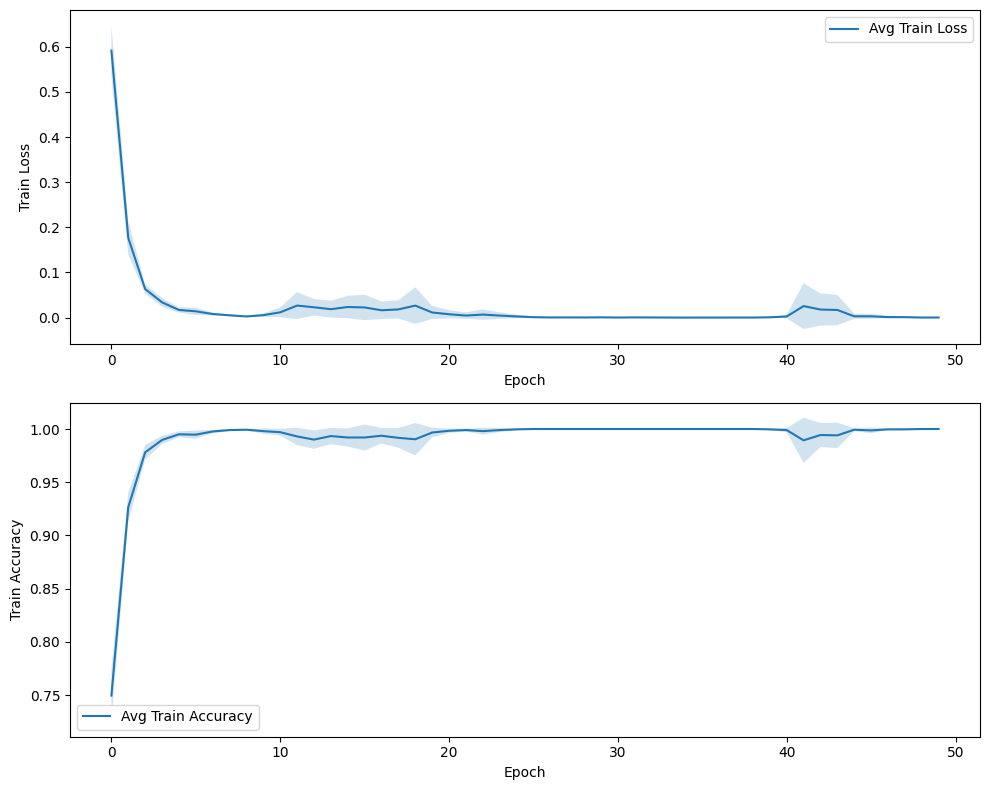

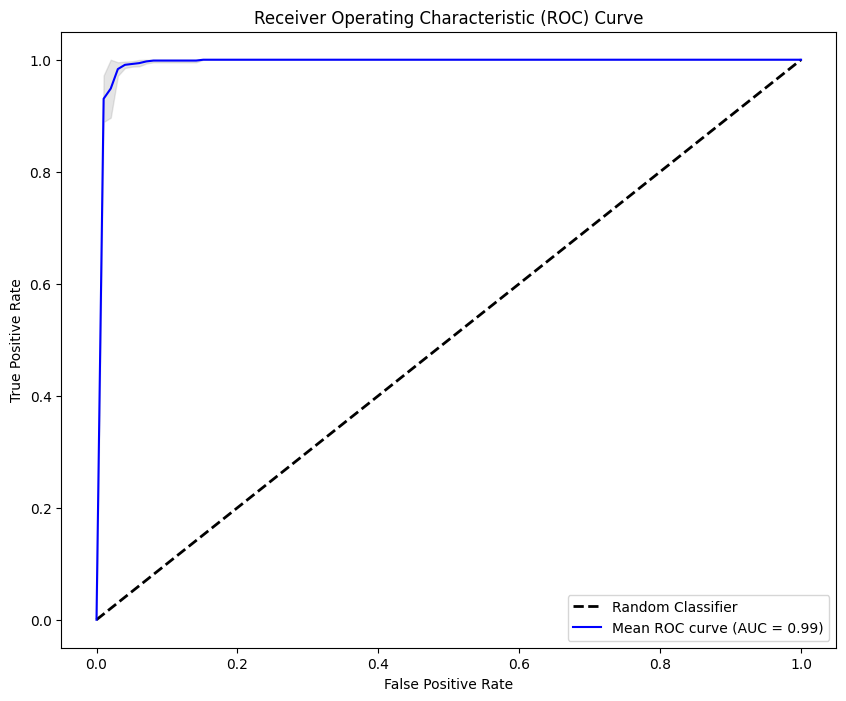

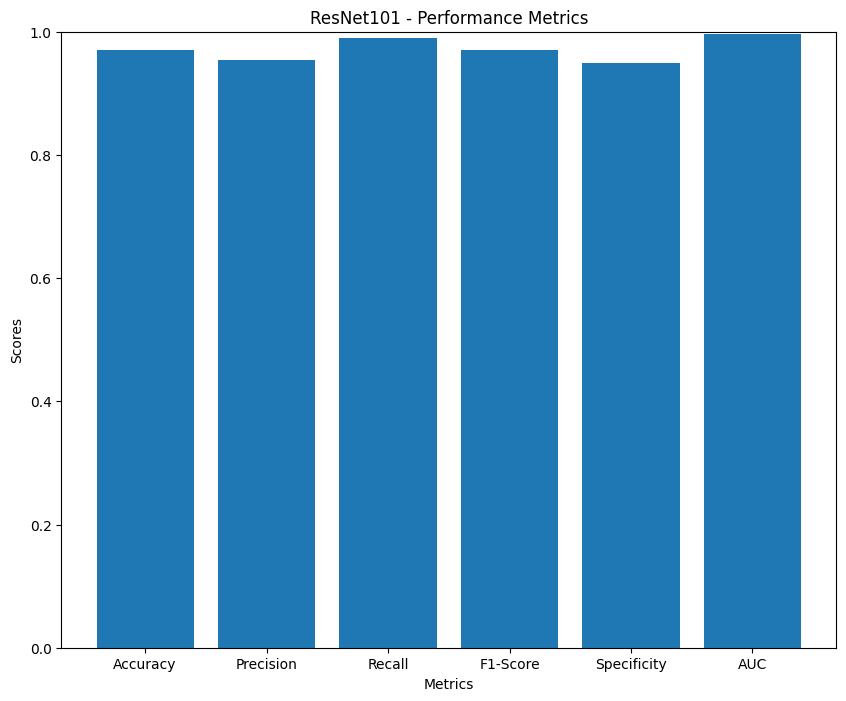

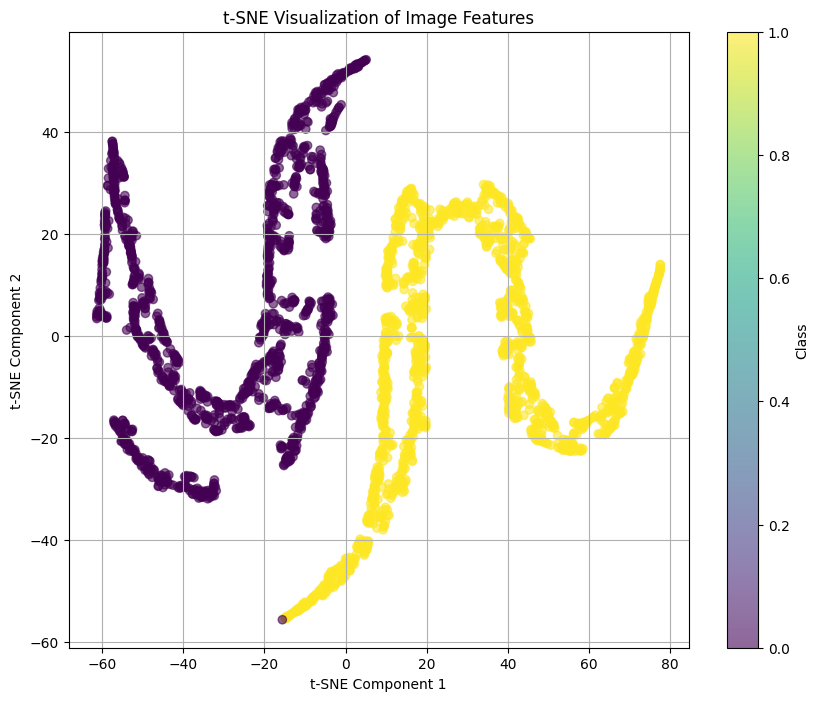

In [ ]:
num_epochs = 50
num_runs = 5


def initialize_model():
    model = models.resnet101(pretrained=True)
    for param in model.parameters():
        param.requires_grad = False
    for param in model.layer4.parameters():
        param.requires_grad = True
    for param in model.fc.parameters():
        param.requires_grad = True
    model.conv1 = nn.Conv2d(2, 64, kernel_size=7, stride=2, padding=3, bias=False)
    num_features = model.fc.in_features
    model.fc = nn.Linear(num_features, 2)
    return model


results = run_experiment(hparams, num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet101 - Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


# VGG

VGG16

Run 1/5


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:08<00:00, 64.6MB/s]


Epoch 1/50, Train Loss: 1.0065, Train Accuracy: 0.5631
Epoch 2/50, Train Loss: 0.4502, Train Accuracy: 0.8090
Epoch 3/50, Train Loss: 0.3290, Train Accuracy: 0.8571
Epoch 4/50, Train Loss: 0.2653, Train Accuracy: 0.8870
Epoch 5/50, Train Loss: 0.2619, Train Accuracy: 0.8970
Epoch 6/50, Train Loss: 0.1988, Train Accuracy: 0.9203
Epoch 7/50, Train Loss: 0.2264, Train Accuracy: 0.8970
Epoch 8/50, Train Loss: 0.2303, Train Accuracy: 0.9086
Epoch 9/50, Train Loss: 0.1765, Train Accuracy: 0.9269
Epoch 10/50, Train Loss: 0.1773, Train Accuracy: 0.9252
Epoch 11/50, Train Loss: 0.1615, Train Accuracy: 0.9385
Epoch 12/50, Train Loss: 0.2679, Train Accuracy: 0.9103
Epoch 13/50, Train Loss: 0.1438, Train Accuracy: 0.9385
Epoch 14/50, Train Loss: 0.1438, Train Accuracy: 0.9419
Epoch 15/50, Train Loss: 0.1423, Train Accuracy: 0.9336
Epoch 16/50, Train Loss: 0.1273, Train Accuracy: 0.9551
Epoch 17/50, Train Loss: 0.1231, Train Accuracy: 0.9518
Epoch 18/50, Train Loss: 0.1677, Train Accuracy: 0.9485
E

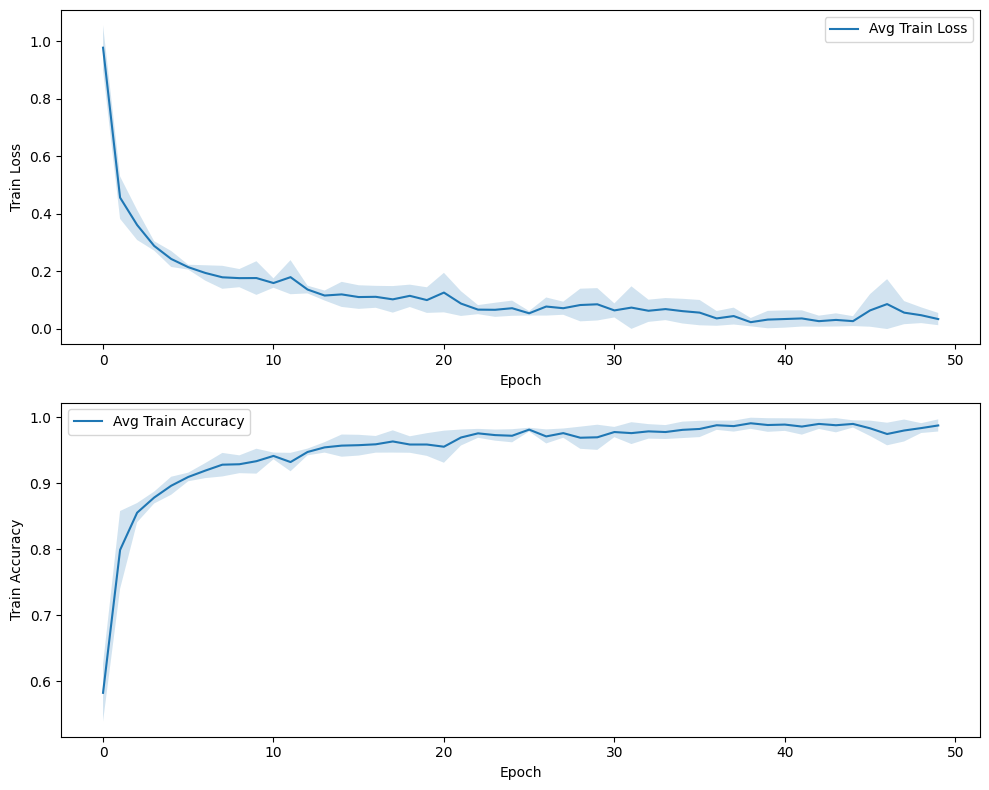

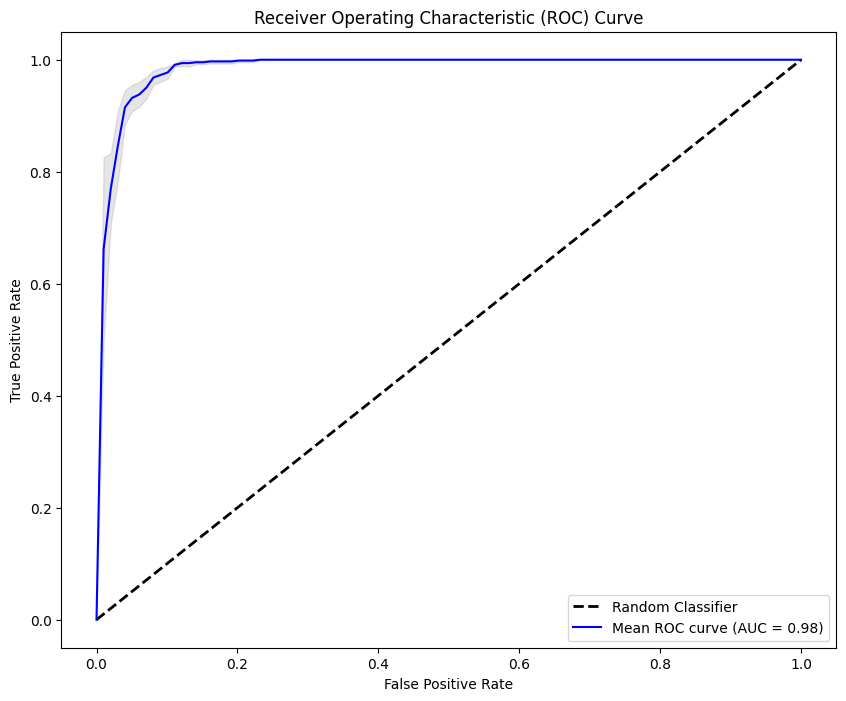

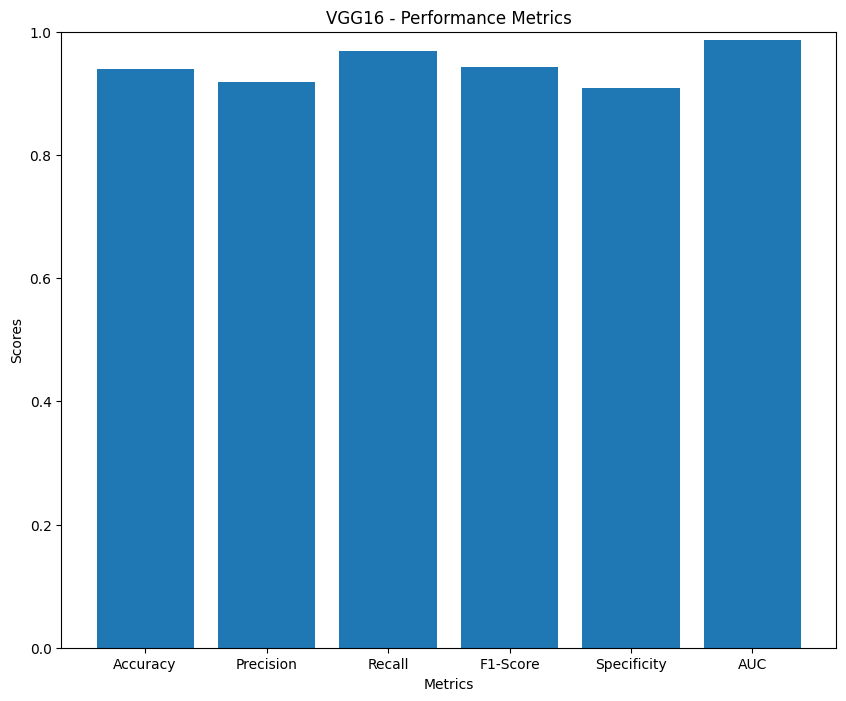

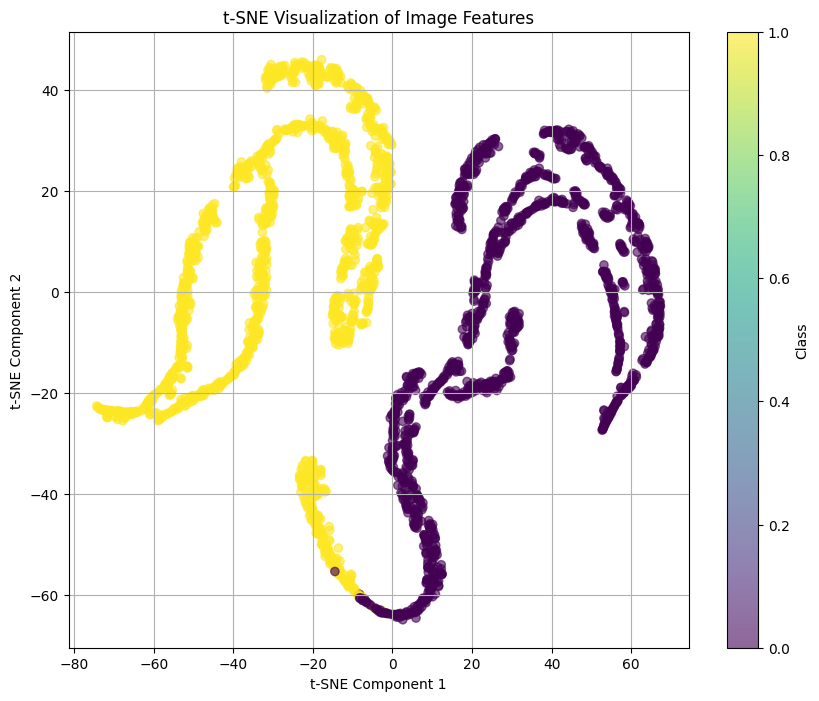

In [ ]:
num_epochs = 50
num_runs = 5


def initialize_model():
    model = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

    for param in model.features.parameters():
        param.requires_grad = False

    for param in model.classifier.parameters():
        param.requires_grad = True

    model.features[0] = nn.Conv2d(2, 64, kernel_size=3, stride=1, padding=1)
    num_features = model.classifier[6].in_features
    model.classifier[6] = nn.Linear(num_features, 2)

    return model


results = run_experiment(hparams, num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('VGG16 - Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


VGG19

Run 1/5


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:08<00:00, 70.4MB/s]


Epoch 1/50, Train Loss: 1.3248, Train Accuracy: 0.6130
Epoch 2/50, Train Loss: 0.3353, Train Accuracy: 0.8422
Epoch 3/50, Train Loss: 0.2687, Train Accuracy: 0.8854
Epoch 4/50, Train Loss: 0.2842, Train Accuracy: 0.8987
Epoch 5/50, Train Loss: 0.2522, Train Accuracy: 0.8937
Epoch 6/50, Train Loss: 0.2070, Train Accuracy: 0.9203
Epoch 7/50, Train Loss: 0.1840, Train Accuracy: 0.9169
Epoch 8/50, Train Loss: 0.1812, Train Accuracy: 0.9269
Epoch 9/50, Train Loss: 0.1879, Train Accuracy: 0.9269
Epoch 10/50, Train Loss: 0.1570, Train Accuracy: 0.9302
Epoch 11/50, Train Loss: 0.1871, Train Accuracy: 0.9336
Epoch 12/50, Train Loss: 0.1238, Train Accuracy: 0.9518
Epoch 13/50, Train Loss: 0.1803, Train Accuracy: 0.9369
Epoch 14/50, Train Loss: 0.1552, Train Accuracy: 0.9419
Epoch 15/50, Train Loss: 0.2422, Train Accuracy: 0.9252
Epoch 16/50, Train Loss: 0.1374, Train Accuracy: 0.9419
Epoch 17/50, Train Loss: 0.1015, Train Accuracy: 0.9651
Epoch 18/50, Train Loss: 0.1474, Train Accuracy: 0.9518
E

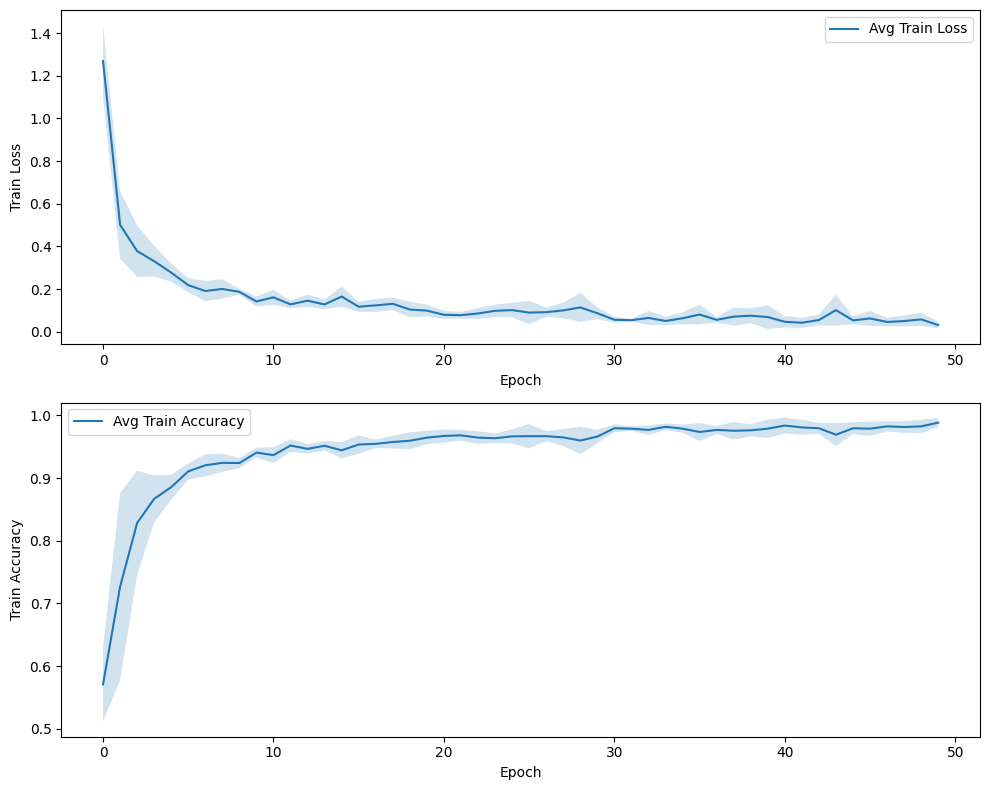

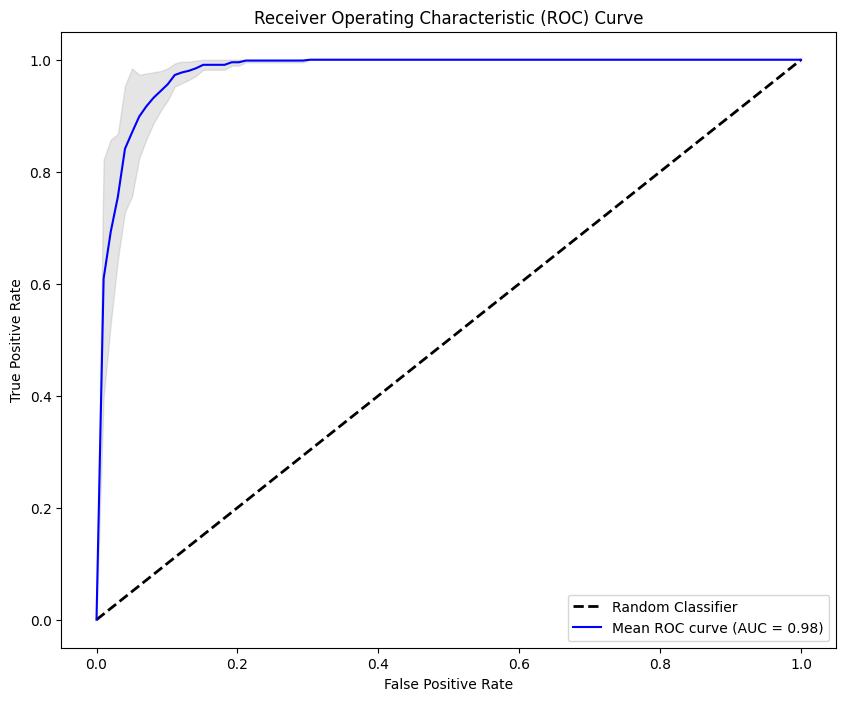

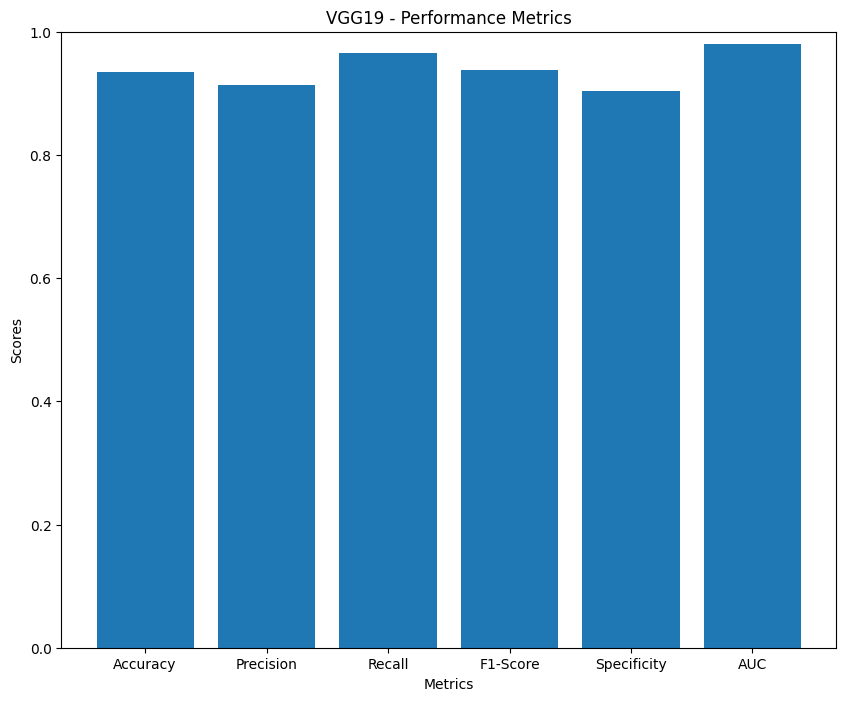

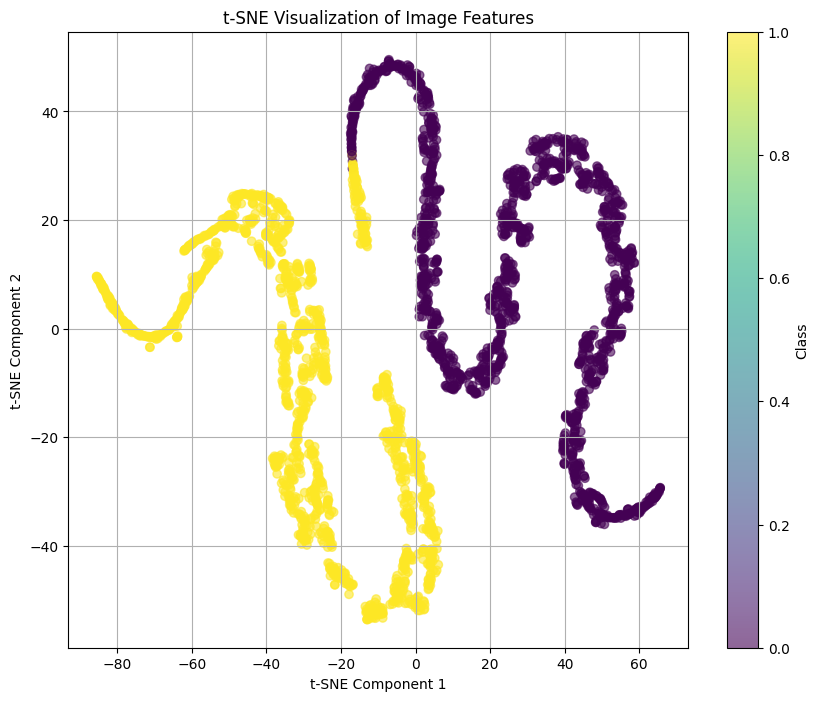

In [ ]:
num_epochs = 50
num_runs = 5


def initialize_model():
    model = models.vgg19(weights=models.VGG19_Weights.IMAGENET1K_V1)

    for param in model.features.parameters():
        param.requires_grad = False

    for param in model.classifier.parameters():
        param.requires_grad = True

    model.features[0] = nn.Conv2d(2, 64, kernel_size=3, stride=1, padding=1)
    num_features = model.classifier[6].in_features
    model.classifier[6] = nn.Linear(num_features, 2)

    return model


results = run_experiment(hparams, num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('VGG19 - Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


# DenseNet

Densenet-121

Run 1/5


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 97.6MB/s]


Epoch 1/50, Train Loss: 0.3416, Train Accuracy: 0.8223
Epoch 2/50, Train Loss: 0.1258, Train Accuracy: 0.9468
Epoch 3/50, Train Loss: 0.0593, Train Accuracy: 0.9751
Epoch 4/50, Train Loss: 0.0291, Train Accuracy: 0.9917
Epoch 5/50, Train Loss: 0.0200, Train Accuracy: 0.9934
Epoch 6/50, Train Loss: 0.0056, Train Accuracy: 1.0000
Epoch 7/50, Train Loss: 0.0040, Train Accuracy: 1.0000
Epoch 8/50, Train Loss: 0.0041, Train Accuracy: 1.0000
Epoch 9/50, Train Loss: 0.0039, Train Accuracy: 1.0000
Epoch 10/50, Train Loss: 0.0026, Train Accuracy: 1.0000
Epoch 11/50, Train Loss: 0.0007, Train Accuracy: 1.0000
Epoch 12/50, Train Loss: 0.0007, Train Accuracy: 1.0000
Epoch 13/50, Train Loss: 0.0006, Train Accuracy: 1.0000
Epoch 14/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 15/50, Train Loss: 0.0002, Train Accuracy: 1.0000
Epoch 16/50, Train Loss: 0.0003, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0005, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0004, Train Accuracy: 1.0000
E

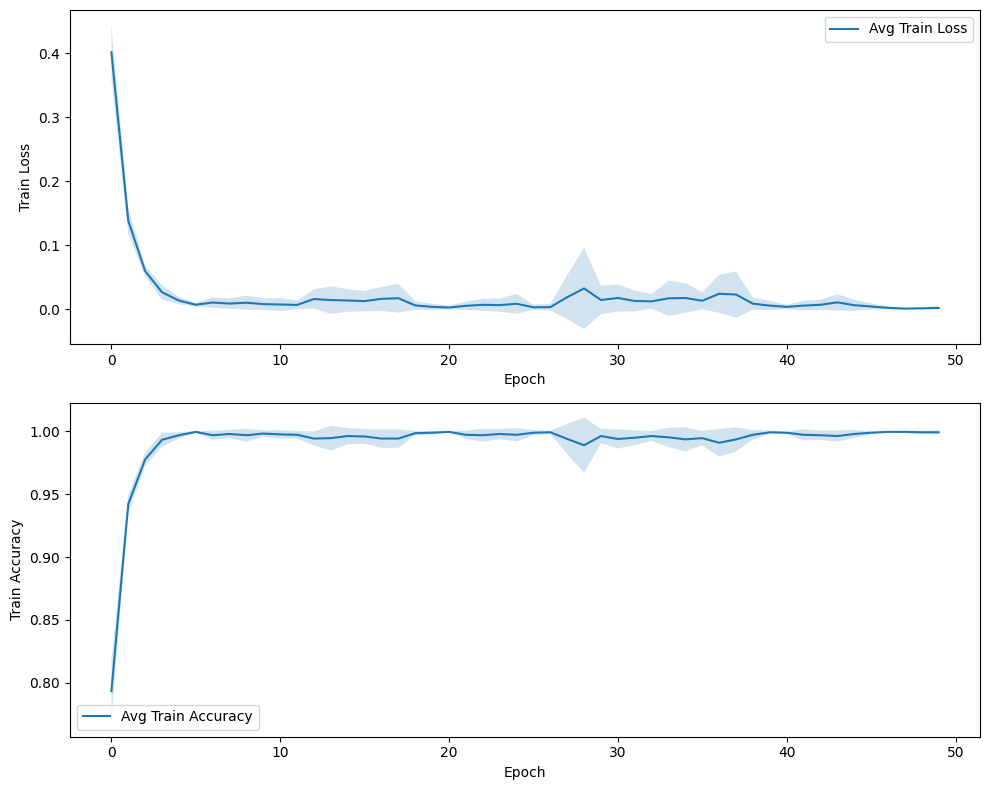

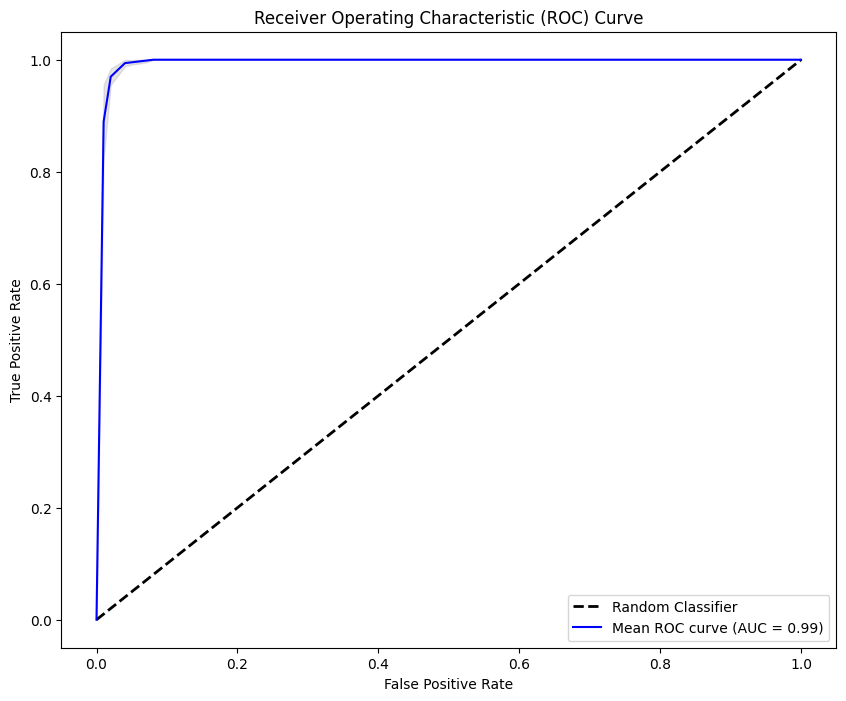

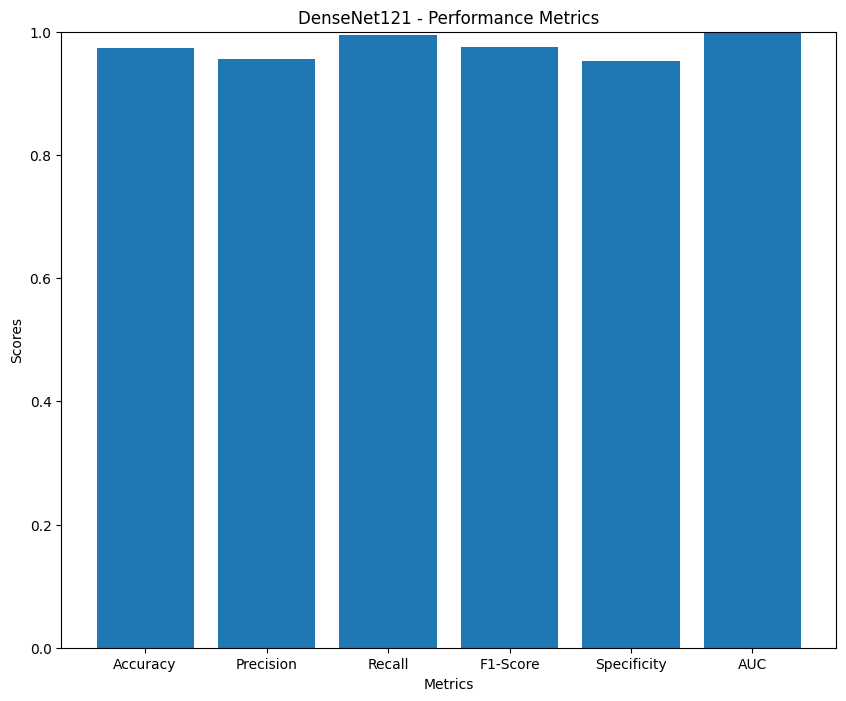

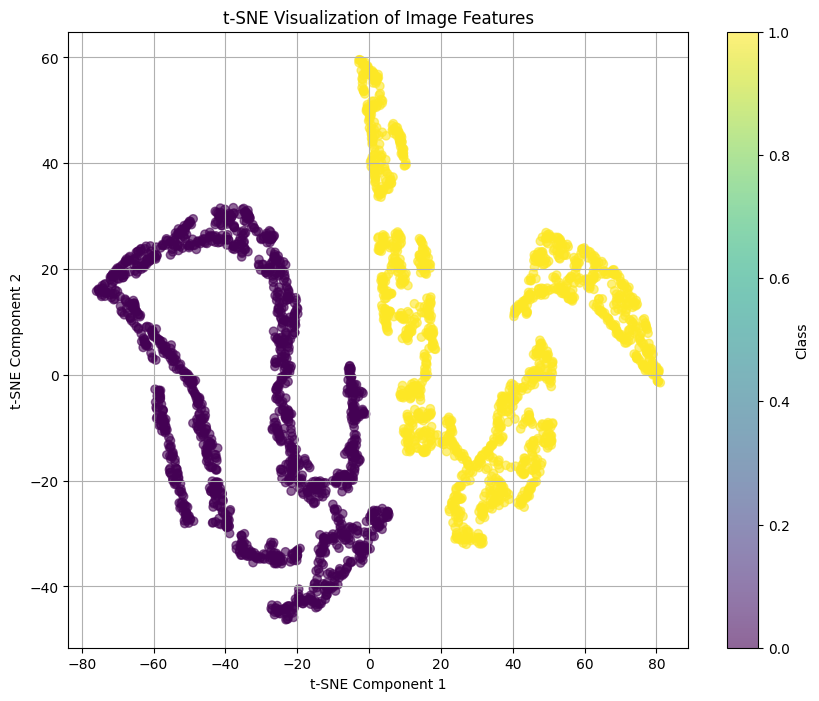

In [ ]:
num_epochs = 50
num_runs = 5


def initialize_model():
    model = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)

    # Freeze all layers
    for param in model.parameters():
        param.requires_grad = False

    # Unfreeze Dense Block 4, Transition Layer 3 and the fully connected layer (classifier)
    for param in model.features.denseblock4.parameters():
        param.requires_grad = True

    for param in model.features.transition3.parameters():
        param.requires_grad = True

    for param in model.classifier.parameters():
        param.requires_grad = True

    model.features.conv0 = nn.Conv2d(2, 64, kernel_size=7, stride=2, padding=3, bias=False)

    num_features = model.classifier.in_features
    model.classifier = nn.Linear(num_features, 2)

    return model


results = run_experiment(hparams, num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('DenseNet121 - Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


DenseNet-201

Run 1/5


Downloading: "https://download.pytorch.org/models/densenet201-c1103571.pth" to /root/.cache/torch/hub/checkpoints/densenet201-c1103571.pth
100%|██████████| 77.4M/77.4M [00:00<00:00, 84.1MB/s]


Epoch 1/50, Train Loss: 0.3951, Train Accuracy: 0.8173
Epoch 2/50, Train Loss: 0.1568, Train Accuracy: 0.9369
Epoch 3/50, Train Loss: 0.1065, Train Accuracy: 0.9601
Epoch 4/50, Train Loss: 0.0798, Train Accuracy: 0.9618
Epoch 5/50, Train Loss: 0.0686, Train Accuracy: 0.9701
Epoch 6/50, Train Loss: 0.0875, Train Accuracy: 0.9668
Epoch 7/50, Train Loss: 0.0225, Train Accuracy: 0.9950
Epoch 8/50, Train Loss: 0.1027, Train Accuracy: 0.9635
Epoch 9/50, Train Loss: 0.0565, Train Accuracy: 0.9718
Epoch 10/50, Train Loss: 0.0596, Train Accuracy: 0.9784
Epoch 11/50, Train Loss: 0.0176, Train Accuracy: 0.9917
Epoch 12/50, Train Loss: 0.0291, Train Accuracy: 0.9884
Epoch 13/50, Train Loss: 0.0322, Train Accuracy: 0.9850
Epoch 14/50, Train Loss: 0.0128, Train Accuracy: 0.9967
Epoch 15/50, Train Loss: 0.0048, Train Accuracy: 1.0000
Epoch 16/50, Train Loss: 0.0028, Train Accuracy: 1.0000
Epoch 17/50, Train Loss: 0.0017, Train Accuracy: 1.0000
Epoch 18/50, Train Loss: 0.0060, Train Accuracy: 0.9983
E

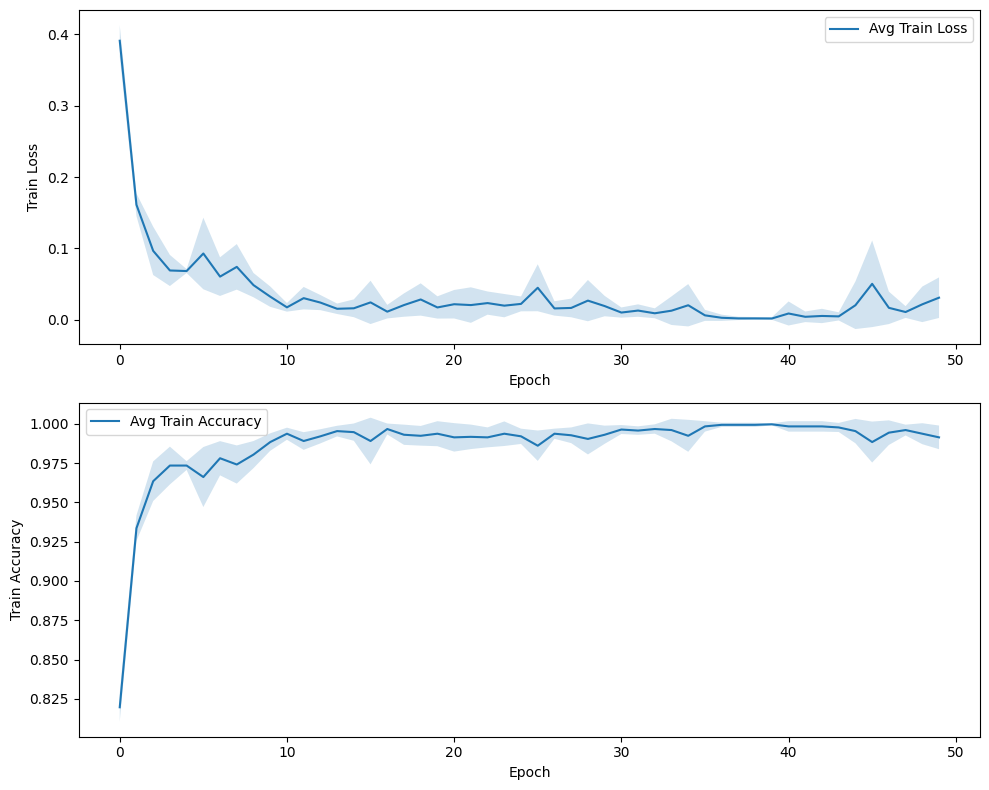

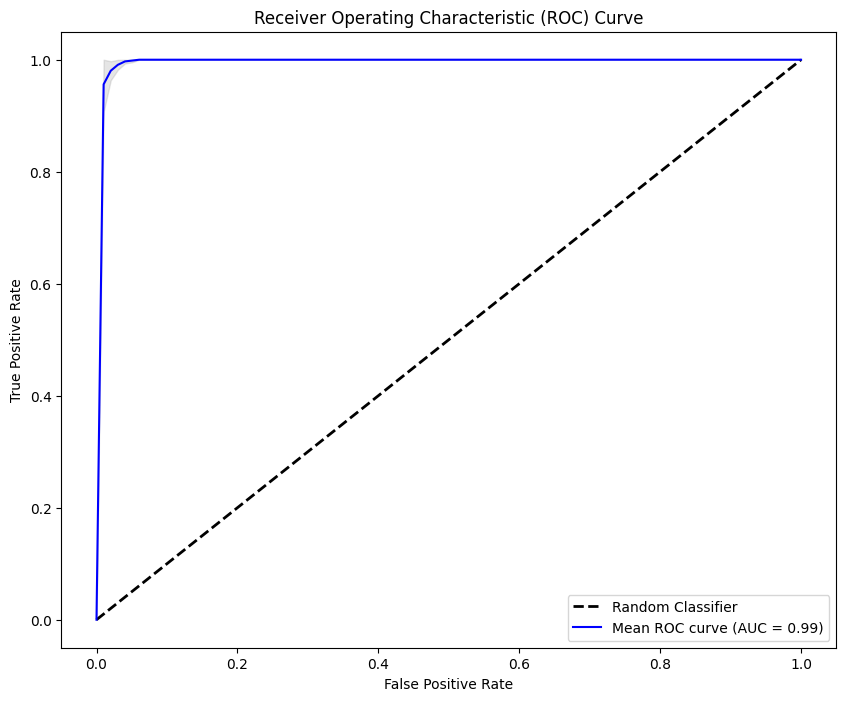

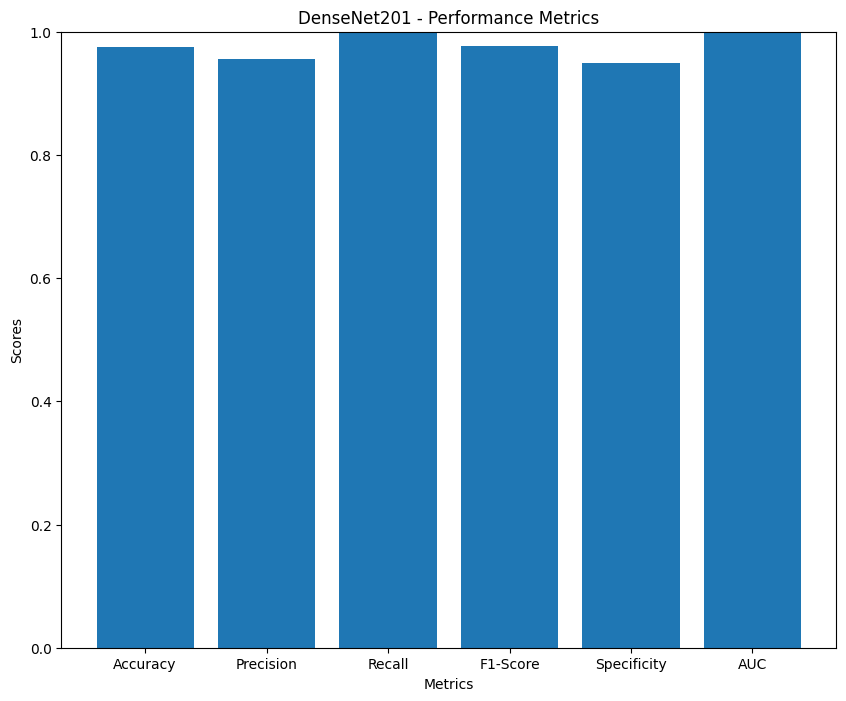

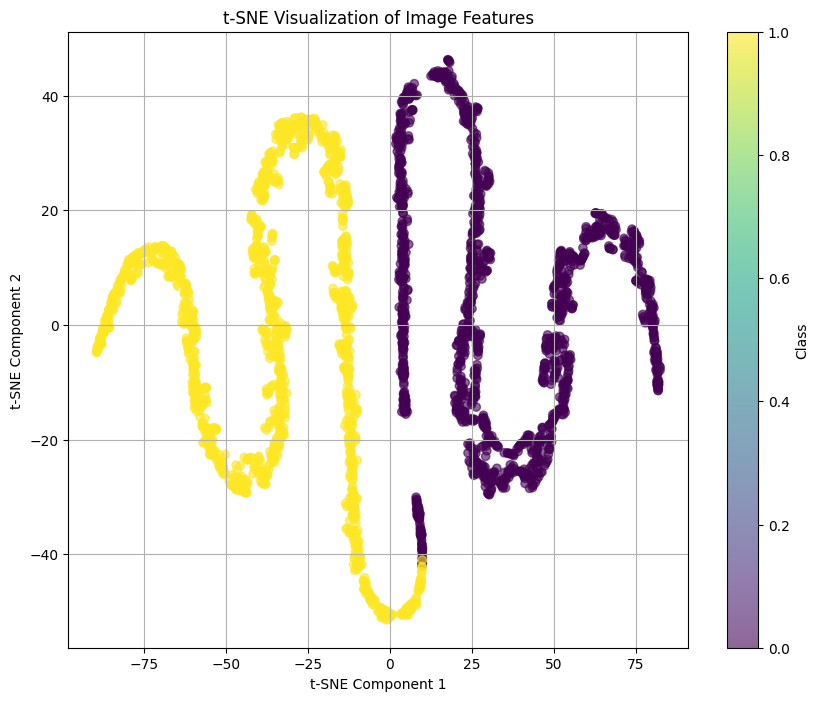

In [ ]:
hparams = {
    "learning_rate": 0.001,
    "batch_size": 16,  # Reduce batch size
    "test_batch_size": 16,
    "num_epochs": 50,
    "device": 'cuda' if torch.cuda.is_available() else 'cpu'
}

num_epochs = 50
num_runs = 5


def initialize_model():
    model = models.densenet201(weights=models.DenseNet201_Weights.IMAGENET1K_V1)

    # Freeze all layers
    for param in model.parameters():
        param.requires_grad = False

    # Unfreeze Dense Block 4, Transition Layer 3 and the fully connected layer (classifier)
    for param in model.features.denseblock4.parameters():
        param.requires_grad = True

    for param in model.features.transition3.parameters():
        param.requires_grad = True

    for param in model.classifier.parameters():
        param.requires_grad = True

    model.features.conv0 = nn.Conv2d(2, 64, kernel_size=7, stride=2, padding=3, bias=False)

    num_features = model.classifier.in_features
    model.classifier = nn.Linear(num_features, 2)

    return model


results = run_experiment(hparams, num_runs)


(avg_tr_losses, std_tr_losses, avg_tr_accuracies, std_tr_accuracies, avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc, mean_fpr, tprs, avg_conf_matrix, features_tsne, all_labels) = results


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_te_accs:.4f}")
print(f"Precision: {avg_precisions:.4f}")
print(f"Recall: {avg_recalls:.4f}")
print(f"F1-Score: {avg_f1s:.4f}")
print(f"Specificity: {avg_specificities:.4f}")
print(f"ROC AUC: {avg_roc_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.plot(avg_tr_losses, label='Avg Train Loss')
plt.fill_between(range(len(avg_tr_losses)), np.array(avg_tr_losses) - np.array(std_tr_losses), np.array(avg_tr_losses) + np.array(std_tr_losses), alpha=0.2)
plt.legend()

plt.subplot(2, 1, 2)
plt.xlabel('Epoch')
plt.ylabel('Train Accuracy')
plt.plot(avg_tr_accuracies, label='Avg Train Accuracy')
plt.fill_between(range(len(avg_tr_accuracies)), np.array(avg_tr_accuracies) - np.array(std_tr_accuracies), np.array(avg_tr_accuracies) + np.array(std_tr_accuracies), alpha=0.2)
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC curve (AUC = {mean_auc:.2f})')

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity', 'AUC']
averages = [avg_te_accs, avg_precisions, avg_recalls, avg_f1s, avg_specificities, avg_roc_auc]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('DenseNet201 - Performance Metrics')
plt.ylim(0, 1)
plt.show()


plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=all_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


# TRANSFER LEARNING: feature extraction

# TL functions

In [36]:
hparams = {
    'batch_size': 32,
    'test_batch_size': 32,
    'num_classes': 2,
}

In [37]:
class CustomResNet18(nn.Module):
    def __init__(self):
        super(CustomResNet18, self).__init__()
        self.resnet18 = models.resnet50(pretrained=True)

        for param in self.resnet18.parameters():
            param.requires_grad = False

        self.resnet18.conv1 = nn.Conv2d(2, 64, kernel_size=7, stride=2, padding=3, bias=False)

        self.resnet18.fc = nn.Identity()

    def forward(self, x):
        x = self.resnet18(x)
        return x

In [38]:
class CustomResNet50(nn.Module):
    def __init__(self):
        super(CustomResNet50, self).__init__()
        self.resnet50 = models.resnet50(pretrained=True)

        for param in self.resnet50.parameters():
            param.requires_grad = False

        self.resnet50.conv1 = nn.Conv2d(2, 64, kernel_size=7, stride=2, padding=3, bias=False)

        self.resnet50.fc = nn.Identity()

    def forward(self, x):
        x = self.resnet50(x)
        return x

In [39]:
class CustomResNet101(nn.Module):
    def __init__(self):
        super(CustomResNet101, self).__init__()
        self.resnet101 = models.resnet101(pretrained=True)

        for param in self.resnet101.parameters():
            param.requires_grad = False

        self.resnet101.conv1 = nn.Conv2d(2, 64, kernel_size=7, stride=2, padding=3, bias=False)

        self.resnet101.fc = nn.Identity()

    def forward(self, x):
        x = self.resnet101(x)
        return x

In [40]:
class CustomVGG16(nn.Module):
    def __init__(self):
        super(CustomVGG16, self).__init__()

        self.vgg16 = models.vgg16(pretrained=True)


        for param in self.vgg16.parameters():
            param.requires_grad = False


        self.vgg16.features[0] = nn.Conv2d(2, 64, kernel_size=3, stride=1, padding=1)


        self.vgg16.classifier = nn.Identity()

    def forward(self, x):
        x = self.vgg16(x)
        x = torch.flatten(x, 1)
        return x

In [41]:
class CustomVGG19(nn.Module):
    def __init__(self):
        super(CustomVGG19, self).__init__()

        self.vgg19 = models.vgg19(pretrained=True)


        for param in self.vgg19.parameters():
            param.requires_grad = False


        self.vgg19.features[0] = nn.Conv2d(2, 64, kernel_size=3, stride=1, padding=1)


        self.vgg19.classifier = nn.Identity()

    def forward(self, x):
        x = self.vgg19(x)
        x = torch.flatten(x, 1)
        return x

In [42]:
class CustomDenseNet121(nn.Module):
    def __init__(self):
        super(CustomDenseNet121, self).__init__()

        self.densenet = models.densenet121(pretrained=True)

        for param in self.densenet.parameters():
            param.requires_grad = False

        self.densenet.features[0] = nn.Conv2d(2, 64, kernel_size=7, stride=2, padding=3, bias=False)

        self.densenet.classifier = nn.Identity()

    def forward(self, x):
      x = self.densenet(x)
      x = torch.flatten(x, 1)
      return x

In [43]:
class CustomDenseNet201(nn.Module):
    def __init__(self):
        super(CustomDenseNet201, self).__init__()

        self.densenet = models.densenet201(pretrained=True)

        for param in self.densenet.parameters():
            param.requires_grad = False

        self.densenet.features[0] = nn.Conv2d(2, 64, kernel_size=7, stride=2, padding=3, bias=False)

        self.densenet.classifier = nn.Identity()

    def forward(self, x):
      x = self.densenet(x)
      x = torch.flatten(x, 1)
      return x

In [44]:
def extract_features(data_loader, model, device):
    model.eval()
    features = []
    labels = []
    with torch.no_grad():
        for data, target in data_loader:
            data = data.to(device)
            output = model(data)
            features.append(output.cpu().numpy())
            labels.append(target.cpu().numpy())
    features = np.concatenate(features, axis=0)
    labels = np.concatenate(labels, axis=0)
    return features, labels

In [45]:
def train_and_evaluate_svm_linear(train_loader, test_loader, model):
    train_features, train_labels = extract_features(train_loader, model)
    test_features, test_labels = extract_features(test_loader, model)

    svm = SVC(kernel='linear', probability=True)
    svm.fit(train_features, train_labels)

    train_predictions = svm.predict(train_features)
    test_predictions = svm.predict(test_features)
    test_probabilities = svm.predict_proba(test_features)[:, 1]

    train_accuracy = accuracy_score(train_labels, train_predictions)
    test_accuracy = accuracy_score(test_labels, test_predictions)
    conf_matrix = confusion_matrix(test_labels, test_predictions)
    precision = precision_score(test_labels, test_predictions, zero_division=1)
    recall = recall_score(test_labels, test_predictions, zero_division=1)
    f1 = f1_score(test_labels, test_predictions, zero_division=1)
    auc = roc_auc_score(test_labels, test_probabilities)
    specificity = conf_matrix[0, 0] / (conf_matrix[0, 0] + conf_matrix[0, 1]) if (conf_matrix[0, 0] + conf_matrix[0, 1]) > 0 else 0
    fpr, tpr, _ = roc_curve(test_labels, test_probabilities)

    return train_accuracy, test_accuracy, conf_matrix, precision, recall, f1, auc, specificity, fpr, tpr, train_features, train_labels


In [46]:
def train_and_evaluate_svm_rbf(train_loader, test_loader, model):
    train_features, train_labels = extract_features(train_loader, model)
    test_features, test_labels = extract_features(test_loader, model)

    svm = SVC(kernel='rbf', probability=True)
    svm.fit(train_features, train_labels)

    train_predictions = svm.predict(train_features)
    test_predictions = svm.predict(test_features)
    test_probabilities = svm.predict_proba(test_features)[:, 1]

    train_accuracy = accuracy_score(train_labels, train_predictions)
    test_accuracy = accuracy_score(test_labels, test_predictions)
    conf_matrix = confusion_matrix(test_labels, test_predictions)
    precision = precision_score(test_labels, test_predictions, zero_division=1)
    recall = recall_score(test_labels, test_predictions, zero_division=1)
    f1 = f1_score(test_labels, test_predictions, zero_division=1)
    auc = roc_auc_score(test_labels, test_probabilities)
    specificity = conf_matrix[0, 0] / (conf_matrix[0, 0] + conf_matrix[0, 1]) if (conf_matrix[0, 0] + conf_matrix[0, 1]) > 0 else 0
    fpr, tpr, _ = roc_curve(test_labels, test_probabilities)

    return train_accuracy, test_accuracy, conf_matrix, precision, recall, f1, auc, specificity, fpr, tpr, train_features, train_labels

In [47]:
def train_and_evaluate_lda(train_loader, test_loader, model):

    train_features, train_labels = extract_features(train_loader, model)
    test_features, test_labels = extract_features(test_loader, model)

    lda = LinearDiscriminantAnalysis()
    lda.fit(train_features, train_labels)

    train_predictions = lda.predict(train_features)
    test_predictions = lda.predict(test_features)
    test_probabilities = lda.predict_proba(test_features)[:, 1]

    train_accuracy = accuracy_score(train_labels, train_predictions)
    test_accuracy = accuracy_score(test_labels, test_predictions)
    conf_matrix = confusion_matrix(test_labels, test_predictions)
    precision = precision_score(test_labels, test_predictions)
    recall = recall_score(test_labels, test_predictions)
    f1 = f1_score(test_labels, test_predictions, zero_division=1)
    auc = roc_auc_score(test_labels, test_probabilities)
    specificity = conf_matrix[0, 0] / (conf_matrix[0, 0] + conf_matrix[0, 1]) if (conf_matrix[0, 0] + conf_matrix[0, 1]) > 0 else 0
    fpr, tpr, _ = roc_curve(test_labels, test_probabilities)

    return train_accuracy, test_accuracy, conf_matrix, precision, recall, f1, auc, specificity, fpr, tpr, train_features, train_labels

In [48]:
def train_and_evaluate_logistic_regression(train_loader, test_loader, model):

    train_features, train_labels = extract_features(train_loader, model)
    test_features, test_labels = extract_features(test_loader, model)

    logistic_reg = LogisticRegression(max_iter=1000)
    logistic_reg.fit(train_features, train_labels)

    train_predictions = logistic_reg.predict(train_features)
    test_predictions = logistic_reg.predict(test_features)
    test_probabilities = logistic_reg.predict_proba(test_features)[:, 1]

    train_accuracy = accuracy_score(train_labels, train_predictions)
    test_accuracy = accuracy_score(test_labels, test_predictions)
    conf_matrix = confusion_matrix(test_labels, test_predictions)
    precision = precision_score(test_labels, test_predictions)
    recall = recall_score(test_labels, test_predictions)
    f1 = f1_score(test_labels, test_predictions, zero_division=1)
    auc = roc_auc_score(test_labels, test_probabilities)
    specificity = conf_matrix[0, 0] / (conf_matrix[0, 0] + conf_matrix[0, 1]) if (conf_matrix[0, 0] + conf_matrix[0, 1]) > 0 else 0
    fpr, tpr, _ = roc_curve(test_labels, test_probabilities)

    return train_accuracy, test_accuracy, conf_matrix, precision, recall, f1, auc, specificity, fpr, tpr, train_features, train_labels

In [49]:
def run_experiments_svm_linear(num_runs, train_loader, test_loader, model):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    all_train_accuracies = []
    all_test_accuracies = []
    all_precisions = []
    all_recalls = []
    all_f1s = []
    all_aucs = []
    all_specificities = []
    all_conf_matrices = []
    all_fprs = []
    all_tprs = []

    tsne_features = []
    tsne_labels = []

    for run in range(num_runs):
        train_features, train_labels = extract_features(train_loader, model, device)
        test_features, test_labels = extract_features(test_loader, model, device)


        svm = SVC(kernel='linear', probability=True)
        svm.fit(train_features, train_labels)


        train_preds = svm.predict(train_features)
        test_preds = svm.predict(test_features)
        test_probs = svm.predict_proba(test_features)[:, 1]

        train_accuracy = accuracy_score(train_labels, train_preds)
        test_accuracy = accuracy_score(test_labels, test_preds)
        precision = precision_score(test_labels, test_preds)
        recall = recall_score(test_labels, test_preds)
        f1 = f1_score(test_labels, test_preds)
        auc = roc_auc_score(test_labels, test_probs)
        tn, fp, fn, tp = confusion_matrix(test_labels, test_preds).ravel()
        specificity = tn / (tn + fp)

        all_train_accuracies.append(train_accuracy)
        all_test_accuracies.append(test_accuracy)
        all_precisions.append(precision)
        all_recalls.append(recall)
        all_f1s.append(f1)
        all_aucs.append(auc)
        all_specificities.append(specificity)
        all_conf_matrices.append(np.array([[tn, fp], [fn, tp]]))


        tsne_features.append(test_features)
        tsne_labels.append(test_labels)

        fpr, tpr, _ = roc_curve(test_labels, test_probs)
        all_fprs.append(fpr)
        all_tprs.append(tpr)


        print(f"Run {run+1}:")
        print(f"Train Accuracy: {train_accuracy:.4f}")
        print(f"Test Accuracy: {test_accuracy:.4f}")
        print(f"Precision: {precision:.4f}")
        print(f"Recall: {recall:.4f}")
        print(f"F1 Score: {f1:.4f}")
        print(f"AUC: {auc:.4f}")
        print(f"Specificity: {specificity:.4f}")
        print(f"Confusion Matrix:\n{np.array([[tn, fp], [fn, tp]])}\n")

    avg_train_accuracy = np.mean(all_train_accuracies)
    std_train_accuracy = np.std(all_train_accuracies)
    avg_test_accuracy = np.mean(all_test_accuracies)
    std_test_accuracy = np.std(all_test_accuracies)
    avg_precision = np.mean(all_precisions)
    std_precision = np.std(all_precisions)
    avg_recall = np.mean(all_recalls)
    std_recall = np.std(all_recalls)
    avg_f1 = np.mean(all_f1s)
    std_f1 = np.std(all_f1s)
    avg_auc = np.mean(all_aucs)
    std_auc = np.std(all_aucs)
    avg_specificity = np.mean(all_specificities)
    std_specificity = np.std(all_specificities)
    avg_conf_matrix = np.mean(all_conf_matrices, axis=0)

    tsne_features = np.concatenate(tsne_features, axis=0)
    tsne_labels = np.concatenate(tsne_labels, axis=0)

    return (avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix), tsne_features, tsne_labels, all_fprs, all_tprs



In [50]:
def run_experiments_svm_rbf(num_runs, train_loader, test_loader, model):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    all_train_accuracies = []
    all_test_accuracies = []
    all_precisions = []
    all_recalls = []
    all_f1s = []
    all_aucs = []
    all_specificities = []
    all_conf_matrices = []
    all_fprs = []
    all_tprs = []

    tsne_features = []
    tsne_labels = []

    for run in range(num_runs):
        train_features, train_labels = extract_features(train_loader, model, device)
        test_features, test_labels = extract_features(test_loader, model, device)


        svm = SVC(kernel='rbf', probability=True)
        svm.fit(train_features, train_labels)


        train_preds = svm.predict(train_features)
        test_preds = svm.predict(test_features)
        test_probs = svm.predict_proba(test_features)[:, 1]

        train_accuracy = accuracy_score(train_labels, train_preds)
        test_accuracy = accuracy_score(test_labels, test_preds)
        precision = precision_score(test_labels, test_preds)
        recall = recall_score(test_labels, test_preds)
        f1 = f1_score(test_labels, test_preds)
        auc = roc_auc_score(test_labels, test_probs)
        tn, fp, fn, tp = confusion_matrix(test_labels, test_preds).ravel()
        specificity = tn / (tn + fp)

        all_train_accuracies.append(train_accuracy)
        all_test_accuracies.append(test_accuracy)
        all_precisions.append(precision)
        all_recalls.append(recall)
        all_f1s.append(f1)
        all_aucs.append(auc)
        all_specificities.append(specificity)
        all_conf_matrices.append(np.array([[tn, fp], [fn, tp]]))


        tsne_features.append(test_features)
        tsne_labels.append(test_labels)

        fpr, tpr, _ = roc_curve(test_labels, test_probs)
        all_fprs.append(fpr)
        all_tprs.append(tpr)


        print(f"Run {run+1}:")
        print(f"Train Accuracy: {train_accuracy:.4f}")
        print(f"Test Accuracy: {test_accuracy:.4f}")
        print(f"Precision: {precision:.4f}")
        print(f"Recall: {recall:.4f}")
        print(f"F1 Score: {f1:.4f}")
        print(f"AUC: {auc:.4f}")
        print(f"Specificity: {specificity:.4f}")
        print(f"Confusion Matrix:\n{np.array([[tn, fp], [fn, tp]])}\n")

    avg_train_accuracy = np.mean(all_train_accuracies)
    std_train_accuracy = np.std(all_train_accuracies)
    avg_test_accuracy = np.mean(all_test_accuracies)
    std_test_accuracy = np.std(all_test_accuracies)
    avg_precision = np.mean(all_precisions)
    std_precision = np.std(all_precisions)
    avg_recall = np.mean(all_recalls)
    std_recall = np.std(all_recalls)
    avg_f1 = np.mean(all_f1s)
    std_f1 = np.std(all_f1s)
    avg_auc = np.mean(all_aucs)
    std_auc = np.std(all_aucs)
    avg_specificity = np.mean(all_specificities)
    std_specificity = np.std(all_specificities)
    avg_conf_matrix = np.mean(all_conf_matrices, axis=0)

    tsne_features = np.concatenate(tsne_features, axis=0)
    tsne_labels = np.concatenate(tsne_labels, axis=0)

    return (avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix), tsne_features, tsne_labels, all_fprs, all_tprs



In [51]:
def run_experiments_lda(num_runs, train_loader, test_loader, model):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    all_train_accuracies = []
    all_test_accuracies = []
    all_precisions = []
    all_recalls = []
    all_f1s = []
    all_aucs = []
    all_specificities = []
    all_conf_matrices = []
    all_fprs = []
    all_tprs = []

    tsne_features = []
    tsne_labels = []

    for run in range(num_runs):
        train_features, train_labels = extract_features(train_loader, model, device)
        test_features, test_labels = extract_features(test_loader, model, device)


        lda = LDA()
        lda.fit(train_features, train_labels)


        train_preds = lda.predict(train_features)
        test_preds = lda.predict(test_features)
        test_probs = lda.predict_proba(test_features)[:, 1]

        train_accuracy = accuracy_score(train_labels, train_preds)
        test_accuracy = accuracy_score(test_labels, test_preds)
        precision = precision_score(test_labels, test_preds)
        recall = recall_score(test_labels, test_preds)
        f1 = f1_score(test_labels, test_preds)
        auc = roc_auc_score(test_labels, test_probs)
        tn, fp, fn, tp = confusion_matrix(test_labels, test_preds).ravel()
        specificity = tn / (tn + fp)

        all_train_accuracies.append(train_accuracy)
        all_test_accuracies.append(test_accuracy)
        all_precisions.append(precision)
        all_recalls.append(recall)
        all_f1s.append(f1)
        all_aucs.append(auc)
        all_specificities.append(specificity)
        all_conf_matrices.append(np.array([[tn, fp], [fn, tp]]))


        tsne_features.append(test_features)
        tsne_labels.append(test_labels)

        fpr, tpr, _ = roc_curve(test_labels, test_probs)
        all_fprs.append(fpr)
        all_tprs.append(tpr)


        print(f"Run {run+1}:")
        print(f"Train Accuracy: {train_accuracy:.4f}")
        print(f"Test Accuracy: {test_accuracy:.4f}")
        print(f"Precision: {precision:.4f}")
        print(f"Recall: {recall:.4f}")
        print(f"F1 Score: {f1:.4f}")
        print(f"AUC: {auc:.4f}")
        print(f"Specificity: {specificity:.4f}")
        print(f"Confusion Matrix:\n{np.array([[tn, fp], [fn, tp]])}\n")

    avg_train_accuracy = np.mean(all_train_accuracies)
    std_train_accuracy = np.std(all_train_accuracies)
    avg_test_accuracy = np.mean(all_test_accuracies)
    std_test_accuracy = np.std(all_test_accuracies)
    avg_precision = np.mean(all_precisions)
    std_precision = np.std(all_precisions)
    avg_recall = np.mean(all_recalls)
    std_recall = np.std(all_recalls)
    avg_f1 = np.mean(all_f1s)
    std_f1 = np.std(all_f1s)
    avg_auc = np.mean(all_aucs)
    std_auc = np.std(all_aucs)
    avg_specificity = np.mean(all_specificities)
    std_specificity = np.std(all_specificities)
    avg_conf_matrix = np.mean(all_conf_matrices, axis=0)

    tsne_features = np.concatenate(tsne_features, axis=0)
    tsne_labels = np.concatenate(tsne_labels, axis=0)

    return (avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix), tsne_features, tsne_labels, all_fprs, all_tprs



In [52]:
def run_experiments_logistic_regression(num_runs, train_loader, test_loader, model):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    all_train_accuracies = []
    all_test_accuracies = []
    all_precisions = []
    all_recalls = []
    all_f1s = []
    all_aucs = []
    all_specificities = []
    all_conf_matrices = []
    all_fprs = []
    all_tprs = []

    tsne_features = []
    tsne_labels = []

    for run in range(num_runs):
        train_features, train_labels = extract_features(train_loader, model, device)
        test_features, test_labels = extract_features(test_loader, model, device)


        logistic_reg = LogisticRegression(max_iter=1000)
        logistic_reg.fit(train_features, train_labels)


        train_preds = logistic_reg.predict(train_features)
        test_preds = logistic_reg.predict(test_features)
        test_probs = logistic_reg.predict_proba(test_features)[:, 1]

        train_accuracy = accuracy_score(train_labels, train_preds)
        test_accuracy = accuracy_score(test_labels, test_preds)
        precision = precision_score(test_labels, test_preds)
        recall = recall_score(test_labels, test_preds)
        f1 = f1_score(test_labels, test_preds)
        auc = roc_auc_score(test_labels, test_probs)
        tn, fp, fn, tp = confusion_matrix(test_labels, test_preds).ravel()
        specificity = tn / (tn + fp)

        all_train_accuracies.append(train_accuracy)
        all_test_accuracies.append(test_accuracy)
        all_precisions.append(precision)
        all_recalls.append(recall)
        all_f1s.append(f1)
        all_aucs.append(auc)
        all_specificities.append(specificity)
        all_conf_matrices.append(np.array([[tn, fp], [fn, tp]]))


        tsne_features.append(test_features)
        tsne_labels.append(test_labels)

        fpr, tpr, _ = roc_curve(test_labels, test_probs)
        all_fprs.append(fpr)
        all_tprs.append(tpr)


        print(f"Run {run+1}:")
        print(f"Train Accuracy: {train_accuracy:.4f}")
        print(f"Test Accuracy: {test_accuracy:.4f}")
        print(f"Precision: {precision:.4f}")
        print(f"Recall: {recall:.4f}")
        print(f"F1 Score: {f1:.4f}")
        print(f"AUC: {auc:.4f}")
        print(f"Specificity: {specificity:.4f}")
        print(f"Confusion Matrix:\n{np.array([[tn, fp], [fn, tp]])}\n")

    avg_train_accuracy = np.mean(all_train_accuracies)
    std_train_accuracy = np.std(all_train_accuracies)
    avg_test_accuracy = np.mean(all_test_accuracies)
    std_test_accuracy = np.std(all_test_accuracies)
    avg_precision = np.mean(all_precisions)
    std_precision = np.std(all_precisions)
    avg_recall = np.mean(all_recalls)
    std_recall = np.std(all_recalls)
    avg_f1 = np.mean(all_f1s)
    std_f1 = np.std(all_f1s)
    avg_auc = np.mean(all_aucs)
    std_auc = np.std(all_aucs)
    avg_specificity = np.mean(all_specificities)
    std_specificity = np.std(all_specificities)
    avg_conf_matrix = np.mean(all_conf_matrices, axis=0)

    tsne_features = np.concatenate(tsne_features, axis=0)
    tsne_labels = np.concatenate(tsne_labels, axis=0)

    return (avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix), tsne_features, tsne_labels, all_fprs, all_tprs



In [53]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# SVM

# SVM - ResNet

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 166MB/s]


Run 1:
Train Accuracy: 0.9917
Test Accuracy: 0.8876
Precision: 0.8759
Recall: 0.9091
F1 Score: 0.8922
AUC: 0.9590
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [ 12 120]]

Run 2:
Train Accuracy: 0.9917
Test Accuracy: 0.8876
Precision: 0.8759
Recall: 0.9091
F1 Score: 0.8922
AUC: 0.9590
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [ 12 120]]

Run 3:
Train Accuracy: 0.9917
Test Accuracy: 0.8876
Precision: 0.8759
Recall: 0.9091
F1 Score: 0.8922
AUC: 0.9590
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [ 12 120]]

Run 4:
Train Accuracy: 0.9917
Test Accuracy: 0.8876
Precision: 0.8759
Recall: 0.9091
F1 Score: 0.8922
AUC: 0.9590
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [ 12 120]]

Run 5:
Train Accuracy: 0.9917
Test Accuracy: 0.8876
Precision: 0.8759
Recall: 0.9091
F1 Score: 0.8922
AUC: 0.9590
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [ 12 120]]


Average Performance Metrics:
Test Accuracy: 0.8876
Precision: 0.8759
Recall: 0.9091
F1-Score: 0.8922
Specificity: 0.865

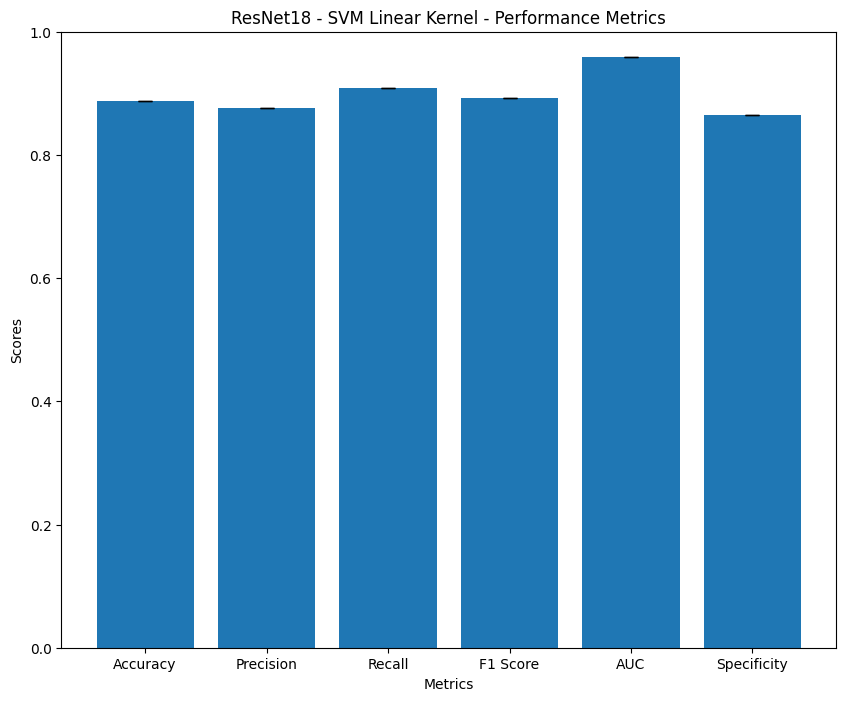

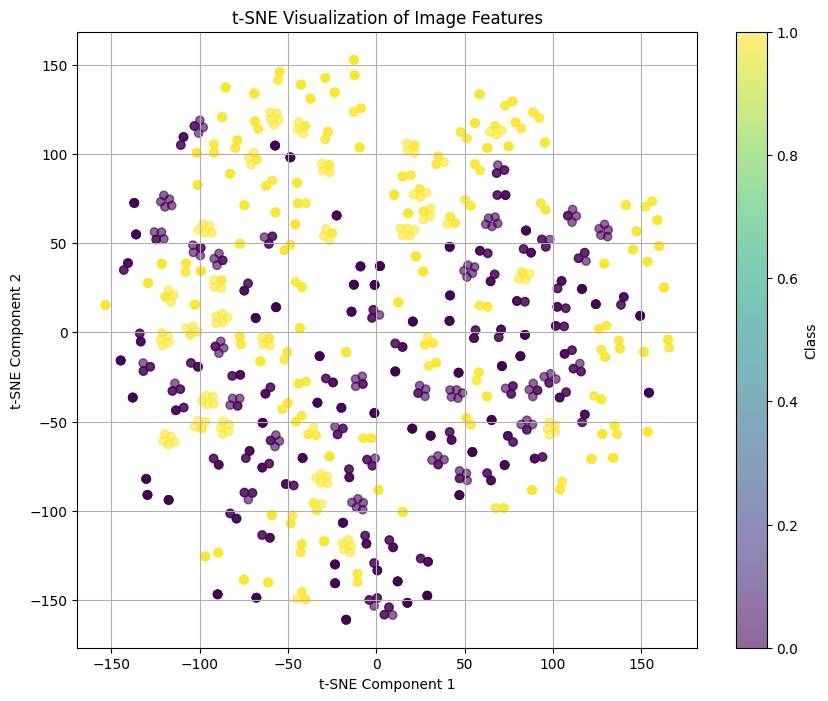

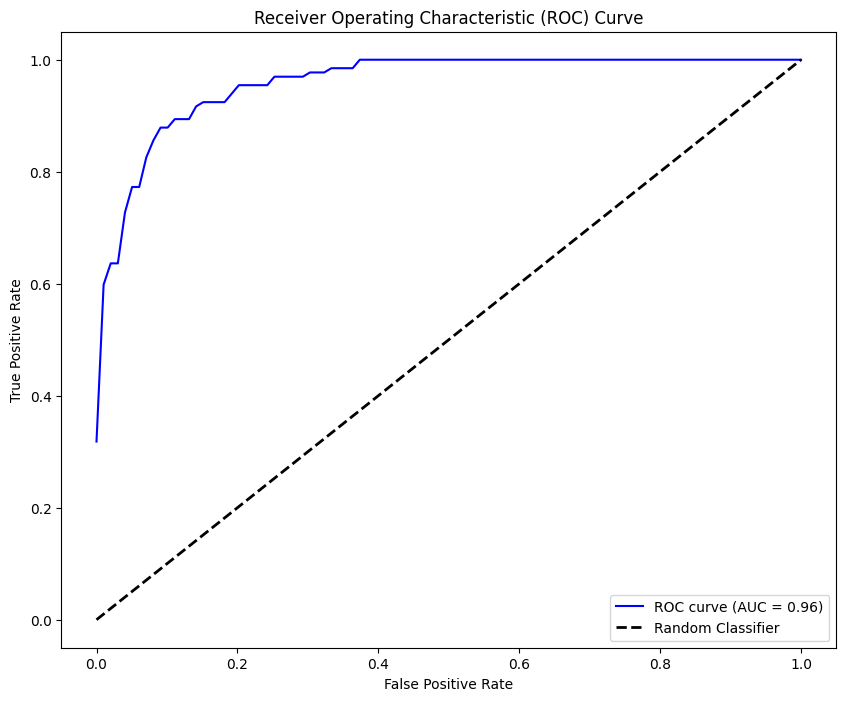

In [ ]:
train_data, test_data = train_test_split(combined_data, test_size=0.3, random_state=42)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=hparams['batch_size'], shuffle=True)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=hparams['test_batch_size'], shuffle=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CustomResNet18().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_linear(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs

print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")

print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)

metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet18 - SVM Linear Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()

tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


Run 1:
Train Accuracy: 0.9784
Test Accuracy: 0.8798
Precision: 0.8217
Recall: 0.9773
F1 Score: 0.8927
AUC: 0.9591
Specificity: 0.7778
Confusion Matrix:
[[ 98  28]
 [  3 129]]

Run 2:
Train Accuracy: 0.9784
Test Accuracy: 0.8798
Precision: 0.8217
Recall: 0.9773
F1 Score: 0.8927
AUC: 0.9591
Specificity: 0.7778
Confusion Matrix:
[[ 98  28]
 [  3 129]]

Run 3:
Train Accuracy: 0.9784
Test Accuracy: 0.8798
Precision: 0.8217
Recall: 0.9773
F1 Score: 0.8927
AUC: 0.9591
Specificity: 0.7778
Confusion Matrix:
[[ 98  28]
 [  3 129]]

Run 4:
Train Accuracy: 0.9784
Test Accuracy: 0.8798
Precision: 0.8217
Recall: 0.9773
F1 Score: 0.8927
AUC: 0.9591
Specificity: 0.7778
Confusion Matrix:
[[ 98  28]
 [  3 129]]

Run 5:
Train Accuracy: 0.9784
Test Accuracy: 0.8798
Precision: 0.8217
Recall: 0.9773
F1 Score: 0.8927
AUC: 0.9591
Specificity: 0.7778
Confusion Matrix:
[[ 98  28]
 [  3 129]]


Average Performance Metrics:
Test Accuracy: 0.8798
Precision: 0.8217
Recall: 0.9773
F1-Score: 0.8927
Specificity: 0.777

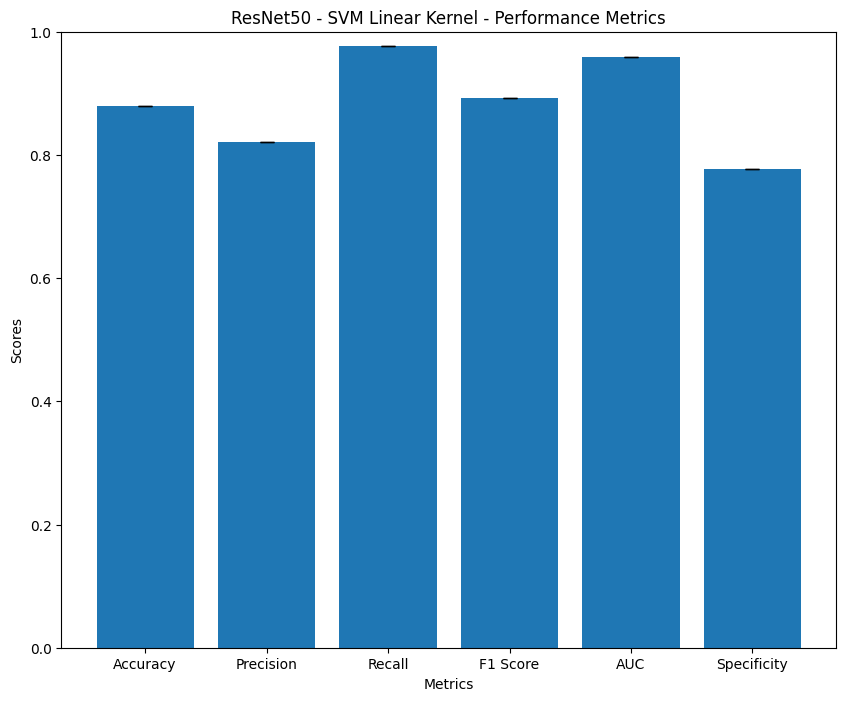

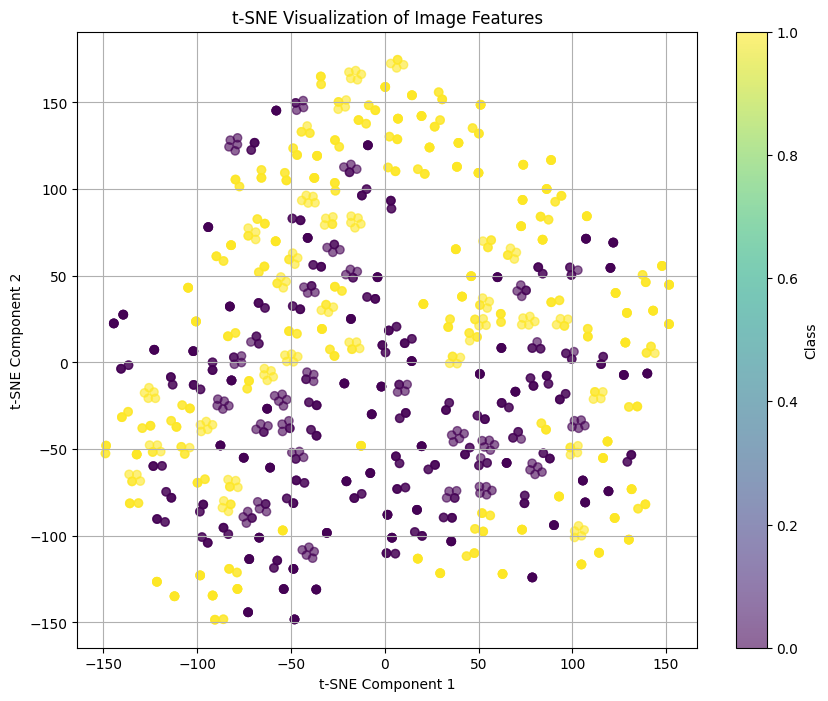

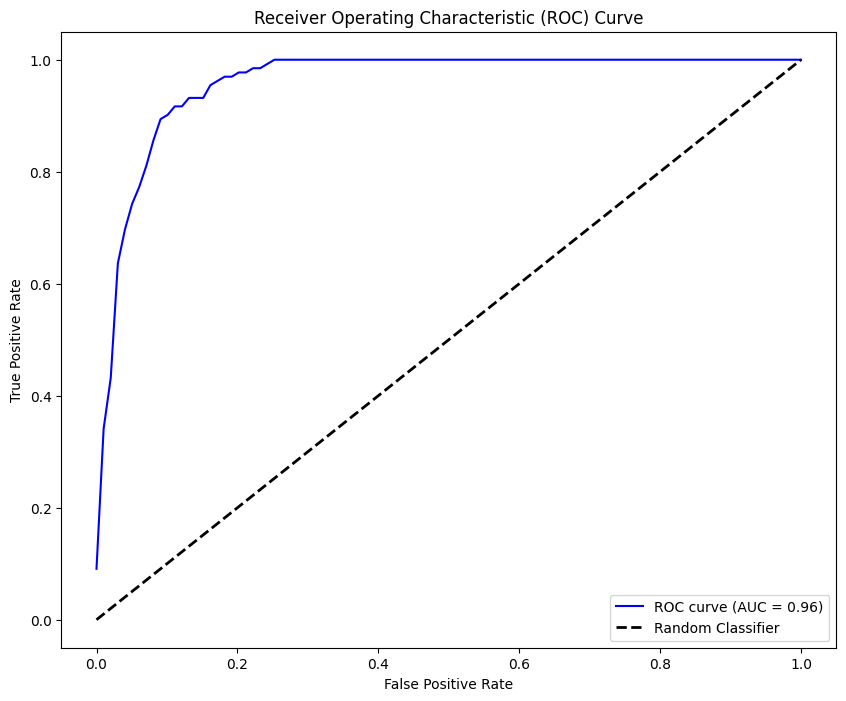

In [ ]:
model = CustomResNet50().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_linear(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet50 - SVM Linear Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.9801
Test Accuracy: 0.9070
Precision: 0.8750
Recall: 0.9545
F1 Score: 0.9130
AUC: 0.9780
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [  6 126]]

Run 2:
Train Accuracy: 0.9801
Test Accuracy: 0.9070
Precision: 0.8750
Recall: 0.9545
F1 Score: 0.9130
AUC: 0.9780
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [  6 126]]

Run 3:
Train Accuracy: 0.9801
Test Accuracy: 0.9070
Precision: 0.8750
Recall: 0.9545
F1 Score: 0.9130
AUC: 0.9780
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [  6 126]]

Run 4:
Train Accuracy: 0.9801
Test Accuracy: 0.9070
Precision: 0.8750
Recall: 0.9545
F1 Score: 0.9130
AUC: 0.9780
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [  6 126]]

Run 5:
Train Accuracy: 0.9801
Test Accuracy: 0.9070
Precision: 0.8750
Recall: 0.9545
F1 Score: 0.9130
AUC: 0.9780
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [  6 126]]


Average Performance Metrics:
Test Accuracy: 0.9070
Precision: 0.8750
Recall: 0.9545
F1-Score: 0.9130
Specificity: 0.857

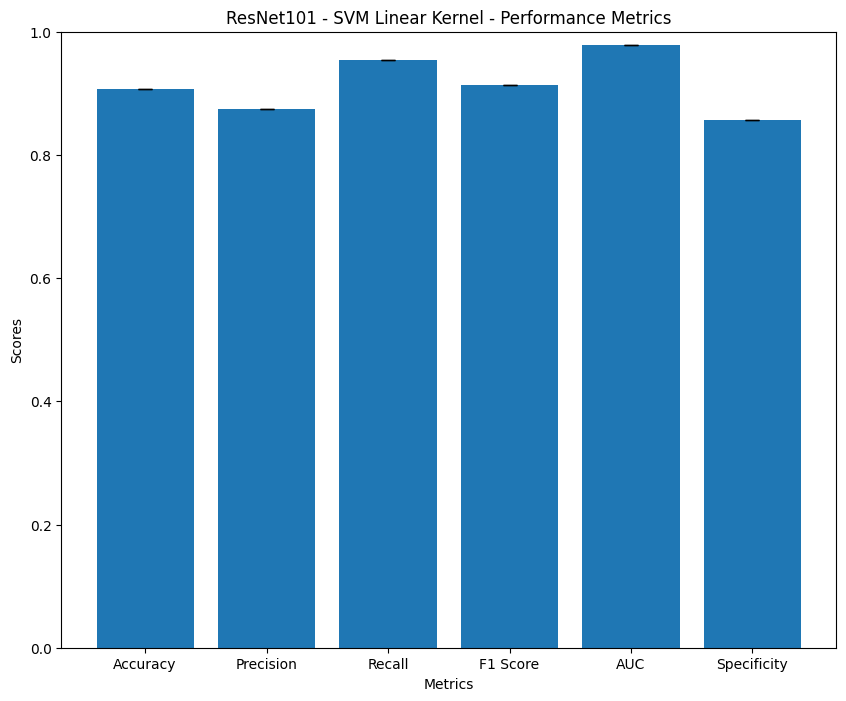

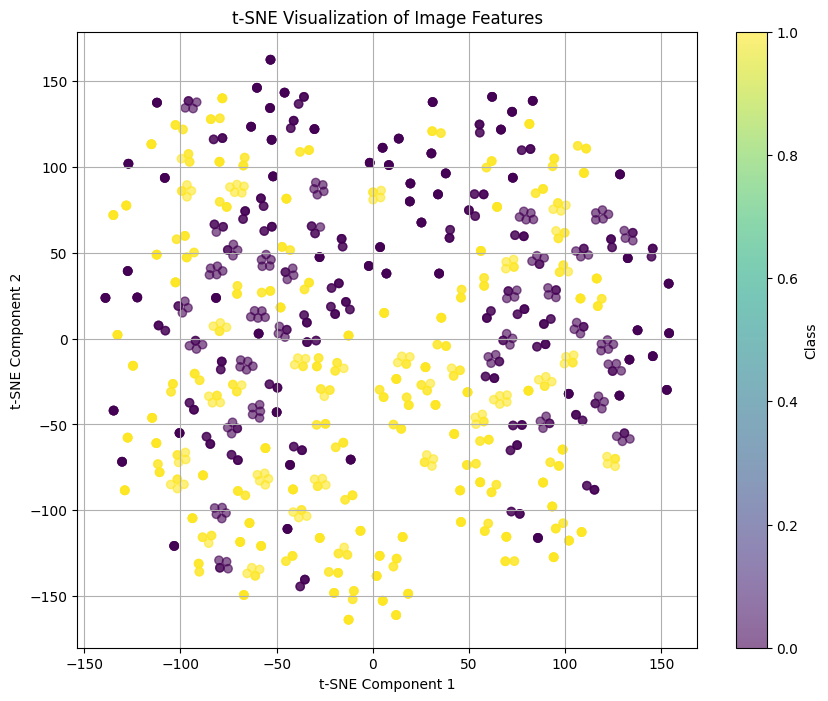

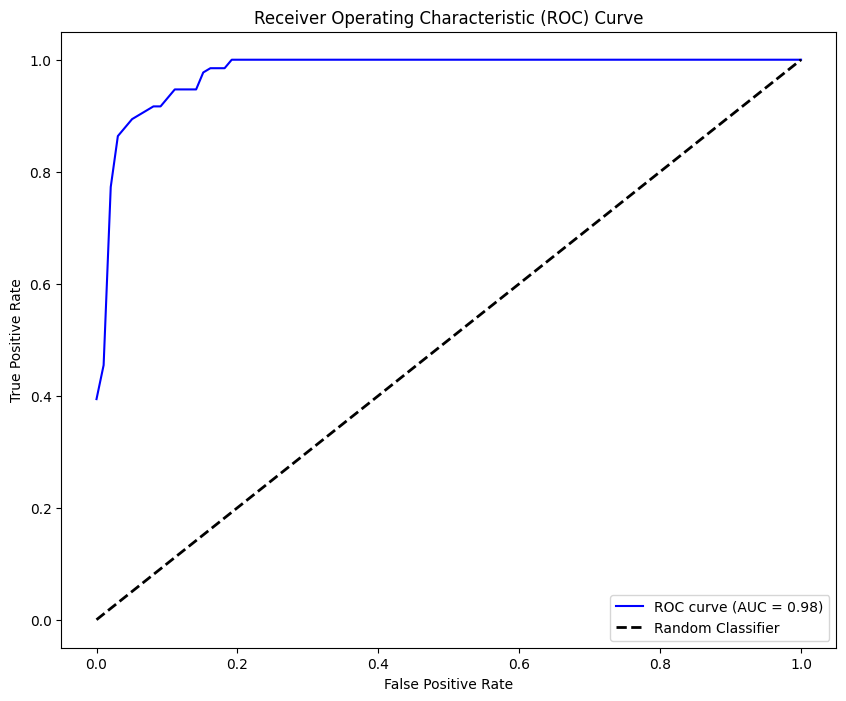

In [ ]:
model = CustomResNet101().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_linear(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs

print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet101 - SVM Linear Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [ ]:
model = CustomResNet18().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_rbf(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet18 - SVM RBF Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [ ]:
model = CustomResNet50().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_rbf(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet50 - SVM RBF Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [ ]:
model = CustomResNet101().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_rbf(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet101 - SVM RBF Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


# SVM - VGG

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:06<00:00, 87.8MB/s]


Run 1:
Train Accuracy: 1.0000
Test Accuracy: 0.9302
Precision: 0.9254
Recall: 0.9394
F1 Score: 0.9323
AUC: 0.9759
Specificity: 0.9206
Confusion Matrix:
[[116  10]
 [  8 124]]

Run 2:
Train Accuracy: 1.0000
Test Accuracy: 0.9302
Precision: 0.9254
Recall: 0.9394
F1 Score: 0.9323
AUC: 0.9759
Specificity: 0.9206
Confusion Matrix:
[[116  10]
 [  8 124]]

Run 3:
Train Accuracy: 1.0000
Test Accuracy: 0.9302
Precision: 0.9254
Recall: 0.9394
F1 Score: 0.9323
AUC: 0.9759
Specificity: 0.9206
Confusion Matrix:
[[116  10]
 [  8 124]]

Run 4:
Train Accuracy: 1.0000
Test Accuracy: 0.9302
Precision: 0.9254
Recall: 0.9394
F1 Score: 0.9323
AUC: 0.9759
Specificity: 0.9206
Confusion Matrix:
[[116  10]
 [  8 124]]

Run 5:
Train Accuracy: 1.0000
Test Accuracy: 0.9302
Precision: 0.9254
Recall: 0.9394
F1 Score: 0.9323
AUC: 0.9759
Specificity: 0.9206
Confusion Matrix:
[[116  10]
 [  8 124]]


Average Performance Metrics:
Test Accuracy: 0.9302
Precision: 0.9254
Recall: 0.9394
F1-Score: 0.9323
Specificity: 0.920

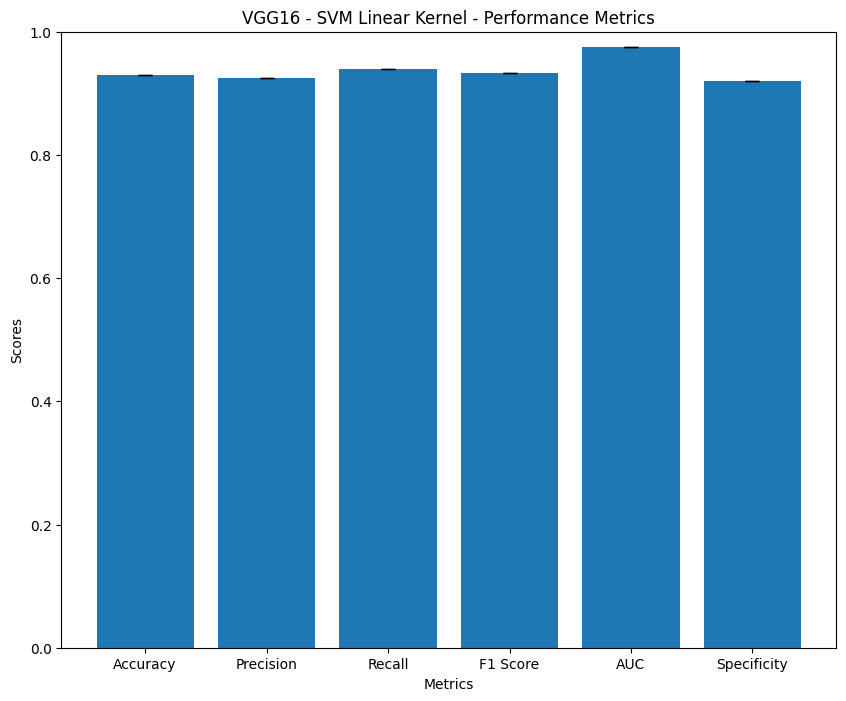

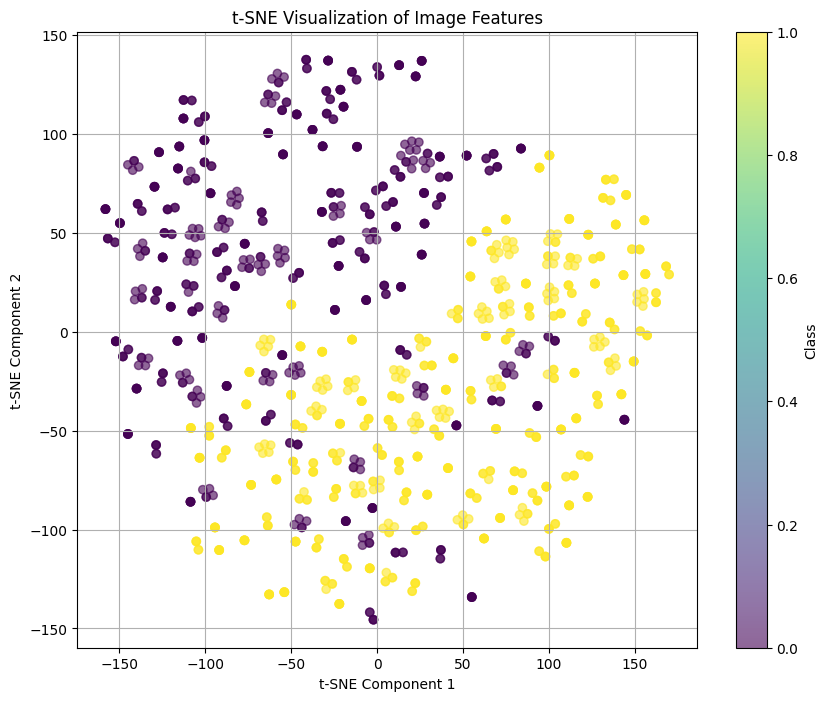

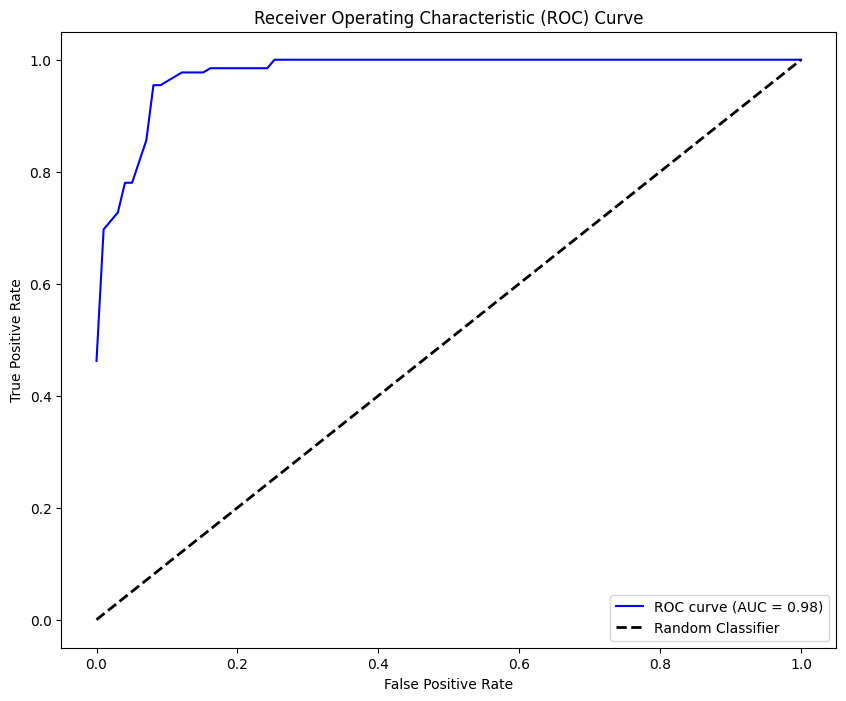

In [ ]:
model = CustomVGG16().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_linear(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('VGG16 - SVM Linear Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 1.0000
Test Accuracy: 0.9380
Precision: 0.9203
Recall: 0.9621
F1 Score: 0.9407
AUC: 0.9825
Specificity: 0.9127
Confusion Matrix:
[[115  11]
 [  5 127]]

Run 2:
Train Accuracy: 1.0000
Test Accuracy: 0.9380
Precision: 0.9203
Recall: 0.9621
F1 Score: 0.9407
AUC: 0.9825
Specificity: 0.9127
Confusion Matrix:
[[115  11]
 [  5 127]]

Run 3:
Train Accuracy: 1.0000
Test Accuracy: 0.9380
Precision: 0.9203
Recall: 0.9621
F1 Score: 0.9407
AUC: 0.9825
Specificity: 0.9127
Confusion Matrix:
[[115  11]
 [  5 127]]

Run 4:
Train Accuracy: 1.0000
Test Accuracy: 0.9380
Precision: 0.9203
Recall: 0.9621
F1 Score: 0.9407
AUC: 0.9825
Specificity: 0.9127
Confusion Matrix:
[[115  11]
 [  5 127]]

Run 5:
Train Accuracy: 1.0000
Test Accuracy: 0.9380
Precision: 0.9203
Recall: 0.9621
F1 Score: 0.9407
AUC: 0.9825
Specificity: 0.9127
Confusion Matrix:
[[115  11]
 [  5 127]]


Average Performance Metrics:
Test Accuracy: 0.9380
Precision: 0.9203
Recall: 0.9621
F1-Score: 0.9407
Specificity: 0.912

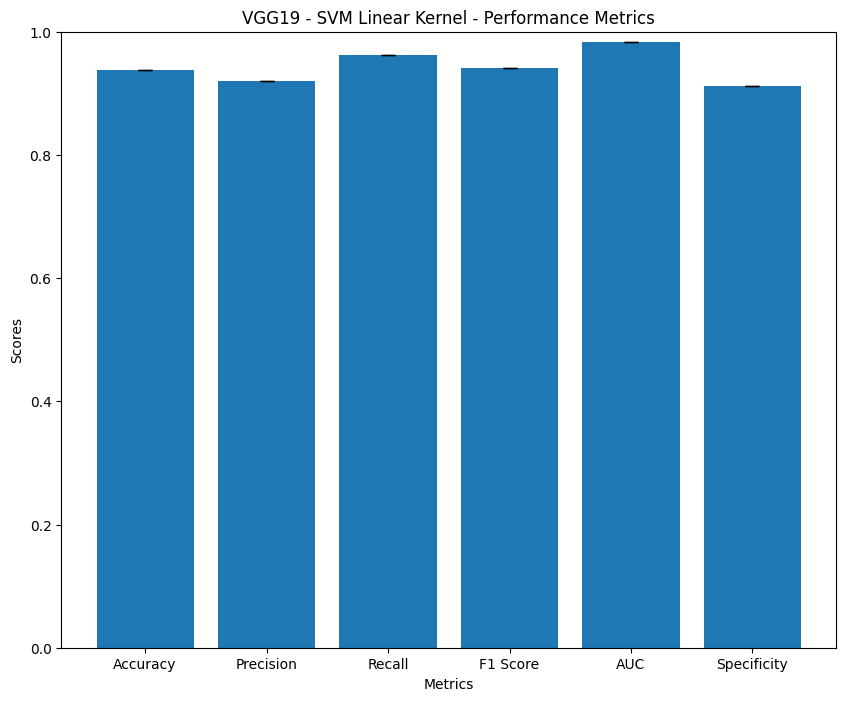

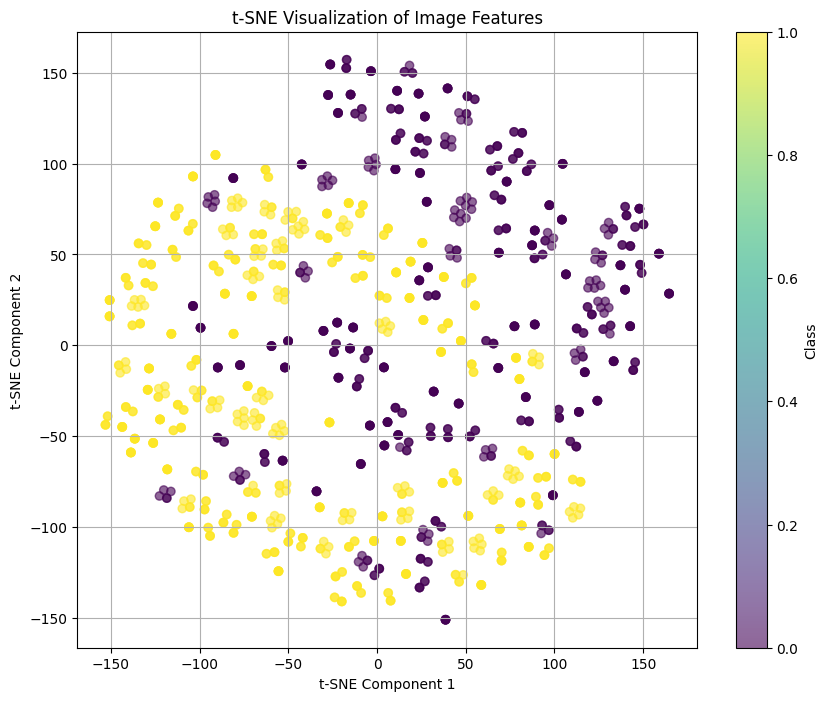

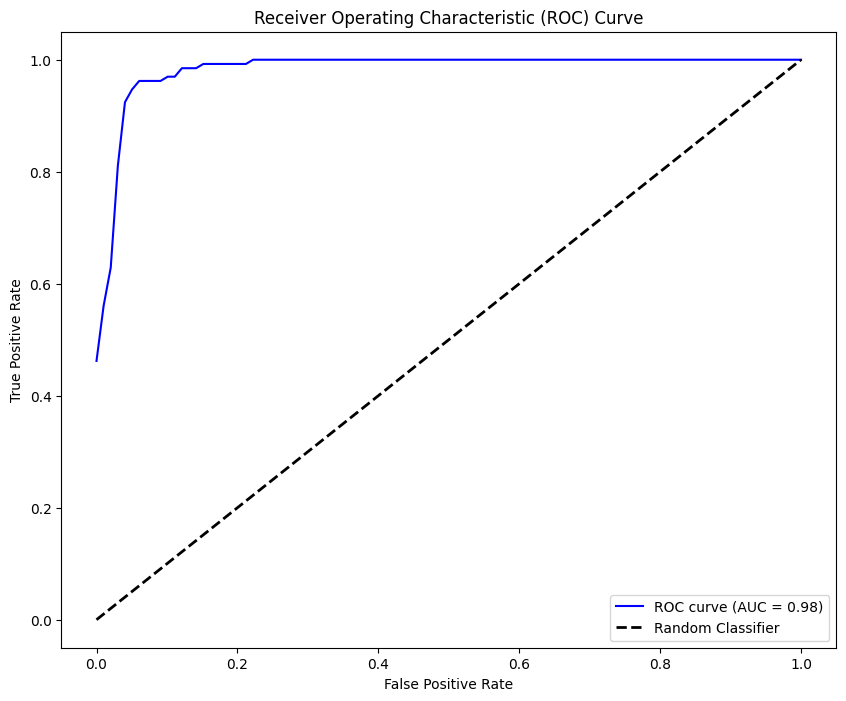

In [ ]:
model = CustomVGG19().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_linear(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('VGG19 - SVM Linear Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.9186
Test Accuracy: 0.8953
Precision: 0.8302
Recall: 1.0000
F1 Score: 0.9072
AUC: 0.9573
Specificity: 0.7857
Confusion Matrix:
[[ 99  27]
 [  0 132]]

Run 2:
Train Accuracy: 0.9186
Test Accuracy: 0.8953
Precision: 0.8302
Recall: 1.0000
F1 Score: 0.9072
AUC: 0.9572
Specificity: 0.7857
Confusion Matrix:
[[ 99  27]
 [  0 132]]

Run 3:
Train Accuracy: 0.9186
Test Accuracy: 0.8953
Precision: 0.8302
Recall: 1.0000
F1 Score: 0.9072
AUC: 0.9573
Specificity: 0.7857
Confusion Matrix:
[[ 99  27]
 [  0 132]]

Run 4:
Train Accuracy: 0.9186
Test Accuracy: 0.8953
Precision: 0.8302
Recall: 1.0000
F1 Score: 0.9072
AUC: 0.9571
Specificity: 0.7857
Confusion Matrix:
[[ 99  27]
 [  0 132]]

Run 5:
Train Accuracy: 0.9186
Test Accuracy: 0.8953
Precision: 0.8302
Recall: 1.0000
F1 Score: 0.9072
AUC: 0.9572
Specificity: 0.7857
Confusion Matrix:
[[ 99  27]
 [  0 132]]


Average Performance Metrics:
Test Accuracy: 0.8953
Precision: 0.8302
Recall: 1.0000
F1-Score: 0.9072
Specificity: 0.785

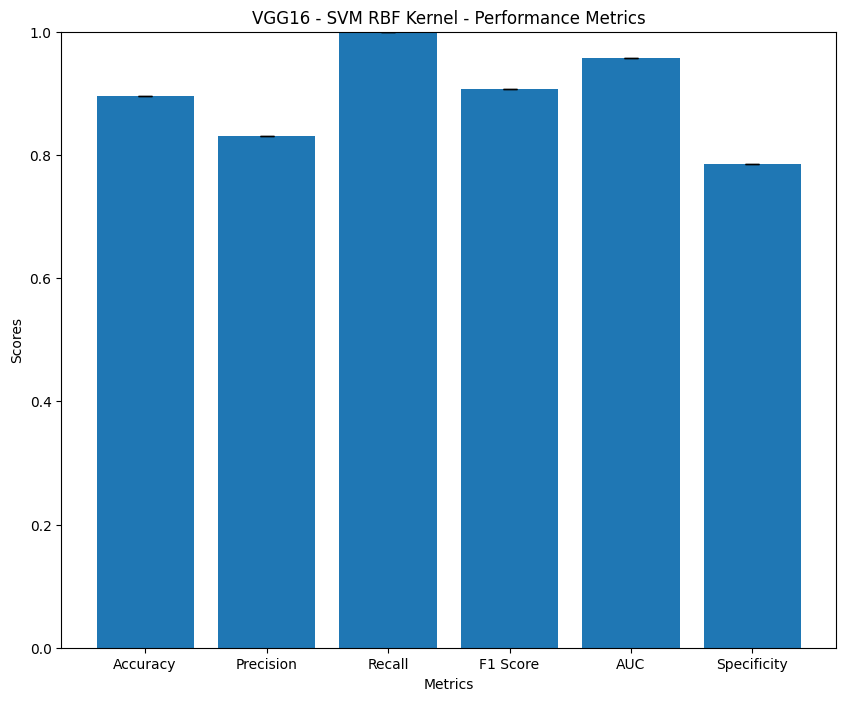

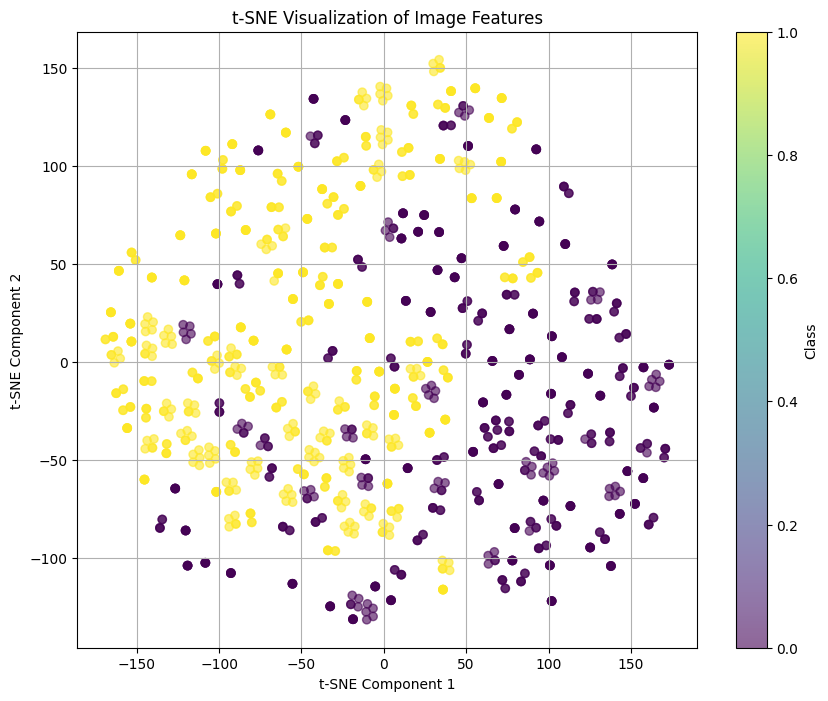

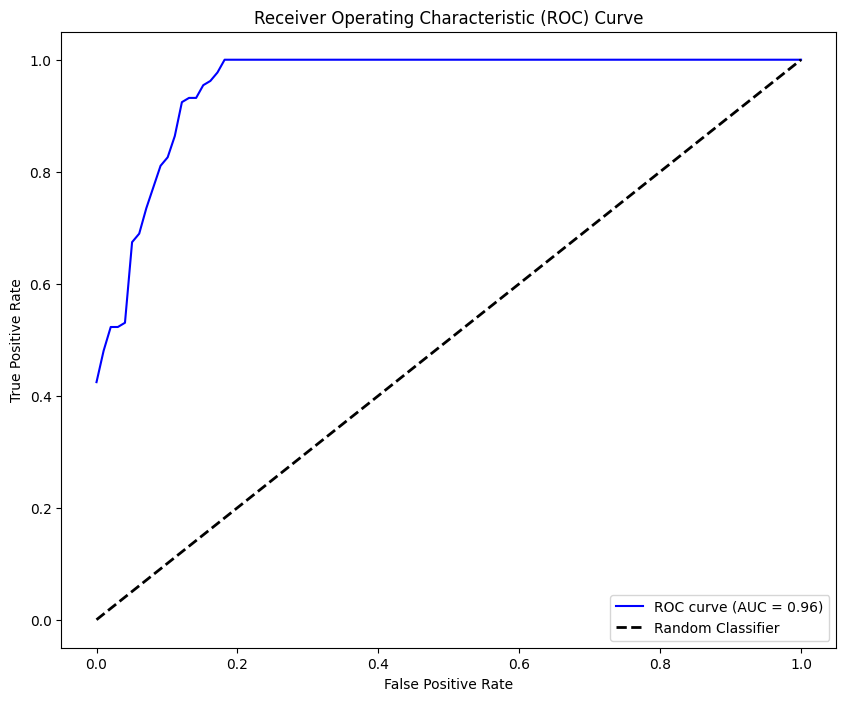

In [ ]:
model = CustomVGG16().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_rbf(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('VGG16 - SVM RBF Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.9169
Test Accuracy: 0.8876
Precision: 0.8239
Recall: 0.9924
F1 Score: 0.9003
AUC: 0.9510
Specificity: 0.7778
Confusion Matrix:
[[ 98  28]
 [  1 131]]

Run 2:
Train Accuracy: 0.9169
Test Accuracy: 0.8876
Precision: 0.8239
Recall: 0.9924
F1 Score: 0.9003
AUC: 0.9510
Specificity: 0.7778
Confusion Matrix:
[[ 98  28]
 [  1 131]]

Run 3:
Train Accuracy: 0.9169
Test Accuracy: 0.8876
Precision: 0.8239
Recall: 0.9924
F1 Score: 0.9003
AUC: 0.9510
Specificity: 0.7778
Confusion Matrix:
[[ 98  28]
 [  1 131]]

Run 4:
Train Accuracy: 0.9169
Test Accuracy: 0.8876
Precision: 0.8239
Recall: 0.9924
F1 Score: 0.9003
AUC: 0.9510
Specificity: 0.7778
Confusion Matrix:
[[ 98  28]
 [  1 131]]

Run 5:
Train Accuracy: 0.9169
Test Accuracy: 0.8876
Precision: 0.8239
Recall: 0.9924
F1 Score: 0.9003
AUC: 0.9510
Specificity: 0.7778
Confusion Matrix:
[[ 98  28]
 [  1 131]]


Average Performance Metrics:
Test Accuracy: 0.8876
Precision: 0.8239
Recall: 0.9924
F1-Score: 0.9003
Specificity: 0.777

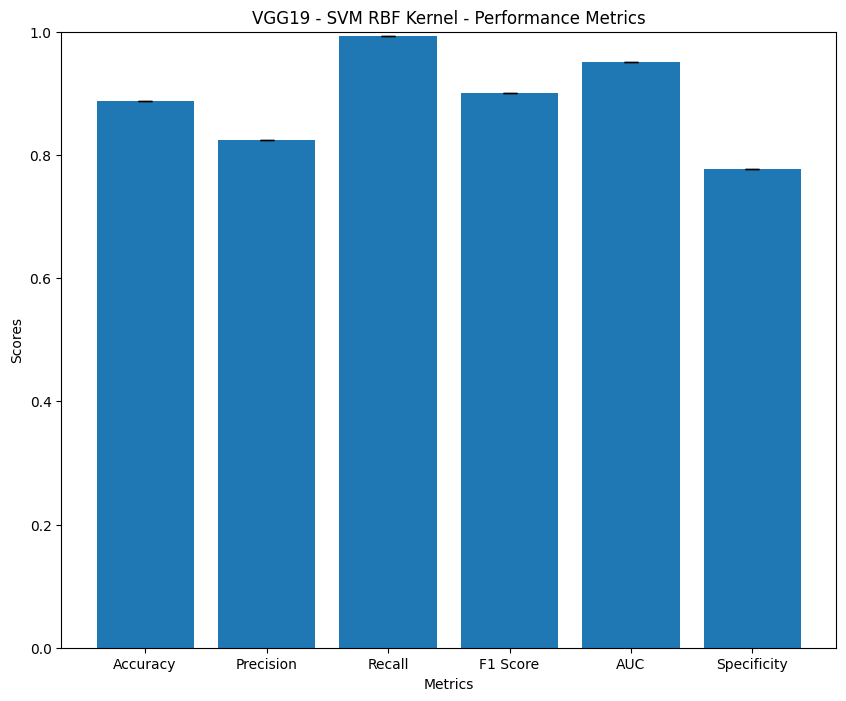

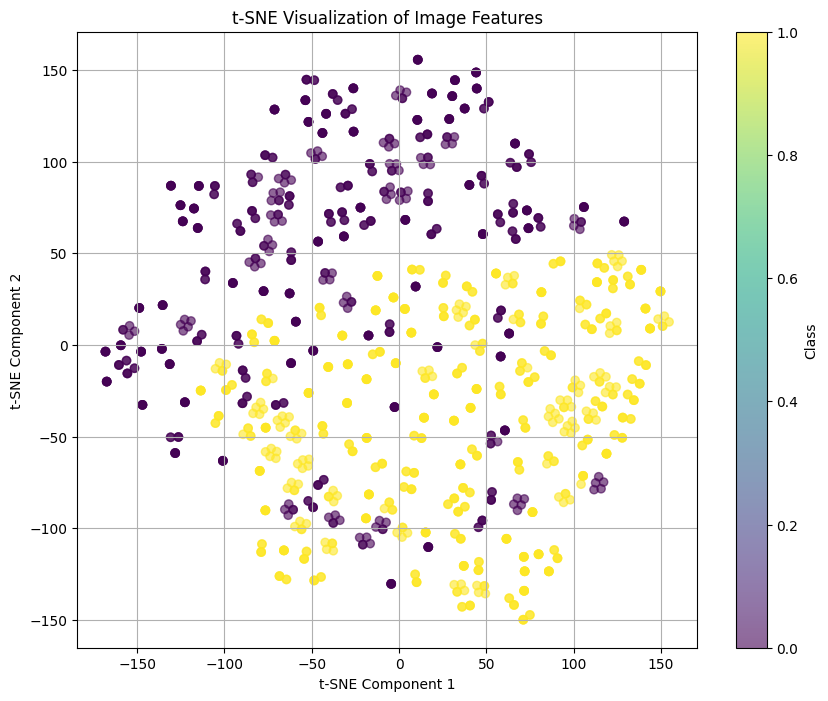

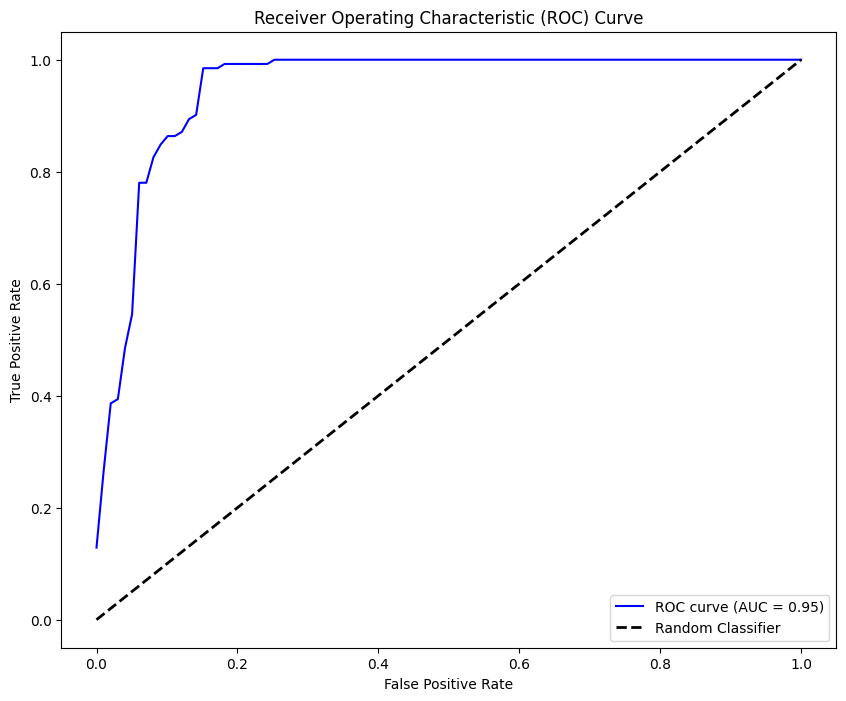

In [ ]:
model = CustomVGG19().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_rbf(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('VGG19 - SVM RBF Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# SVM - DenseNet

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 152MB/s]


Run 1:
Train Accuracy: 0.9967
Test Accuracy: 0.8721
Precision: 0.8779
Recall: 0.8712
F1 Score: 0.8745
AUC: 0.9579
Specificity: 0.8730
Confusion Matrix:
[[110  16]
 [ 17 115]]

Run 2:
Train Accuracy: 0.9967
Test Accuracy: 0.8721
Precision: 0.8779
Recall: 0.8712
F1 Score: 0.8745
AUC: 0.9579
Specificity: 0.8730
Confusion Matrix:
[[110  16]
 [ 17 115]]

Run 3:
Train Accuracy: 0.9967
Test Accuracy: 0.8721
Precision: 0.8779
Recall: 0.8712
F1 Score: 0.8745
AUC: 0.9579
Specificity: 0.8730
Confusion Matrix:
[[110  16]
 [ 17 115]]

Run 4:
Train Accuracy: 0.9967
Test Accuracy: 0.8721
Precision: 0.8779
Recall: 0.8712
F1 Score: 0.8745
AUC: 0.9579
Specificity: 0.8730
Confusion Matrix:
[[110  16]
 [ 17 115]]

Run 5:
Train Accuracy: 0.9967
Test Accuracy: 0.8721
Precision: 0.8779
Recall: 0.8712
F1 Score: 0.8745
AUC: 0.9579
Specificity: 0.8730
Confusion Matrix:
[[110  16]
 [ 17 115]]


Average Performance Metrics:
Test Accuracy: 0.8721
Precision: 0.8779
Recall: 0.8712
F1-Score: 0.8745
Specificity: 0.873

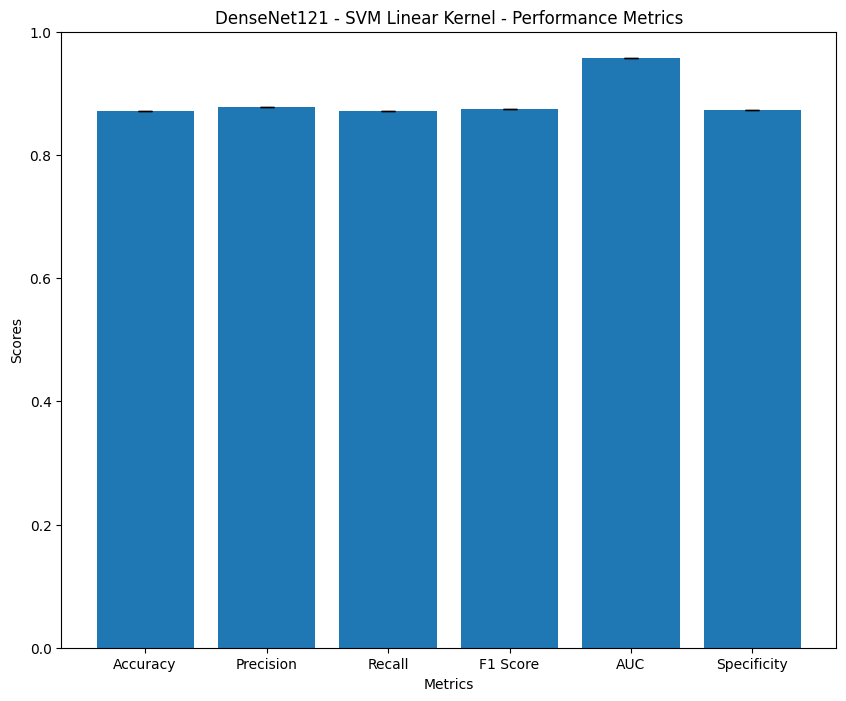

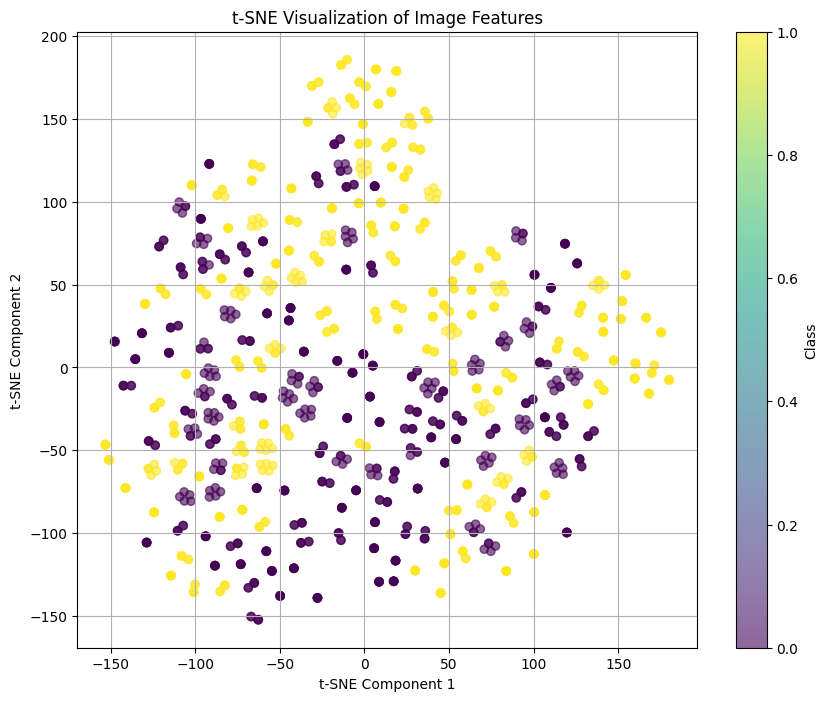

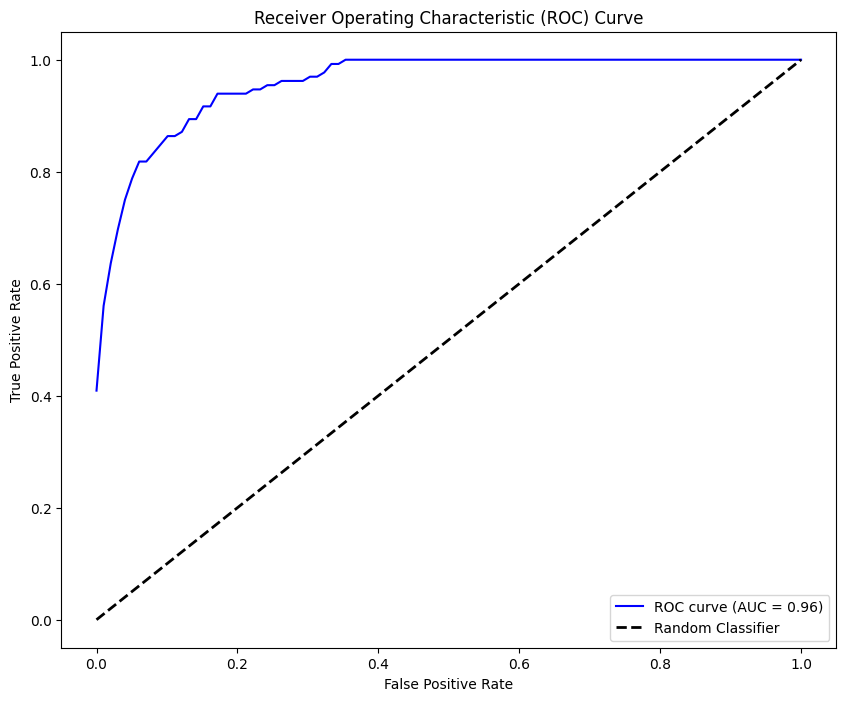

In [ ]:
model = CustomDenseNet121().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_linear(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('DenseNet121 - SVM Linear Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 1.0000
Test Accuracy: 0.8837
Precision: 0.8446
Recall: 0.9470
F1 Score: 0.8929
AUC: 0.9658
Specificity: 0.8175
Confusion Matrix:
[[103  23]
 [  7 125]]

Run 2:
Train Accuracy: 1.0000
Test Accuracy: 0.8837
Precision: 0.8446
Recall: 0.9470
F1 Score: 0.8929
AUC: 0.9658
Specificity: 0.8175
Confusion Matrix:
[[103  23]
 [  7 125]]

Run 3:
Train Accuracy: 1.0000
Test Accuracy: 0.8837
Precision: 0.8446
Recall: 0.9470
F1 Score: 0.8929
AUC: 0.9658
Specificity: 0.8175
Confusion Matrix:
[[103  23]
 [  7 125]]

Run 4:
Train Accuracy: 1.0000
Test Accuracy: 0.8837
Precision: 0.8446
Recall: 0.9470
F1 Score: 0.8929
AUC: 0.9658
Specificity: 0.8175
Confusion Matrix:
[[103  23]
 [  7 125]]

Run 5:
Train Accuracy: 1.0000
Test Accuracy: 0.8837
Precision: 0.8446
Recall: 0.9470
F1 Score: 0.8929
AUC: 0.9658
Specificity: 0.8175
Confusion Matrix:
[[103  23]
 [  7 125]]


Average Performance Metrics:
Test Accuracy: 0.8837
Precision: 0.8446
Recall: 0.9470
F1-Score: 0.8929
Specificity: 0.817

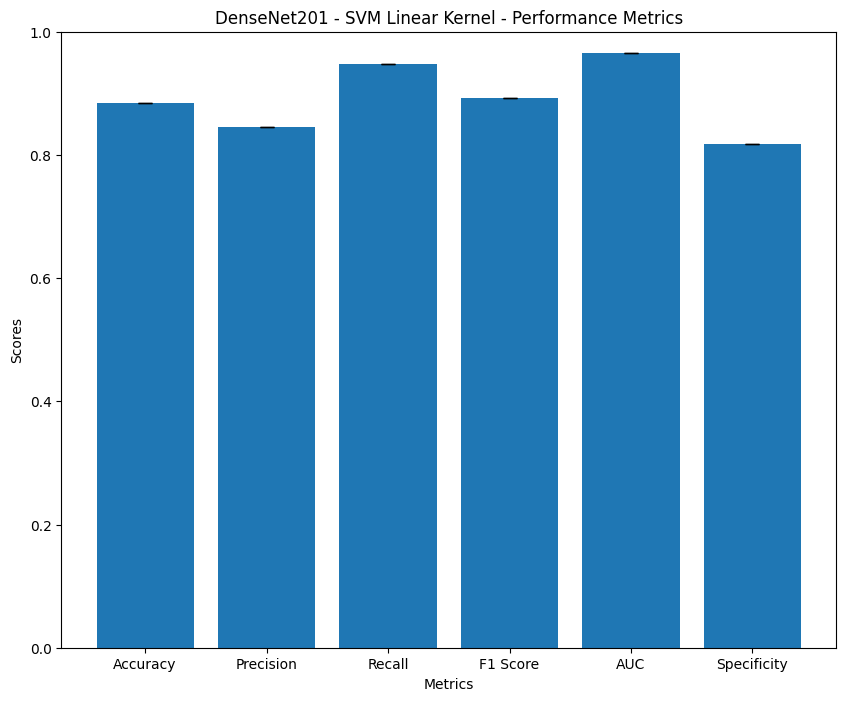

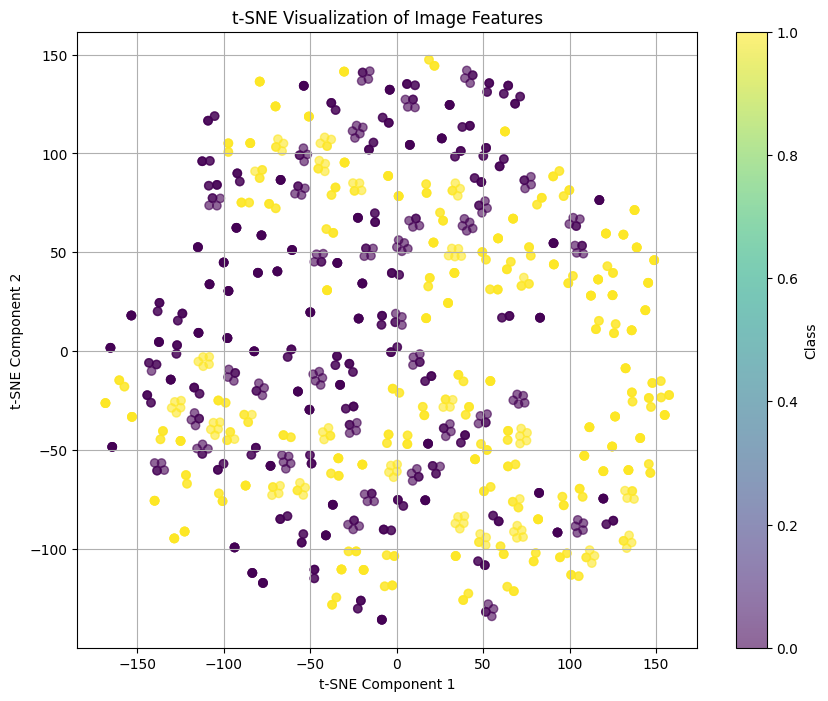

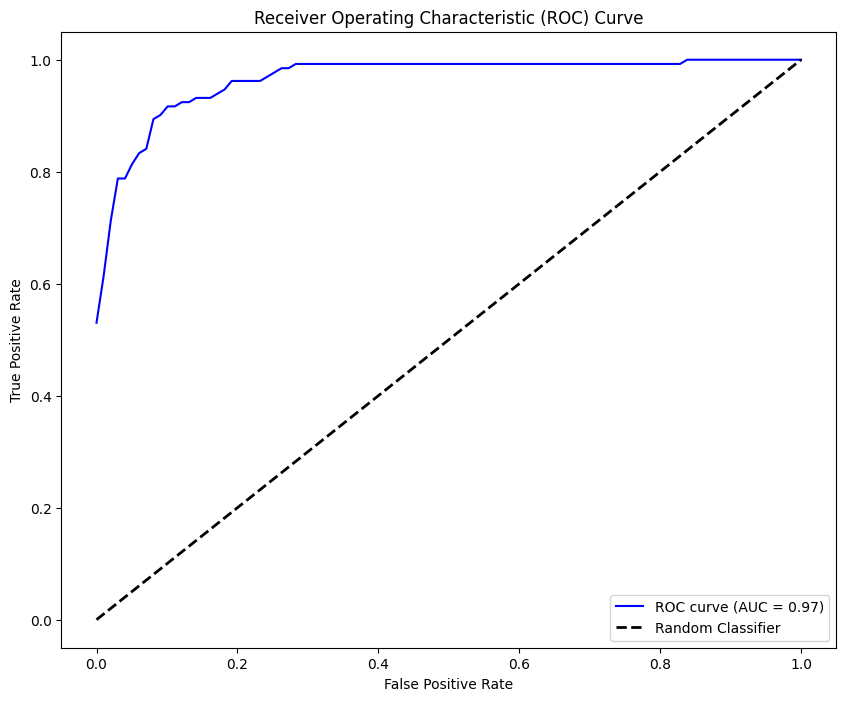

In [ ]:
model = CustomDenseNet201().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_linear(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('DenseNet201 - SVM Linear Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.8040
Test Accuracy: 0.7713
Precision: 0.8174
Recall: 0.7121
F1 Score: 0.7611
AUC: 0.8559
Specificity: 0.8333
Confusion Matrix:
[[105  21]
 [ 38  94]]

Run 2:
Train Accuracy: 0.8040
Test Accuracy: 0.7713
Precision: 0.8174
Recall: 0.7121
F1 Score: 0.7611
AUC: 0.8560
Specificity: 0.8333
Confusion Matrix:
[[105  21]
 [ 38  94]]

Run 3:
Train Accuracy: 0.8040
Test Accuracy: 0.7713
Precision: 0.8174
Recall: 0.7121
F1 Score: 0.7611
AUC: 0.8559
Specificity: 0.8333
Confusion Matrix:
[[105  21]
 [ 38  94]]

Run 4:
Train Accuracy: 0.8040
Test Accuracy: 0.7713
Precision: 0.8174
Recall: 0.7121
F1 Score: 0.7611
AUC: 0.8561
Specificity: 0.8333
Confusion Matrix:
[[105  21]
 [ 38  94]]

Run 5:
Train Accuracy: 0.8040
Test Accuracy: 0.7713
Precision: 0.8174
Recall: 0.7121
F1 Score: 0.7611
AUC: 0.8560
Specificity: 0.8333
Confusion Matrix:
[[105  21]
 [ 38  94]]


Average Performance Metrics:
Test Accuracy: 0.7713
Precision: 0.8174
Recall: 0.7121
F1-Score: 0.7611
Specificity: 0.833

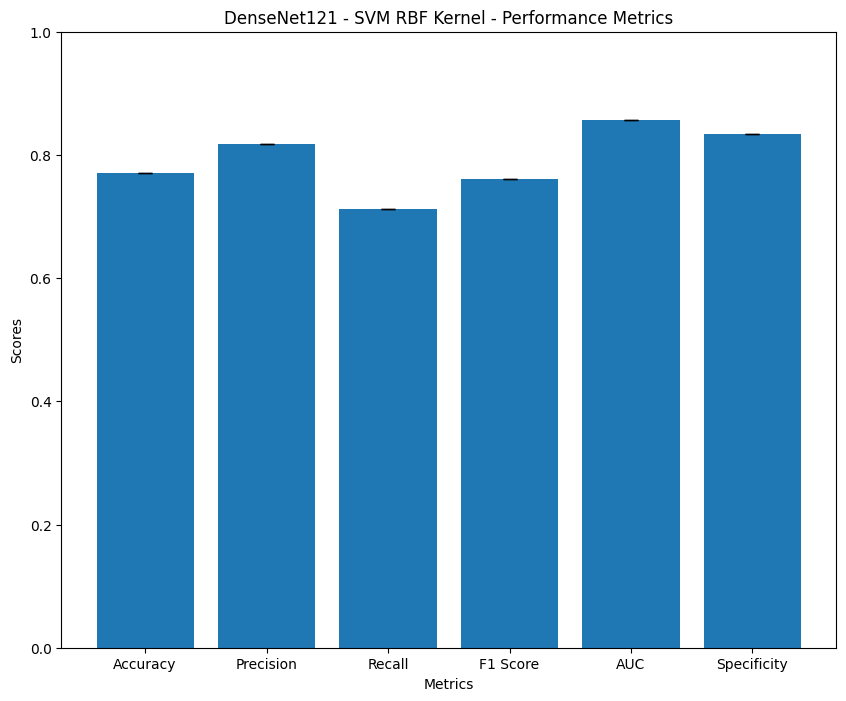

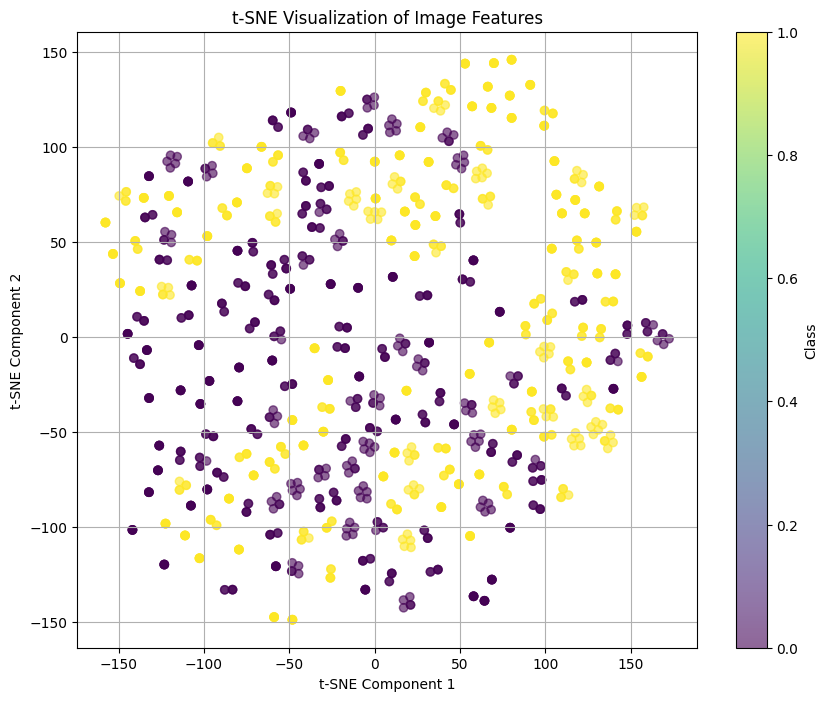

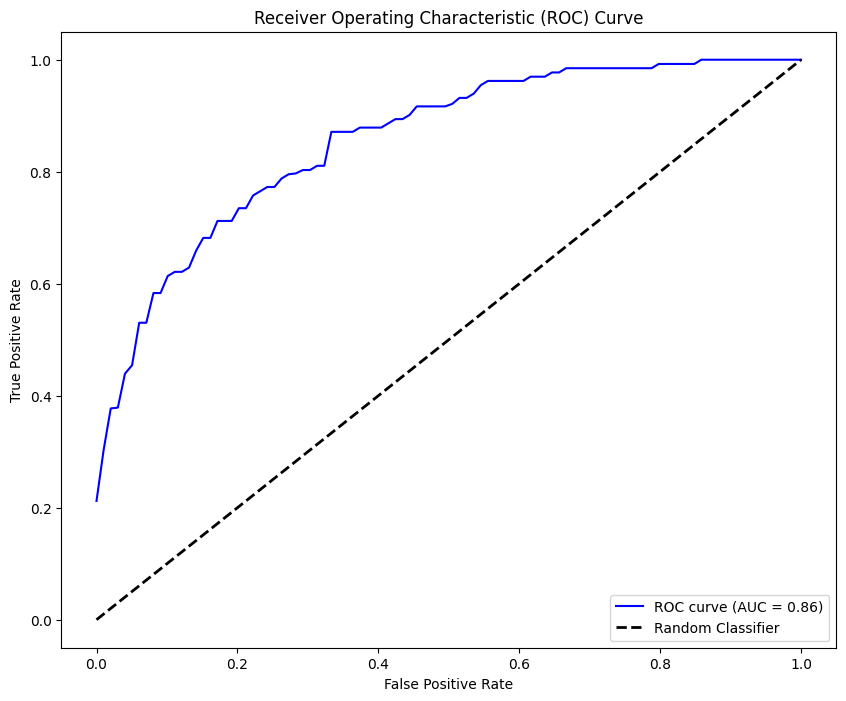

In [ ]:
model = CustomDenseNet121().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_rbf(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('DenseNet121 - SVM RBF Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.8106
Test Accuracy: 0.7752
Precision: 0.8364
Recall: 0.6970
F1 Score: 0.7603
AUC: 0.8994
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [ 40  92]]

Run 2:
Train Accuracy: 0.8106
Test Accuracy: 0.7752
Precision: 0.8364
Recall: 0.6970
F1 Score: 0.7603
AUC: 0.8994
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [ 40  92]]

Run 3:
Train Accuracy: 0.8106
Test Accuracy: 0.7752
Precision: 0.8364
Recall: 0.6970
F1 Score: 0.7603
AUC: 0.8994
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [ 40  92]]

Run 4:
Train Accuracy: 0.8106
Test Accuracy: 0.7752
Precision: 0.8364
Recall: 0.6970
F1 Score: 0.7603
AUC: 0.8994
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [ 40  92]]

Run 5:
Train Accuracy: 0.8106
Test Accuracy: 0.7752
Precision: 0.8364
Recall: 0.6970
F1 Score: 0.7603
AUC: 0.8994
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [ 40  92]]


Average Performance Metrics:
Test Accuracy: 0.7752
Precision: 0.8364
Recall: 0.6970
F1-Score: 0.7603
Specificity: 0.857

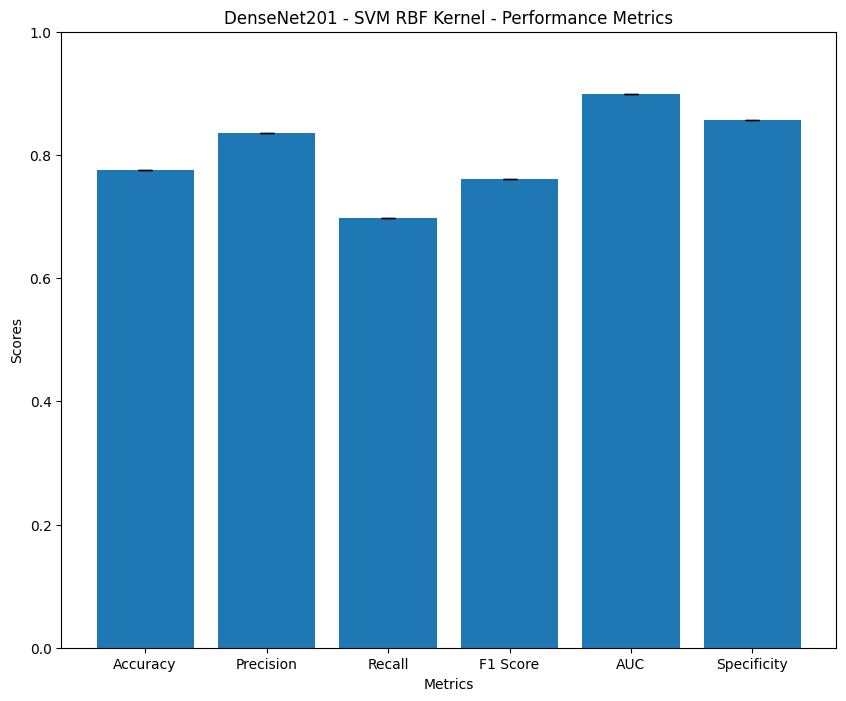

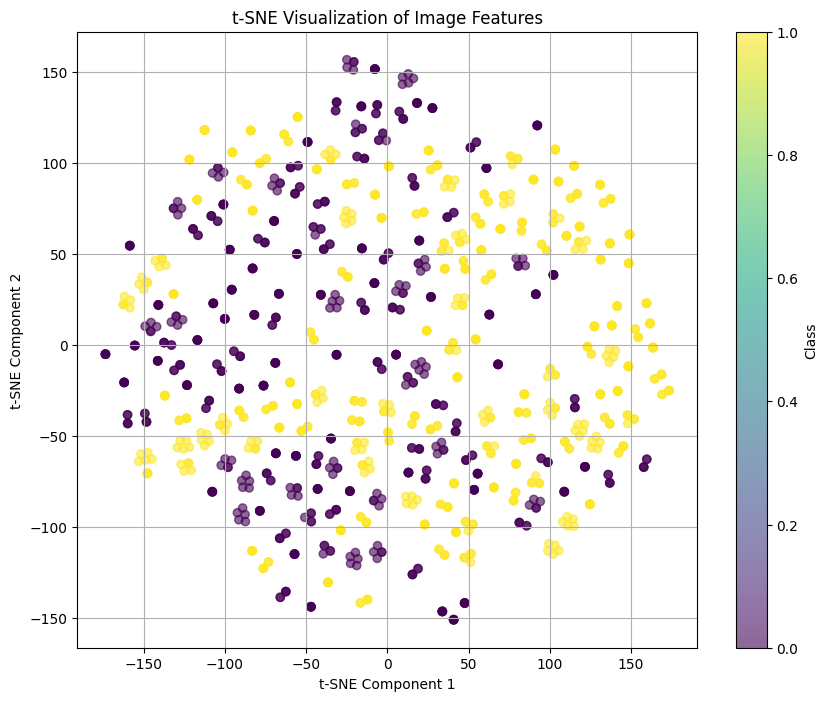

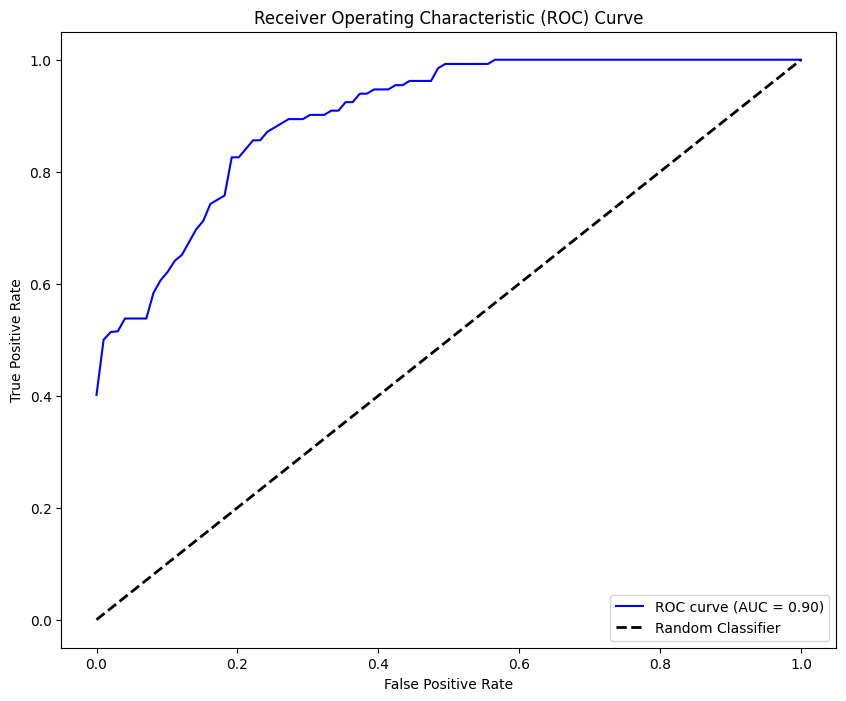

In [ ]:
model = CustomDenseNet201().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_svm_rbf(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('DenseNet201 - SVM RBF Kernel - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


# LDA

# LDA - ResNet

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.9884
Test Accuracy: 0.8605
Precision: 0.8243
Recall: 0.9242
F1 Score: 0.8714
AUC: 0.9356
Specificity: 0.7937
Confusion Matrix:
[[100  26]
 [ 10 122]]

Run 2:
Train Accuracy: 0.9884
Test Accuracy: 0.8605
Precision: 0.8243
Recall: 0.9242
F1 Score: 0.8714
AUC: 0.9356
Specificity: 0.7937
Confusion Matrix:
[[100  26]
 [ 10 122]]

Run 3:
Train Accuracy: 0.9884
Test Accuracy: 0.8605
Precision: 0.8243
Recall: 0.9242
F1 Score: 0.8714
AUC: 0.9356
Specificity: 0.7937
Confusion Matrix:
[[100  26]
 [ 10 122]]

Run 4:
Train Accuracy: 0.9884
Test Accuracy: 0.8605
Precision: 0.8243
Recall: 0.9242
F1 Score: 0.8714
AUC: 0.9356
Specificity: 0.7937
Confusion Matrix:
[[100  26]
 [ 10 122]]

Run 5:
Train Accuracy: 0.9884
Test Accuracy: 0.8605
Precision: 0.8243
Recall: 0.9242
F1 Score: 0.8714
AUC: 0.9356
Specificity: 0.7937
Confusion Matrix:
[[100  26]
 [ 10 122]]


Average Performance Metrics:
Test Accuracy: 0.8605
Precision: 0.8243
Recall: 0.9242
F1-Score: 0.8714
Specificity: 0.793

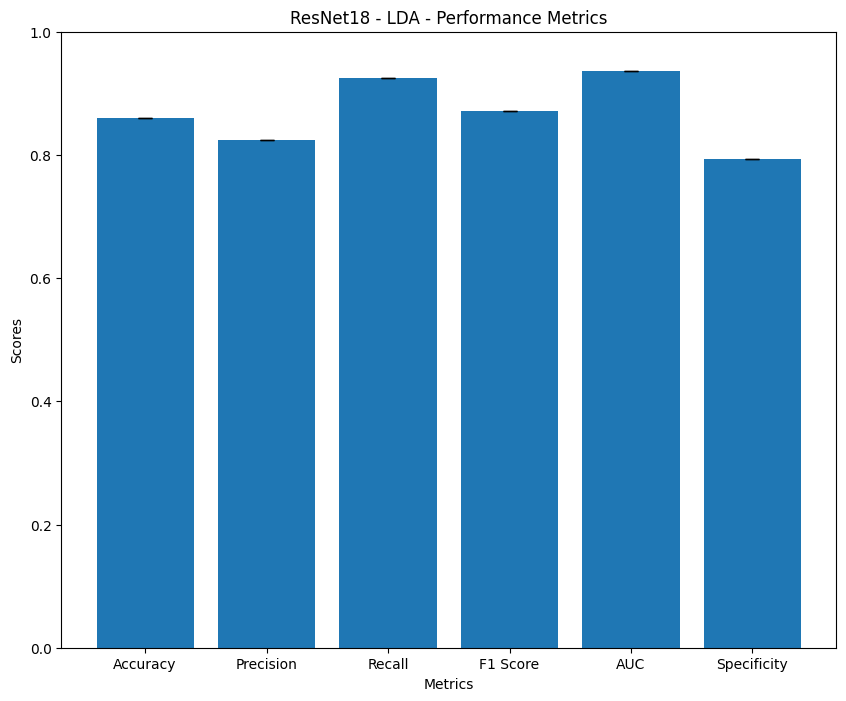

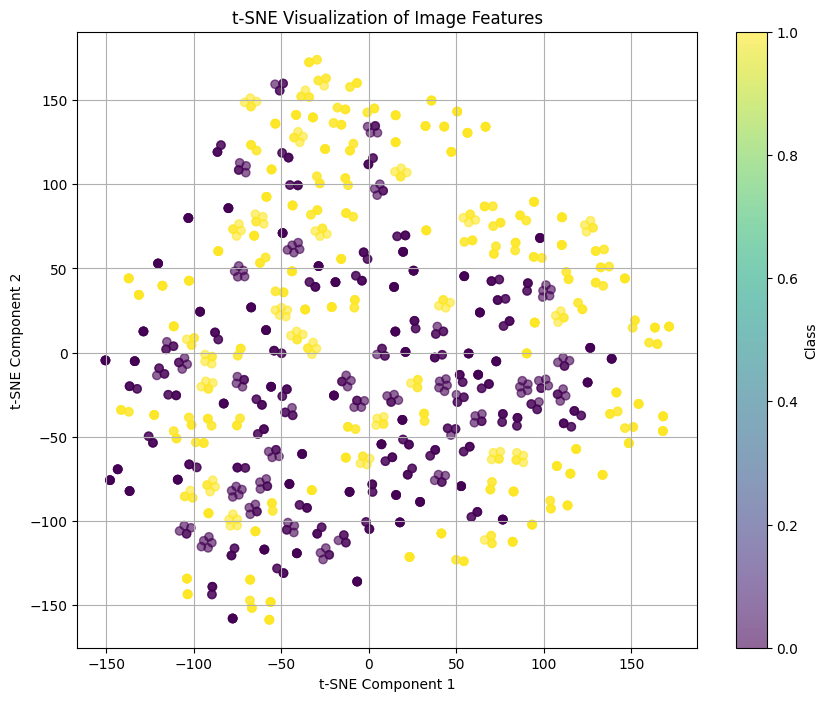

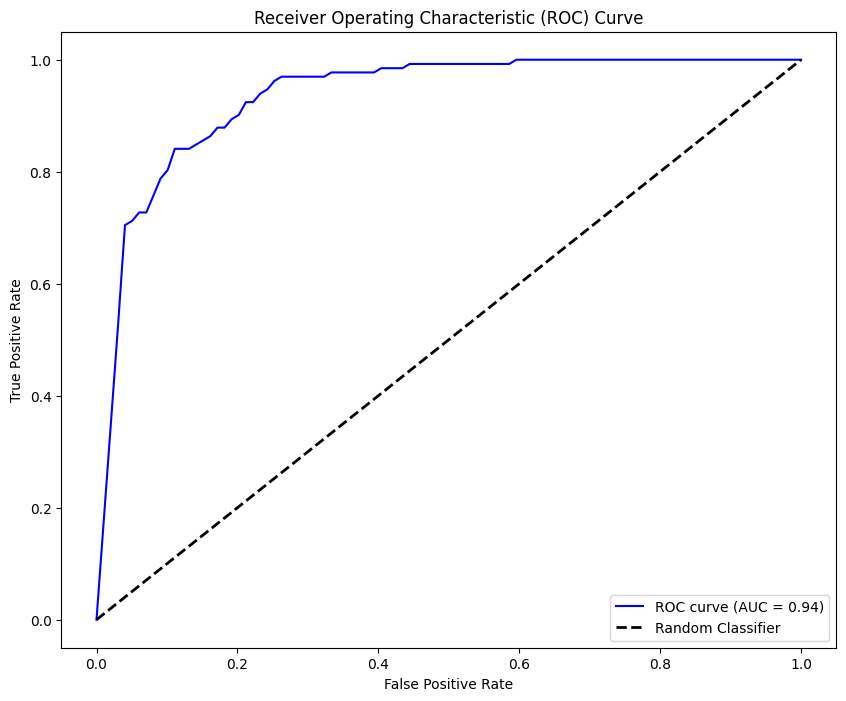

In [ ]:
model = CustomResNet18().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_lda(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet18 - LDA - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.9884
Test Accuracy: 0.8643
Precision: 0.8299
Recall: 0.9242
F1 Score: 0.8746
AUC: 0.9300
Specificity: 0.8016
Confusion Matrix:
[[101  25]
 [ 10 122]]

Run 2:
Train Accuracy: 0.9884
Test Accuracy: 0.8643
Precision: 0.8299
Recall: 0.9242
F1 Score: 0.8746
AUC: 0.9300
Specificity: 0.8016
Confusion Matrix:
[[101  25]
 [ 10 122]]

Run 3:
Train Accuracy: 0.9884
Test Accuracy: 0.8643
Precision: 0.8299
Recall: 0.9242
F1 Score: 0.8746
AUC: 0.9300
Specificity: 0.8016
Confusion Matrix:
[[101  25]
 [ 10 122]]

Run 4:
Train Accuracy: 0.9884
Test Accuracy: 0.8643
Precision: 0.8299
Recall: 0.9242
F1 Score: 0.8746
AUC: 0.9300
Specificity: 0.8016
Confusion Matrix:
[[101  25]
 [ 10 122]]

Run 5:
Train Accuracy: 0.9884
Test Accuracy: 0.8643
Precision: 0.8299
Recall: 0.9242
F1 Score: 0.8746
AUC: 0.9300
Specificity: 0.8016
Confusion Matrix:
[[101  25]
 [ 10 122]]


Average Performance Metrics:
Test Accuracy: 0.8643
Precision: 0.8299
Recall: 0.9242
F1-Score: 0.8746
Specificity: 0.801

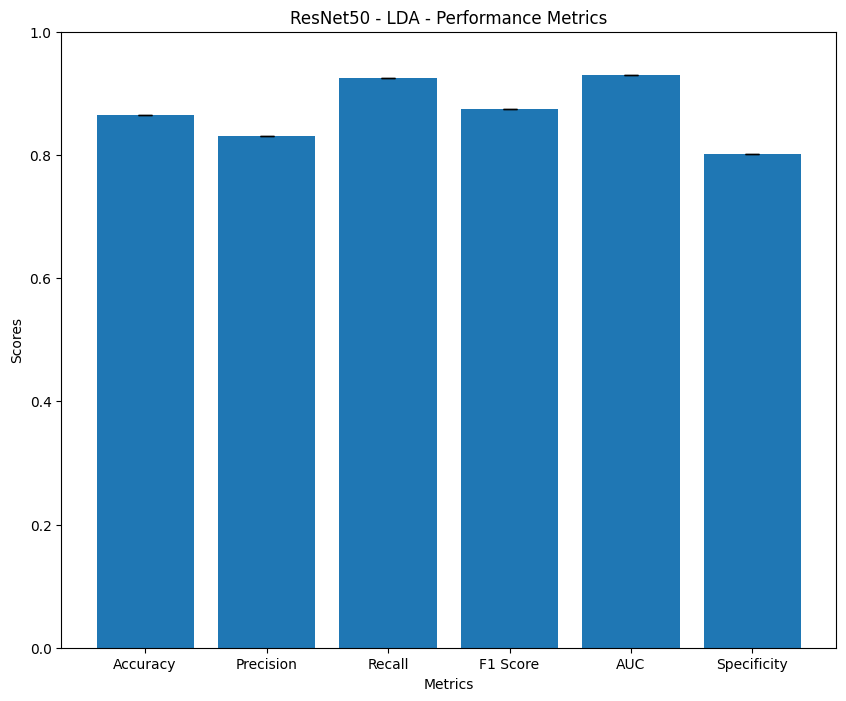

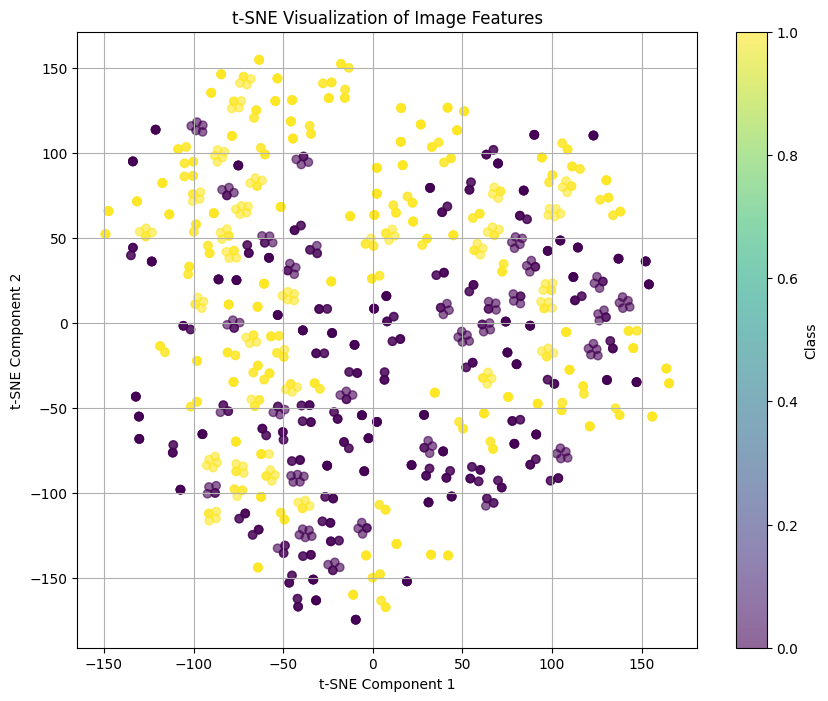

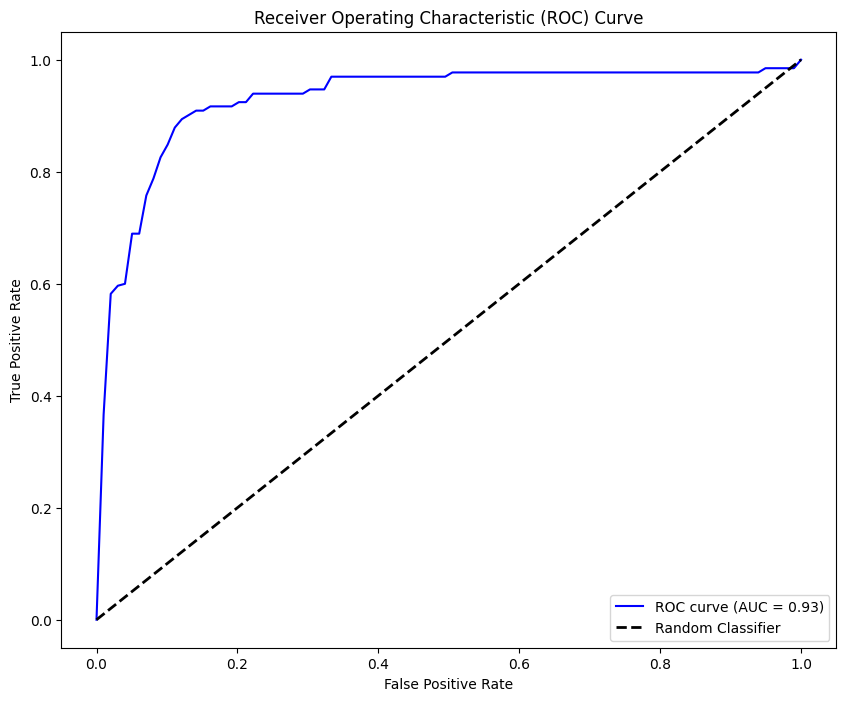

In [ ]:
model = CustomResNet50().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_lda(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet50 - LDA - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.9850
Test Accuracy: 0.8643
Precision: 0.8440
Recall: 0.9015
F1 Score: 0.8718
AUC: 0.9462
Specificity: 0.8254
Confusion Matrix:
[[104  22]
 [ 13 119]]

Run 2:
Train Accuracy: 0.9850
Test Accuracy: 0.8643
Precision: 0.8440
Recall: 0.9015
F1 Score: 0.8718
AUC: 0.9462
Specificity: 0.8254
Confusion Matrix:
[[104  22]
 [ 13 119]]

Run 3:
Train Accuracy: 0.9850
Test Accuracy: 0.8643
Precision: 0.8440
Recall: 0.9015
F1 Score: 0.8718
AUC: 0.9462
Specificity: 0.8254
Confusion Matrix:
[[104  22]
 [ 13 119]]

Run 4:
Train Accuracy: 0.9850
Test Accuracy: 0.8643
Precision: 0.8440
Recall: 0.9015
F1 Score: 0.8718
AUC: 0.9462
Specificity: 0.8254
Confusion Matrix:
[[104  22]
 [ 13 119]]

Run 5:
Train Accuracy: 0.9850
Test Accuracy: 0.8643
Precision: 0.8440
Recall: 0.9015
F1 Score: 0.8718
AUC: 0.9462
Specificity: 0.8254
Confusion Matrix:
[[104  22]
 [ 13 119]]


Average Performance Metrics:
Test Accuracy: 0.8643
Precision: 0.8440
Recall: 0.9015
F1-Score: 0.8718
Specificity: 0.825

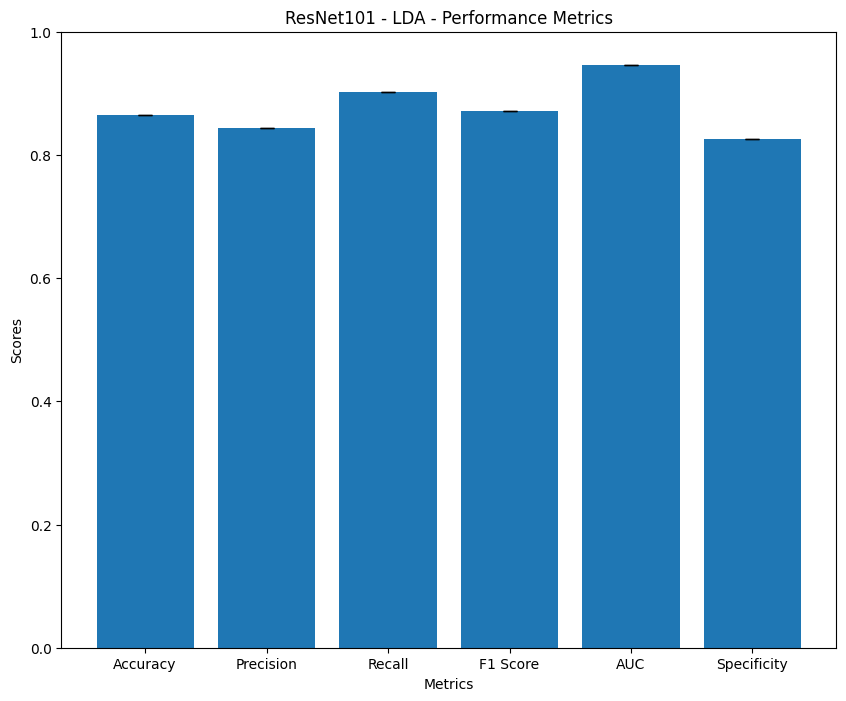

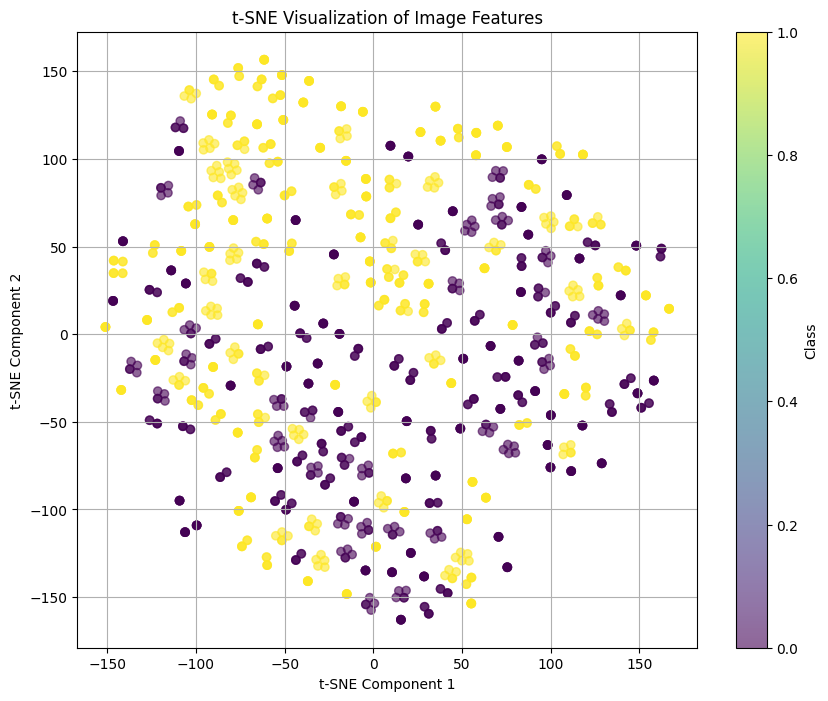

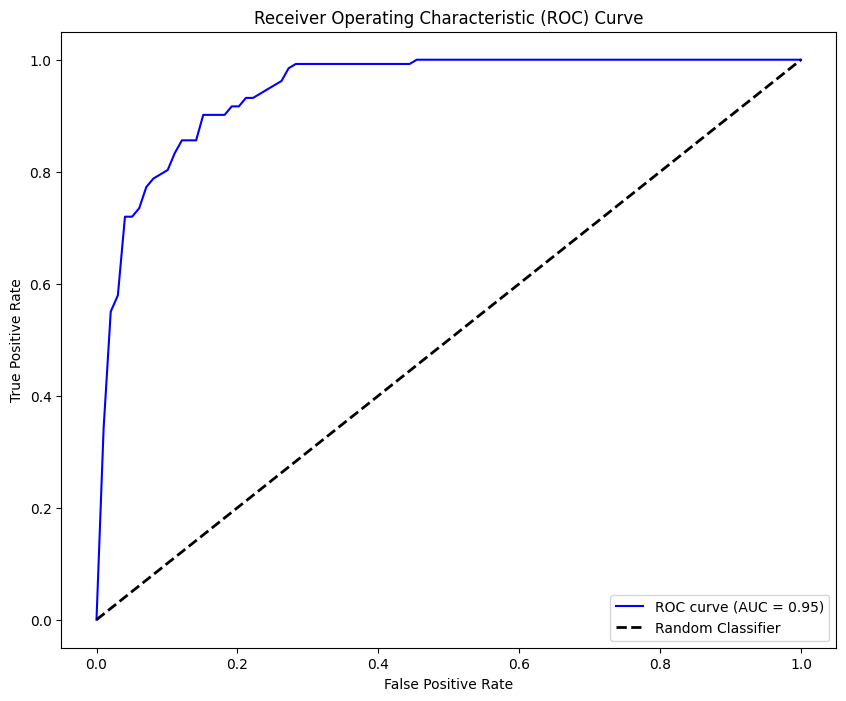

In [ ]:
model = CustomResNet101().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_lda(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet101 - LDA - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# LDA - VGG

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.9734
Test Accuracy: 0.8992
Precision: 0.8681
Recall: 0.9470
F1 Score: 0.9058
AUC: 0.9487
Specificity: 0.8492
Confusion Matrix:
[[107  19]
 [  7 125]]

Run 2:
Train Accuracy: 0.9734
Test Accuracy: 0.8992
Precision: 0.8681
Recall: 0.9470
F1 Score: 0.9058
AUC: 0.9487
Specificity: 0.8492
Confusion Matrix:
[[107  19]
 [  7 125]]

Run 3:
Train Accuracy: 0.9734
Test Accuracy: 0.8992
Precision: 0.8681
Recall: 0.9470
F1 Score: 0.9058
AUC: 0.9487
Specificity: 0.8492
Confusion Matrix:
[[107  19]
 [  7 125]]

Run 4:
Train Accuracy: 0.9734
Test Accuracy: 0.8992
Precision: 0.8681
Recall: 0.9470
F1 Score: 0.9058
AUC: 0.9487
Specificity: 0.8492
Confusion Matrix:
[[107  19]
 [  7 125]]

Run 5:
Train Accuracy: 0.9734
Test Accuracy: 0.8992
Precision: 0.8681
Recall: 0.9470
F1 Score: 0.9058
AUC: 0.9487
Specificity: 0.8492
Confusion Matrix:
[[107  19]
 [  7 125]]


Average Performance Metrics:
Test Accuracy: 0.8992
Precision: 0.8681
Recall: 0.9470
F1-Score: 0.9058
Specificity: 0.849

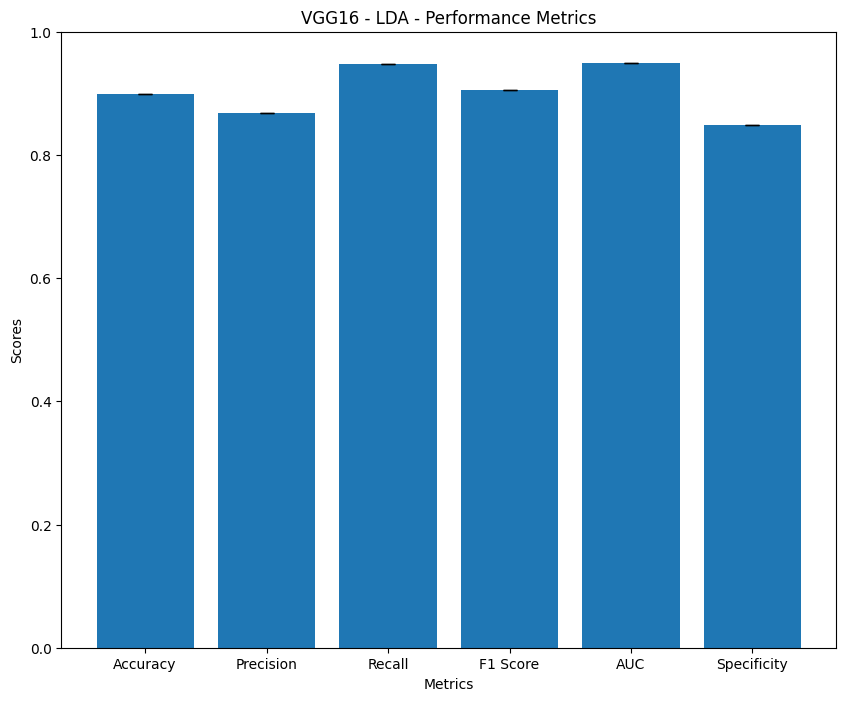

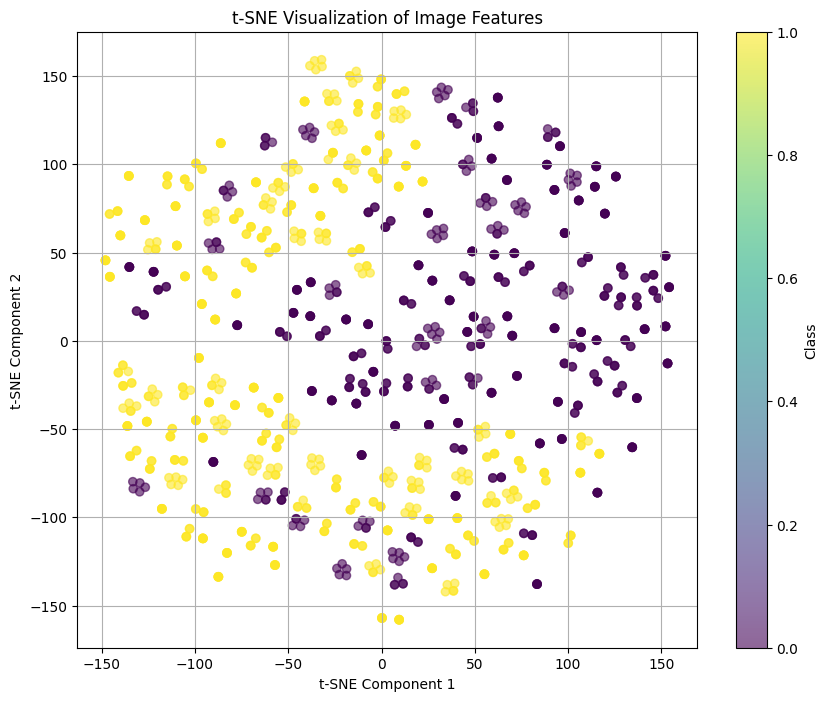

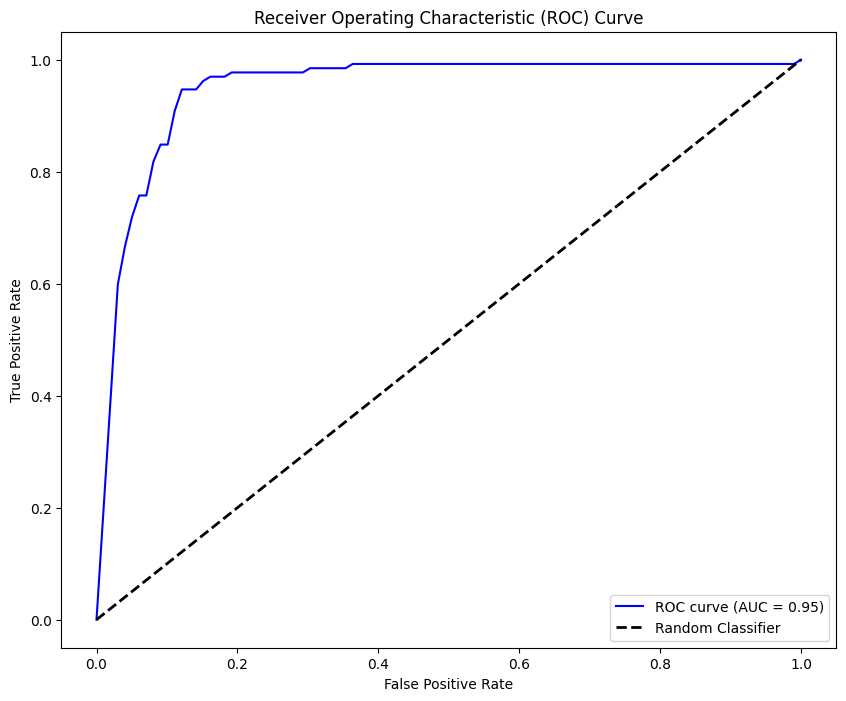

In [ ]:
model = CustomVGG16().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_lda(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('VGG16 - LDA - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.9917
Test Accuracy: 0.8333
Precision: 0.8156
Recall: 0.8712
F1 Score: 0.8425
AUC: 0.8623
Specificity: 0.7937
Confusion Matrix:
[[100  26]
 [ 17 115]]

Run 2:
Train Accuracy: 0.9917
Test Accuracy: 0.8333
Precision: 0.8156
Recall: 0.8712
F1 Score: 0.8425
AUC: 0.8623
Specificity: 0.7937
Confusion Matrix:
[[100  26]
 [ 17 115]]

Run 3:
Train Accuracy: 0.9917
Test Accuracy: 0.8333
Precision: 0.8156
Recall: 0.8712
F1 Score: 0.8425
AUC: 0.8623
Specificity: 0.7937
Confusion Matrix:
[[100  26]
 [ 17 115]]

Run 4:
Train Accuracy: 0.9917
Test Accuracy: 0.8333
Precision: 0.8156
Recall: 0.8712
F1 Score: 0.8425
AUC: 0.8623
Specificity: 0.7937
Confusion Matrix:
[[100  26]
 [ 17 115]]

Run 5:
Train Accuracy: 0.9917
Test Accuracy: 0.8333
Precision: 0.8156
Recall: 0.8712
F1 Score: 0.8425
AUC: 0.8623
Specificity: 0.7937
Confusion Matrix:
[[100  26]
 [ 17 115]]


Average Performance Metrics:
Test Accuracy: 0.8333
Precision: 0.8156
Recall: 0.8712
F1-Score: 0.8425
Specificity: 0.793

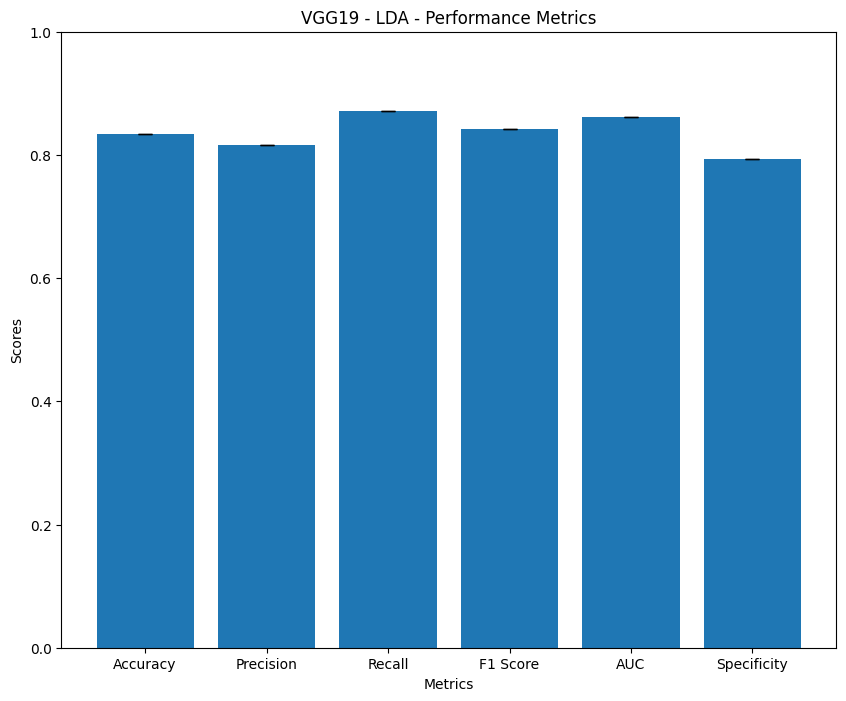

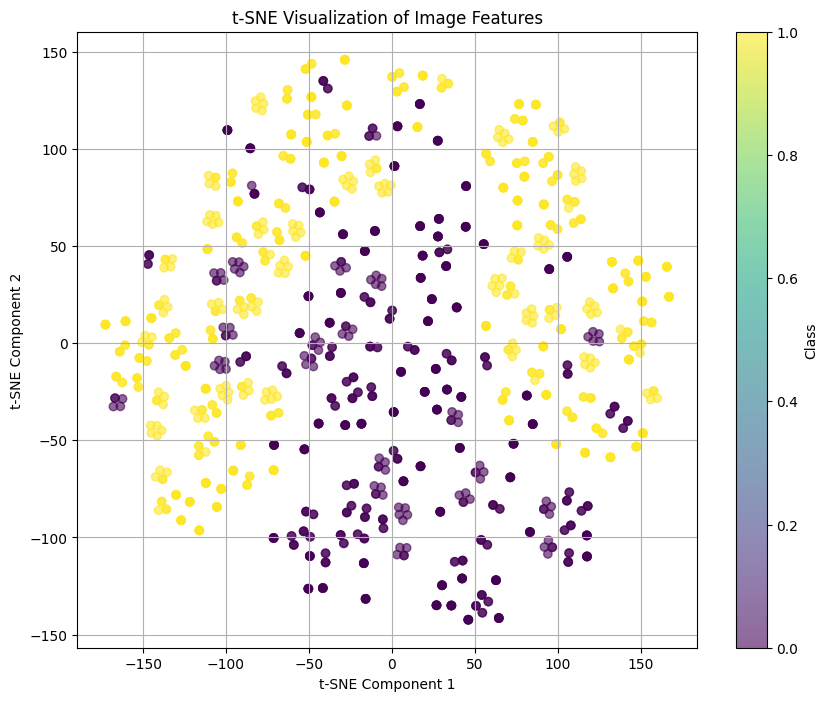

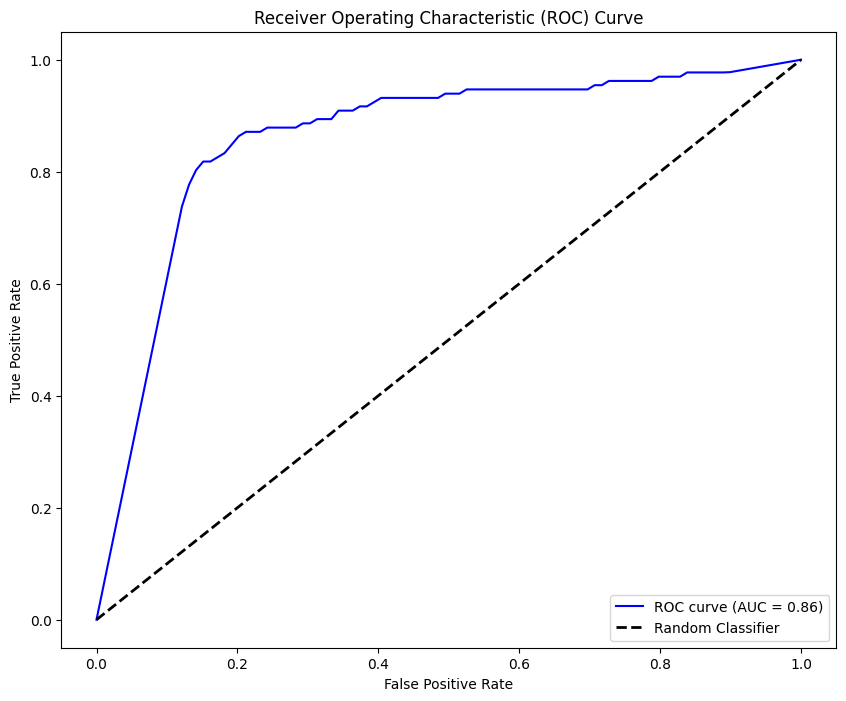

In [ ]:
model = CustomVGG19().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_lda(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('VGG19 - LDA - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


# LDA - DenseNet

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.9967
Test Accuracy: 0.8411
Precision: 0.8227
Recall: 0.8788
F1 Score: 0.8498
AUC: 0.9098
Specificity: 0.8016
Confusion Matrix:
[[101  25]
 [ 16 116]]

Run 2:
Train Accuracy: 0.9967
Test Accuracy: 0.8411
Precision: 0.8227
Recall: 0.8788
F1 Score: 0.8498
AUC: 0.9098
Specificity: 0.8016
Confusion Matrix:
[[101  25]
 [ 16 116]]

Run 3:
Train Accuracy: 0.9967
Test Accuracy: 0.8411
Precision: 0.8227
Recall: 0.8788
F1 Score: 0.8498
AUC: 0.9098
Specificity: 0.8016
Confusion Matrix:
[[101  25]
 [ 16 116]]

Run 4:
Train Accuracy: 0.9967
Test Accuracy: 0.8411
Precision: 0.8227
Recall: 0.8788
F1 Score: 0.8498
AUC: 0.9098
Specificity: 0.8016
Confusion Matrix:
[[101  25]
 [ 16 116]]

Run 5:
Train Accuracy: 0.9967
Test Accuracy: 0.8411
Precision: 0.8227
Recall: 0.8788
F1 Score: 0.8498
AUC: 0.9098
Specificity: 0.8016
Confusion Matrix:
[[101  25]
 [ 16 116]]


Average Performance Metrics:
Test Accuracy: 0.8411
Precision: 0.8227
Recall: 0.8788
F1-Score: 0.8498
Specificity: 0.801

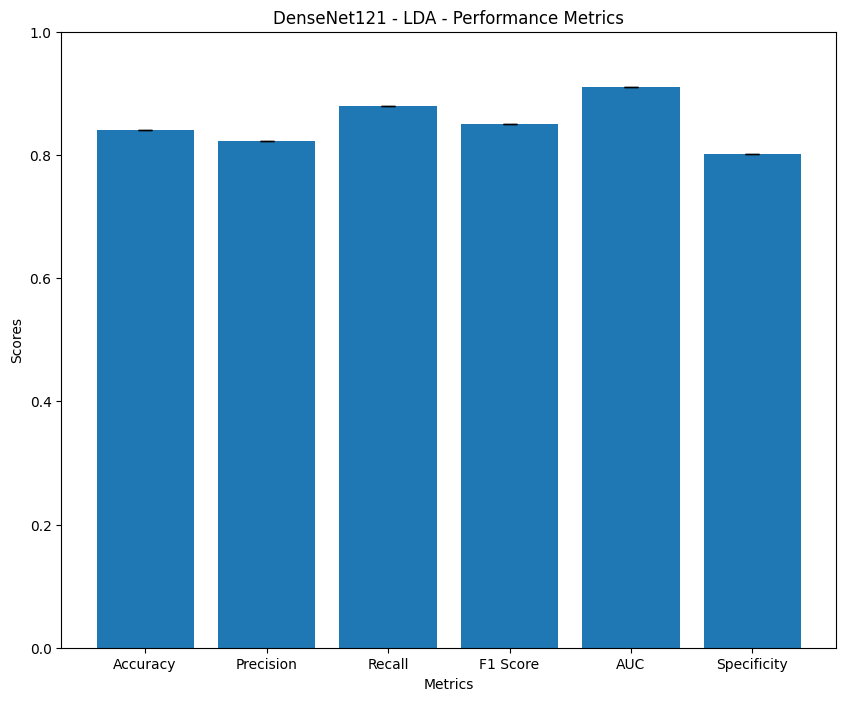

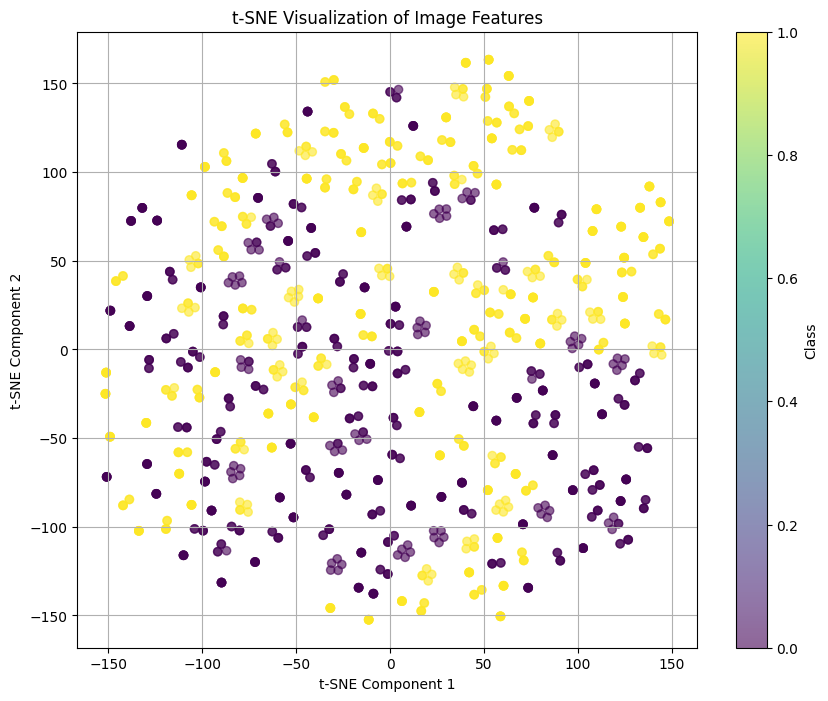

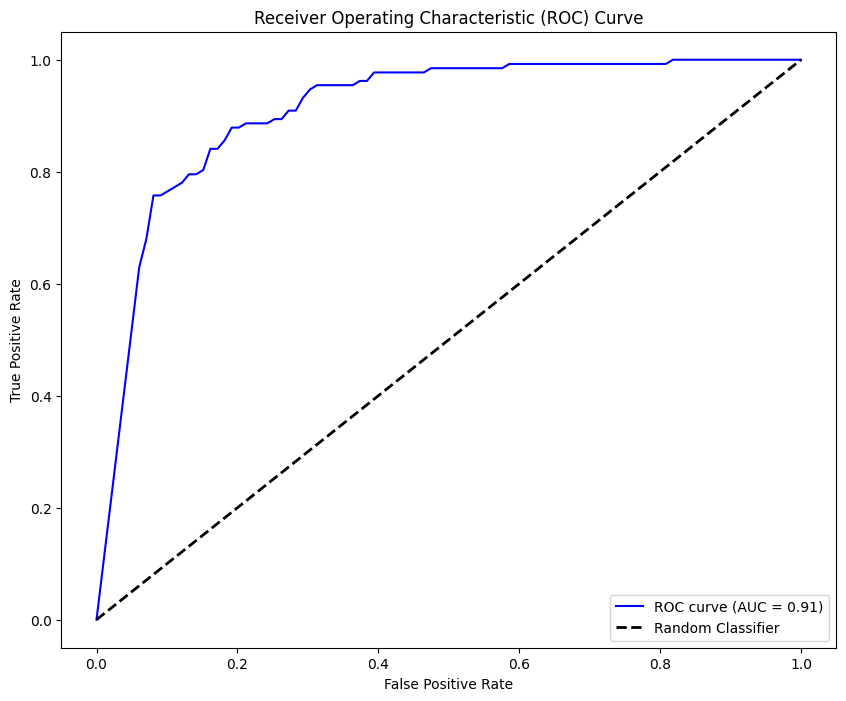

In [ ]:
model = CustomDenseNet121().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_lda(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('DenseNet121 - LDA - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.9900
Test Accuracy: 0.9264
Precision: 0.9248
Recall: 0.9318
F1 Score: 0.9283
AUC: 0.9778
Specificity: 0.9206
Confusion Matrix:
[[116  10]
 [  9 123]]

Run 2:
Train Accuracy: 0.9900
Test Accuracy: 0.9264
Precision: 0.9248
Recall: 0.9318
F1 Score: 0.9283
AUC: 0.9778
Specificity: 0.9206
Confusion Matrix:
[[116  10]
 [  9 123]]

Run 3:
Train Accuracy: 0.9900
Test Accuracy: 0.9264
Precision: 0.9248
Recall: 0.9318
F1 Score: 0.9283
AUC: 0.9778
Specificity: 0.9206
Confusion Matrix:
[[116  10]
 [  9 123]]

Run 4:
Train Accuracy: 0.9900
Test Accuracy: 0.9264
Precision: 0.9248
Recall: 0.9318
F1 Score: 0.9283
AUC: 0.9778
Specificity: 0.9206
Confusion Matrix:
[[116  10]
 [  9 123]]

Run 5:
Train Accuracy: 0.9900
Test Accuracy: 0.9264
Precision: 0.9248
Recall: 0.9318
F1 Score: 0.9283
AUC: 0.9778
Specificity: 0.9206
Confusion Matrix:
[[116  10]
 [  9 123]]


Average Performance Metrics:
Test Accuracy: 0.9264
Precision: 0.9248
Recall: 0.9318
F1-Score: 0.9283
Specificity: 0.920

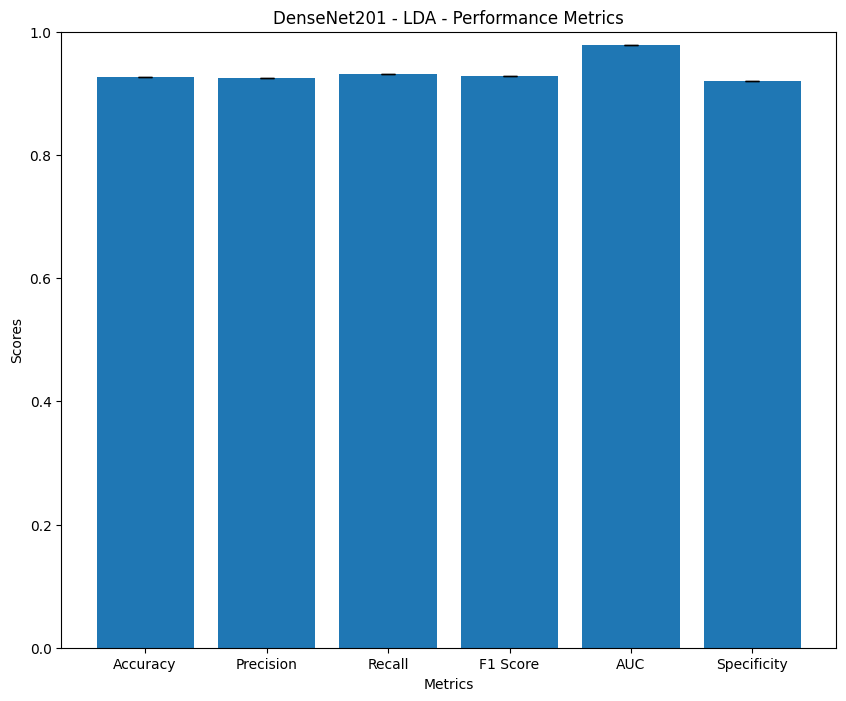

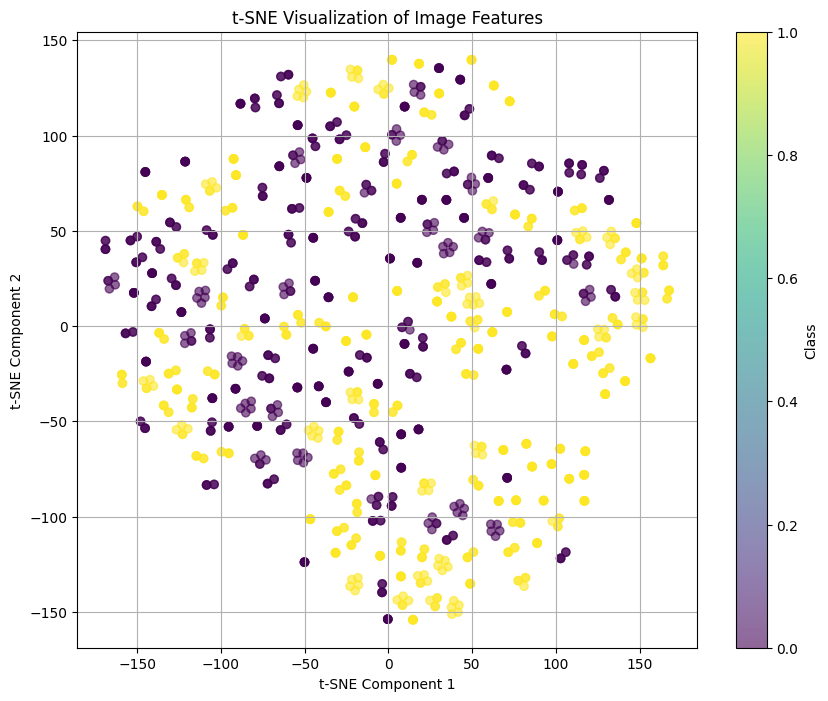

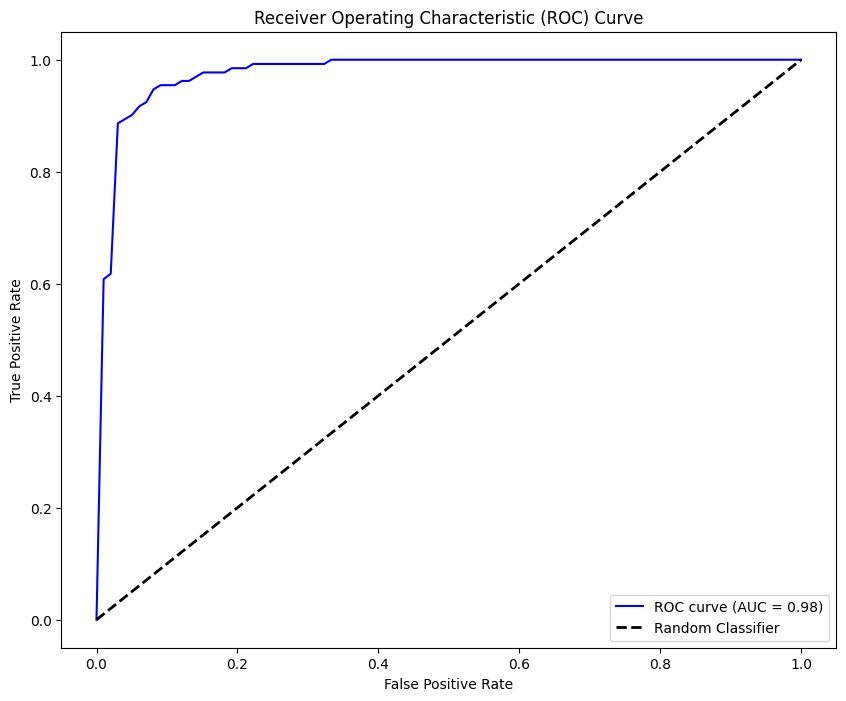

In [ ]:
model = CustomDenseNet201().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_lda(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('DenseNet201 - LDA - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


# LOGISTIC REGRESSION

# LR - ResNet

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.9618
Test Accuracy: 0.9264
Precision: 0.8844
Recall: 0.9848
F1 Score: 0.9319
AUC: 0.9601
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [  2 130]]

Run 2:
Train Accuracy: 0.9618
Test Accuracy: 0.9264
Precision: 0.8844
Recall: 0.9848
F1 Score: 0.9319
AUC: 0.9601
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [  2 130]]

Run 3:
Train Accuracy: 0.9618
Test Accuracy: 0.9264
Precision: 0.8844
Recall: 0.9848
F1 Score: 0.9319
AUC: 0.9601
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [  2 130]]

Run 4:
Train Accuracy: 0.9618
Test Accuracy: 0.9264
Precision: 0.8844
Recall: 0.9848
F1 Score: 0.9319
AUC: 0.9601
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [  2 130]]

Run 5:
Train Accuracy: 0.9618
Test Accuracy: 0.9264
Precision: 0.8844
Recall: 0.9848
F1 Score: 0.9319
AUC: 0.9601
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [  2 130]]


Average Performance Metrics:
Test Accuracy: 0.9264
Precision: 0.8844
Recall: 0.9848
F1-Score: 0.9319
Specificity: 0.865

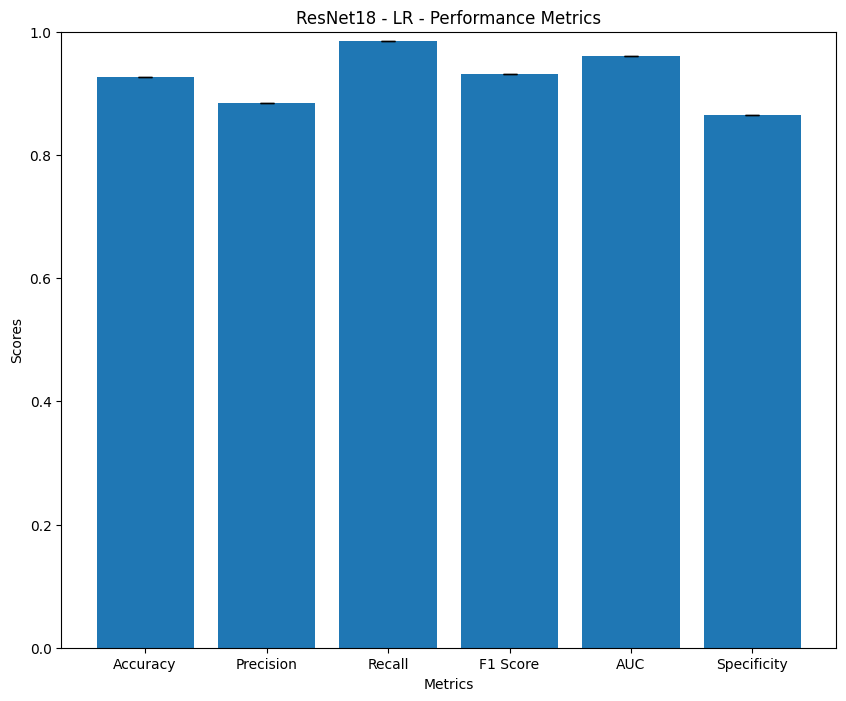

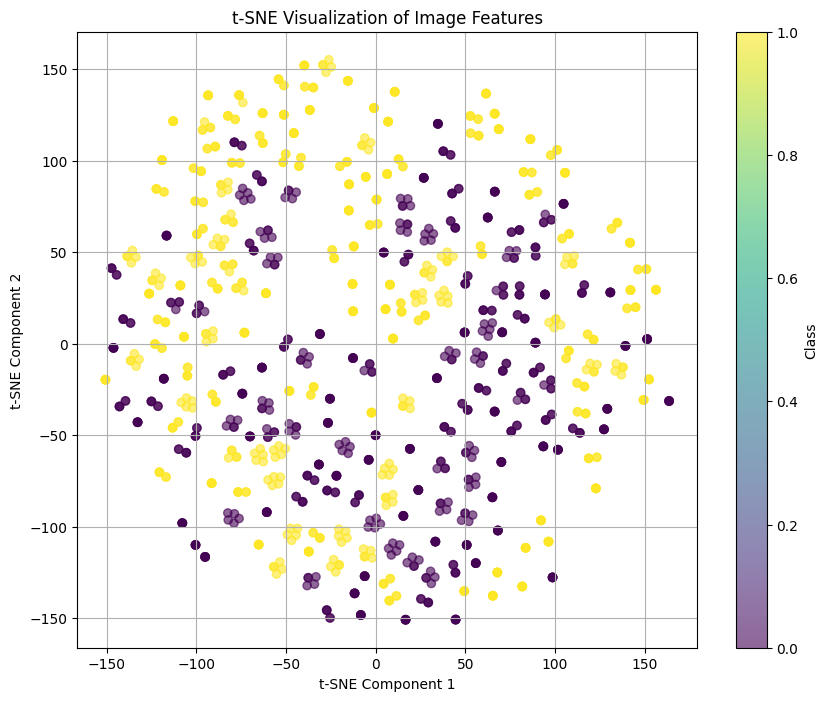

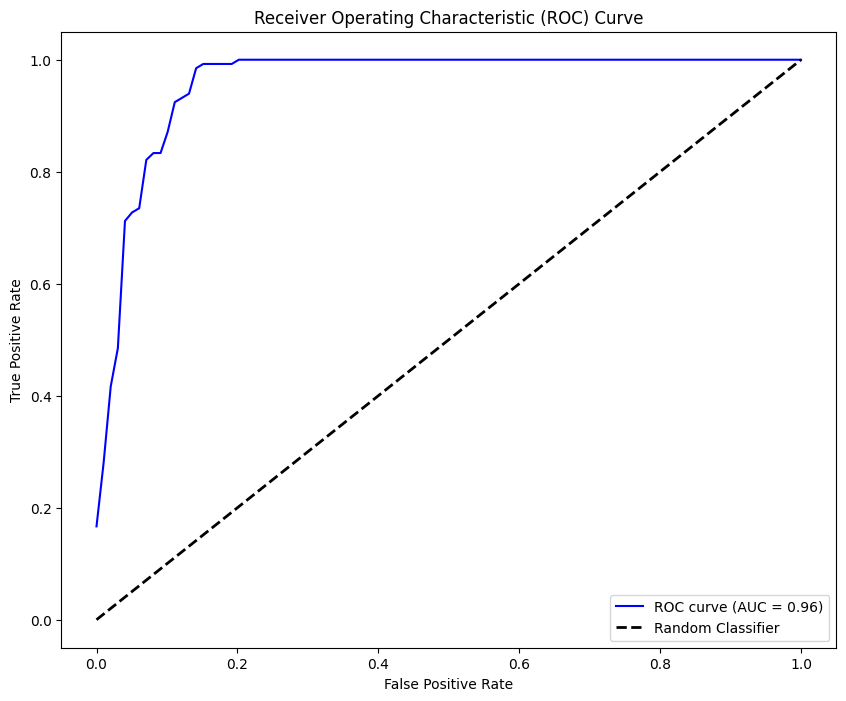

In [ ]:
model = CustomResNet18().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_logistic_regression(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet18 - LR - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Run 1:
Train Accuracy: 0.9718
Test Accuracy: 0.9070
Precision: 0.8699
Recall: 0.9621
F1 Score: 0.9137
AUC: 0.9589
Specificity: 0.8492
Confusion Matrix:
[[107  19]
 [  5 127]]

Run 2:
Train Accuracy: 0.9718
Test Accuracy: 0.9070
Precision: 0.8699
Recall: 0.9621
F1 Score: 0.9137
AUC: 0.9591
Specificity: 0.8492
Confusion Matrix:
[[107  19]
 [  5 127]]

Run 3:
Train Accuracy: 0.9718
Test Accuracy: 0.9070
Precision: 0.8699
Recall: 0.9621
F1 Score: 0.9137
AUC: 0.9591
Specificity: 0.8492
Confusion Matrix:
[[107  19]
 [  5 127]]

Run 4:
Train Accuracy: 0.9718
Test Accuracy: 0.9070
Precision: 0.8699
Recall: 0.9621
F1 Score: 0.9137
AUC: 0.9589
Specificity: 0.8492
Confusion Matrix:
[[107  19]
 [  5 127]]

Run 5:
Train Accuracy: 0.9718
Test Accuracy: 0.9070
Precision: 0.8699
Recall: 0.9621
F1 Score: 0.9137
AUC: 0.9589
Specificity: 0.8492
Confusion Matrix:
[[107  19]
 [  5 127]]


Average Performance Metrics:
Test Accuracy: 0.9070
Precision: 0.8699
Recall: 0.9621
F1-Score: 0.9137
Specificity: 0.849

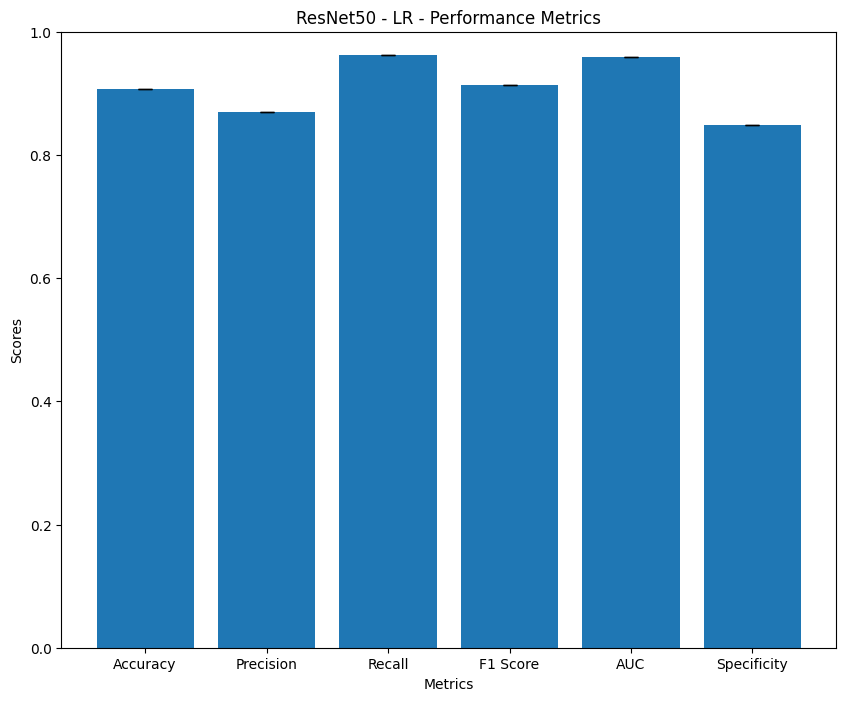

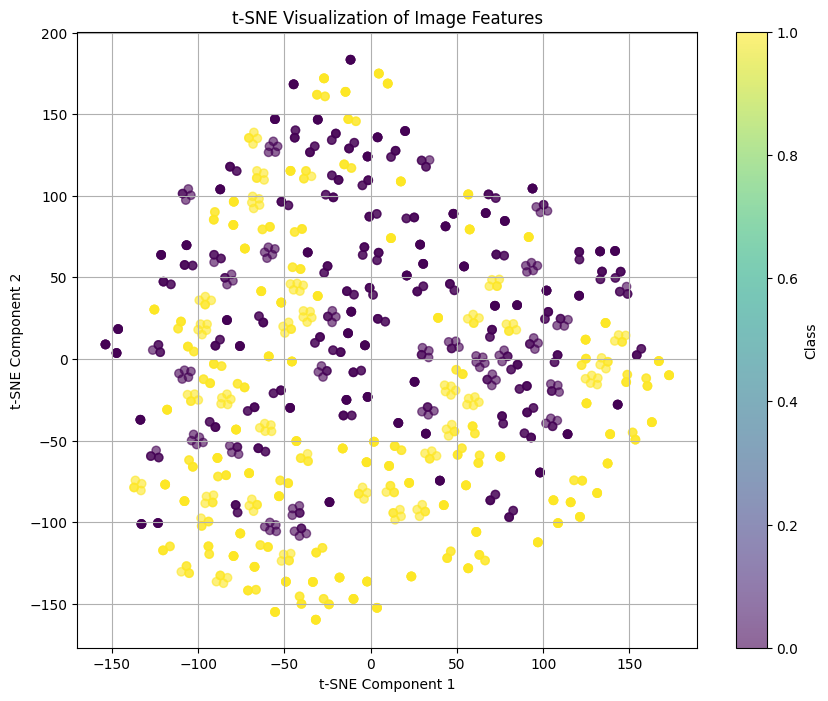

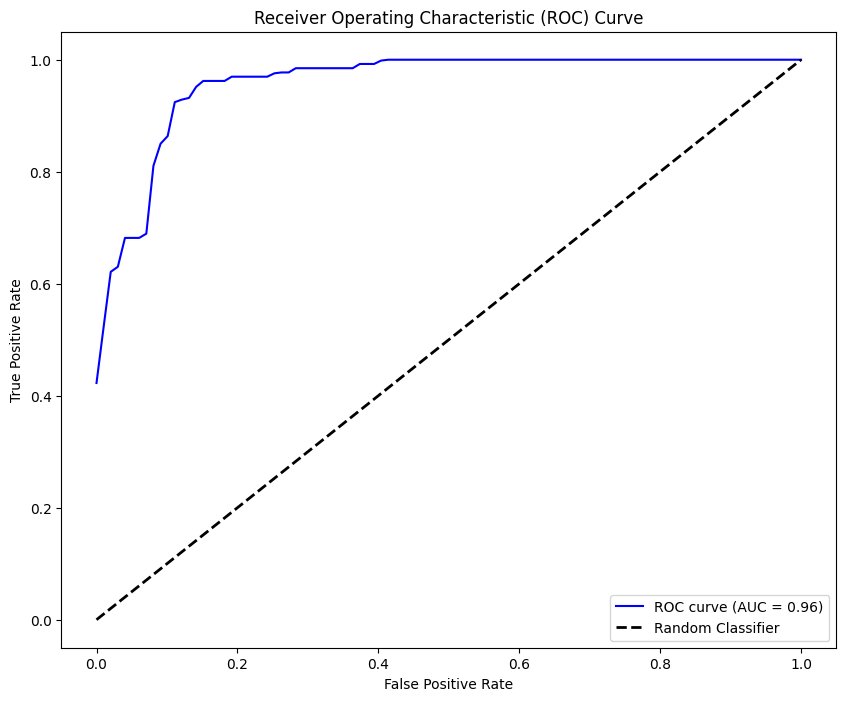

In [ ]:
model = CustomResNet50().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_logistic_regression(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet50 - LR - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:01<00:00, 140MB/s]


Run 1:
Train Accuracy: 0.9468
Test Accuracy: 0.8876
Precision: 0.8552
Recall: 0.9394
F1 Score: 0.8953
AUC: 0.9586
Specificity: 0.8333
Confusion Matrix:
[[105  21]
 [  8 124]]

Run 2:
Train Accuracy: 0.9468
Test Accuracy: 0.8876
Precision: 0.8552
Recall: 0.9394
F1 Score: 0.8953
AUC: 0.9587
Specificity: 0.8333
Confusion Matrix:
[[105  21]
 [  8 124]]

Run 3:
Train Accuracy: 0.9468
Test Accuracy: 0.8876
Precision: 0.8552
Recall: 0.9394
F1 Score: 0.8953
AUC: 0.9587
Specificity: 0.8333
Confusion Matrix:
[[105  21]
 [  8 124]]

Run 4:
Train Accuracy: 0.9468
Test Accuracy: 0.8876
Precision: 0.8552
Recall: 0.9394
F1 Score: 0.8953
AUC: 0.9587
Specificity: 0.8333
Confusion Matrix:
[[105  21]
 [  8 124]]

Run 5:
Train Accuracy: 0.9468
Test Accuracy: 0.8876
Precision: 0.8552
Recall: 0.9394
F1 Score: 0.8953
AUC: 0.9587
Specificity: 0.8333
Confusion Matrix:
[[105  21]
 [  8 124]]


Average Performance Metrics:
Test Accuracy: 0.8876
Precision: 0.8552
Recall: 0.9394
F1-Score: 0.8953
Specificity: 0.833

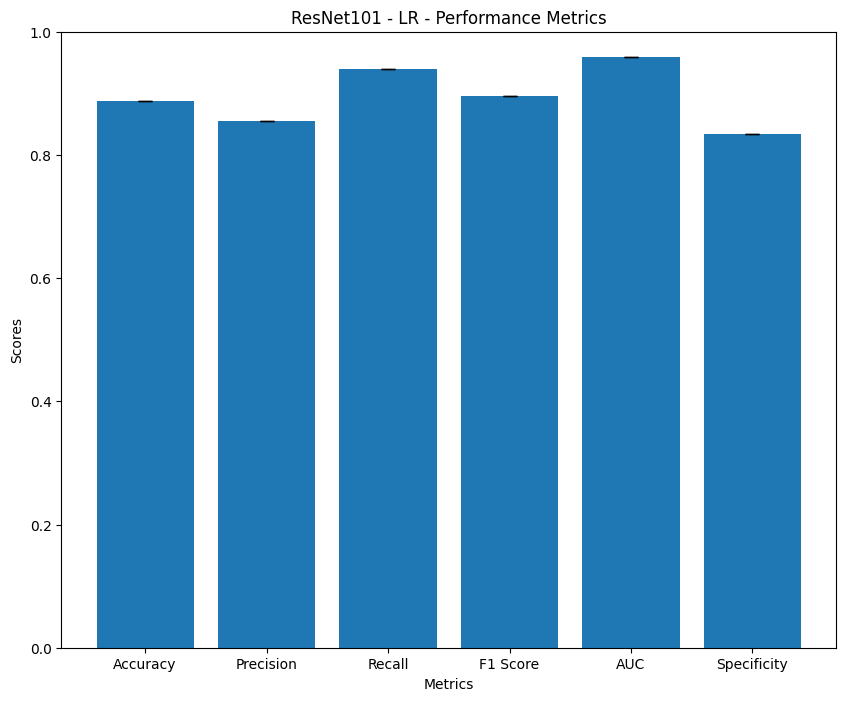

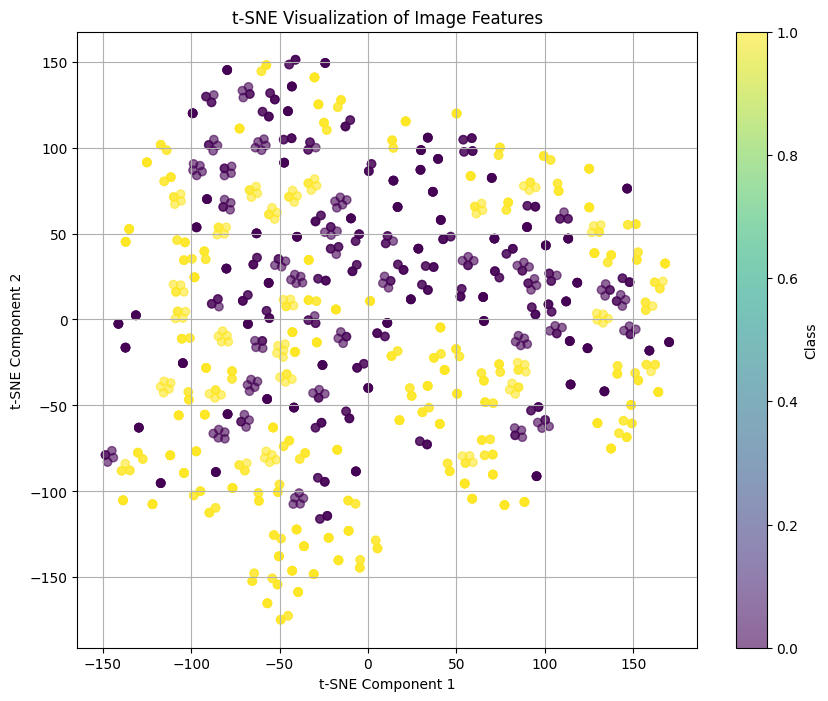

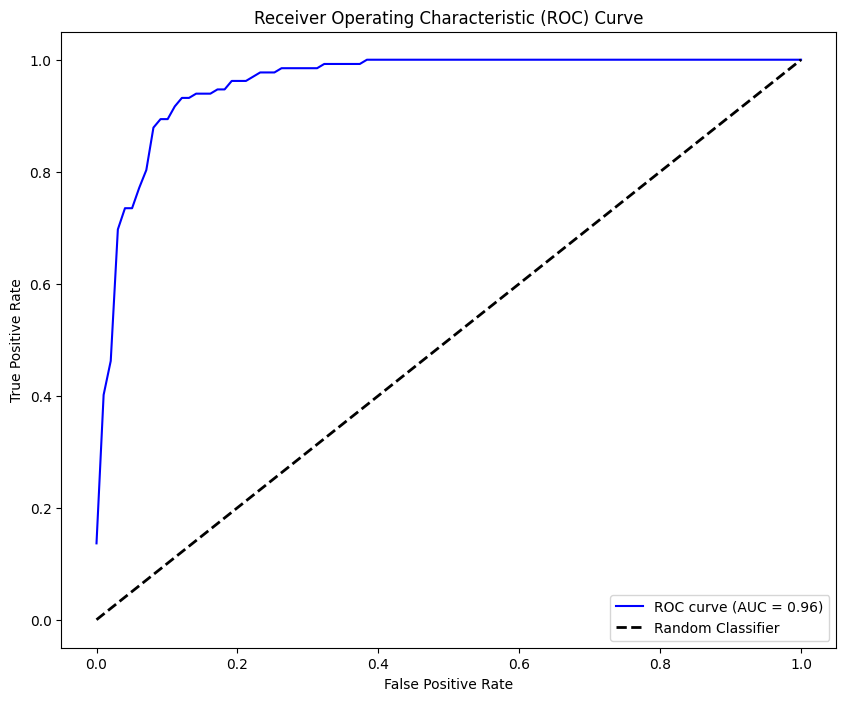

In [54]:
model = CustomResNet101().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_logistic_regression(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('ResNet101 - LR - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# LR - VGG

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:06<00:00, 79.3MB/s]


Run 1:
Train Accuracy: 0.9967
Test Accuracy: 0.9225
Precision: 0.8836
Recall: 0.9773
F1 Score: 0.9281
AUC: 0.9756
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [  3 129]]

Run 2:
Train Accuracy: 0.9967
Test Accuracy: 0.9225
Precision: 0.8836
Recall: 0.9773
F1 Score: 0.9281
AUC: 0.9756
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [  3 129]]

Run 3:
Train Accuracy: 0.9967
Test Accuracy: 0.9225
Precision: 0.8836
Recall: 0.9773
F1 Score: 0.9281
AUC: 0.9756
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [  3 129]]

Run 4:
Train Accuracy: 0.9967
Test Accuracy: 0.9225
Precision: 0.8836
Recall: 0.9773
F1 Score: 0.9281
AUC: 0.9756
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [  3 129]]

Run 5:
Train Accuracy: 0.9967
Test Accuracy: 0.9225
Precision: 0.8836
Recall: 0.9773
F1 Score: 0.9281
AUC: 0.9756
Specificity: 0.8651
Confusion Matrix:
[[109  17]
 [  3 129]]


Average Performance Metrics:
Test Accuracy: 0.9225
Precision: 0.8836
Recall: 0.9773
F1-Score: 0.9281
Specificity: 0.865

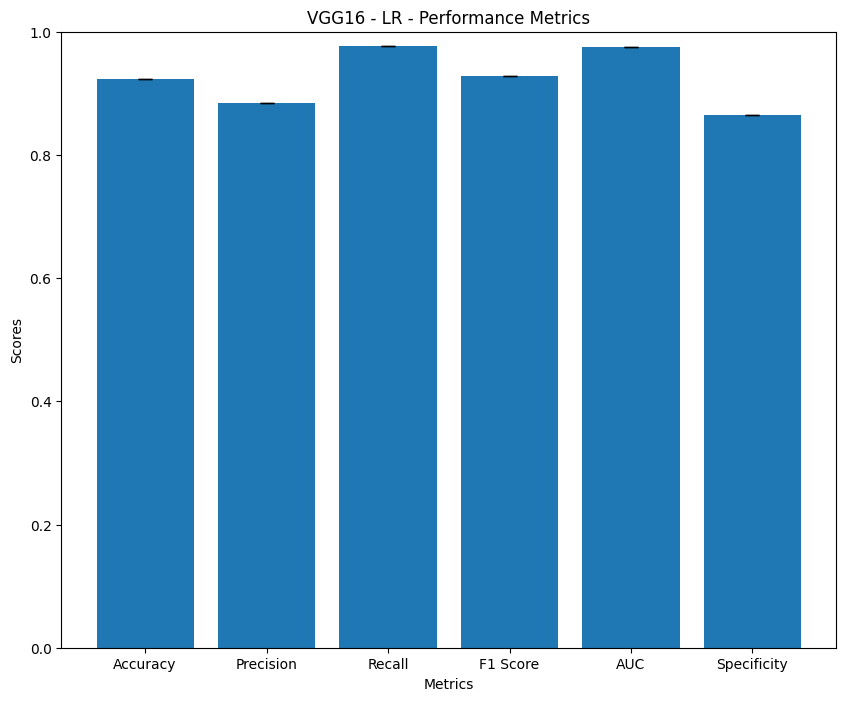

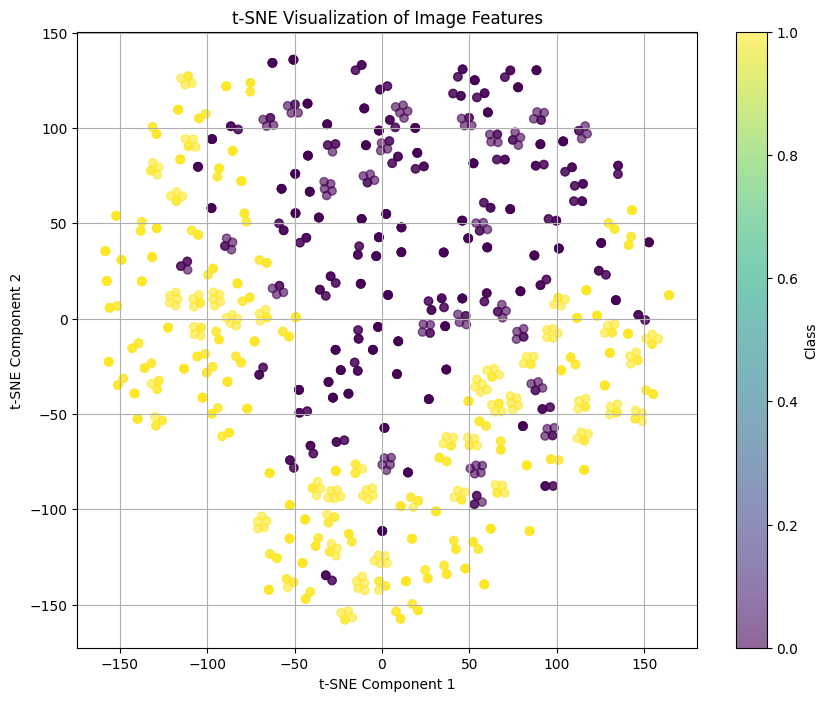

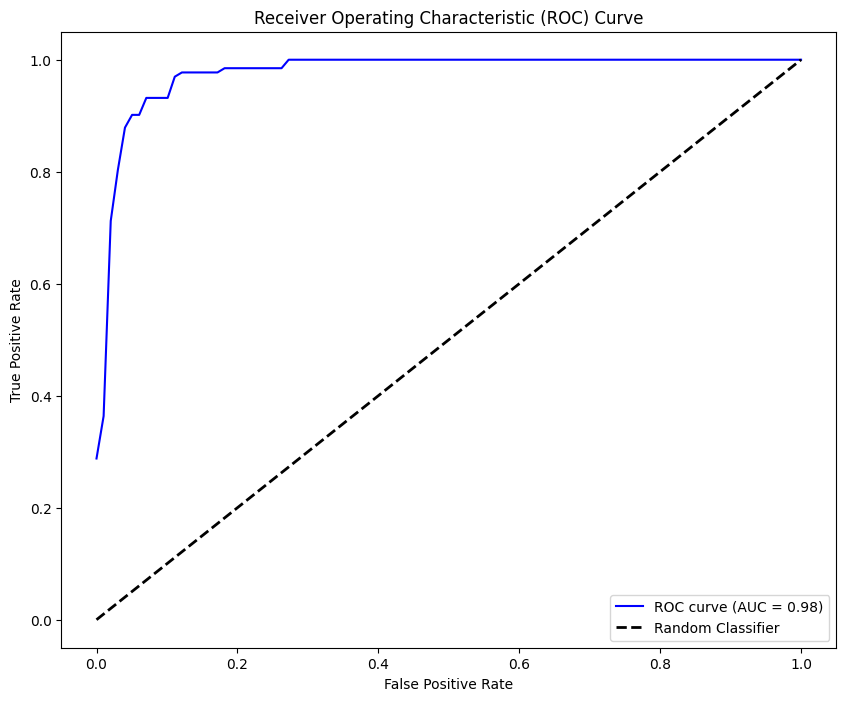

In [55]:
model = CustomVGG16().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_logistic_regression(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('VGG16 - LR - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:07<00:00, 74.7MB/s]


Run 1:
Train Accuracy: 0.9967
Test Accuracy: 0.9031
Precision: 0.8741
Recall: 0.9470
F1 Score: 0.9091
AUC: 0.9732
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [  7 125]]

Run 2:
Train Accuracy: 0.9967
Test Accuracy: 0.9031
Precision: 0.8741
Recall: 0.9470
F1 Score: 0.9091
AUC: 0.9732
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [  7 125]]

Run 3:
Train Accuracy: 0.9967
Test Accuracy: 0.9031
Precision: 0.8741
Recall: 0.9470
F1 Score: 0.9091
AUC: 0.9732
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [  7 125]]

Run 4:
Train Accuracy: 0.9967
Test Accuracy: 0.9031
Precision: 0.8741
Recall: 0.9470
F1 Score: 0.9091
AUC: 0.9732
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [  7 125]]

Run 5:
Train Accuracy: 0.9967
Test Accuracy: 0.9031
Precision: 0.8741
Recall: 0.9470
F1 Score: 0.9091
AUC: 0.9732
Specificity: 0.8571
Confusion Matrix:
[[108  18]
 [  7 125]]


Average Performance Metrics:
Test Accuracy: 0.9031
Precision: 0.8741
Recall: 0.9470
F1-Score: 0.9091
Specificity: 0.857

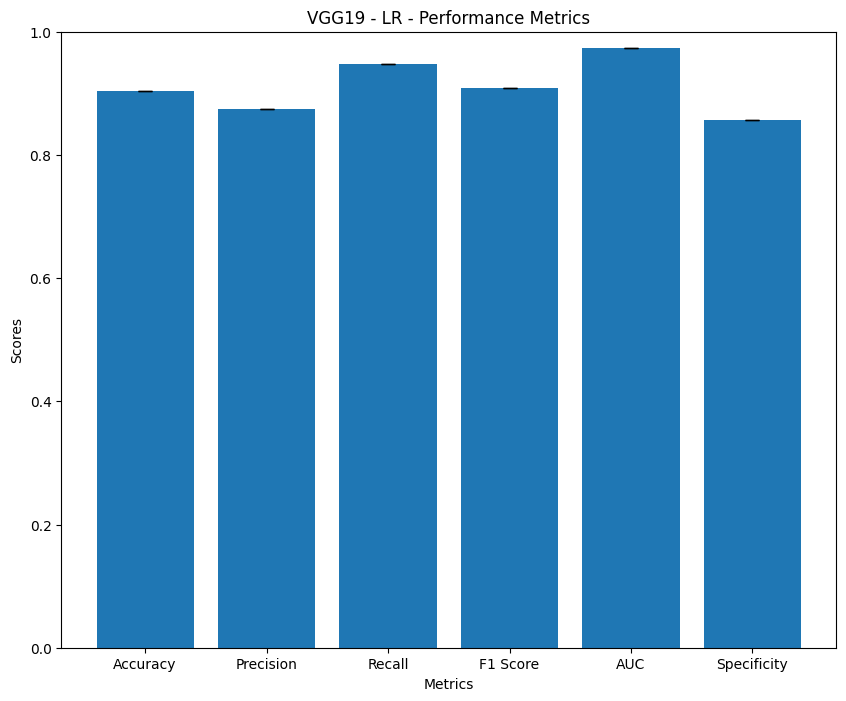

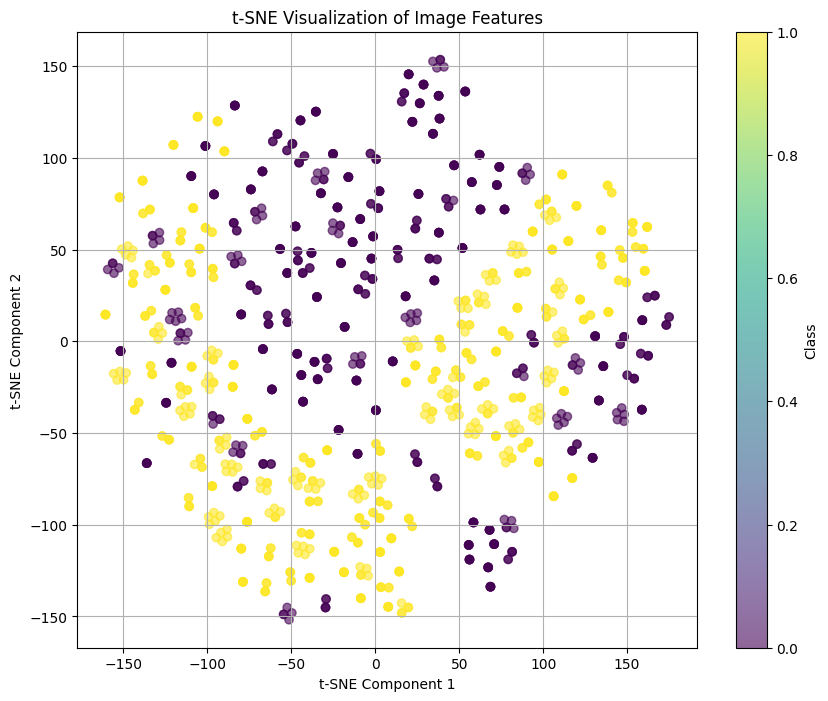

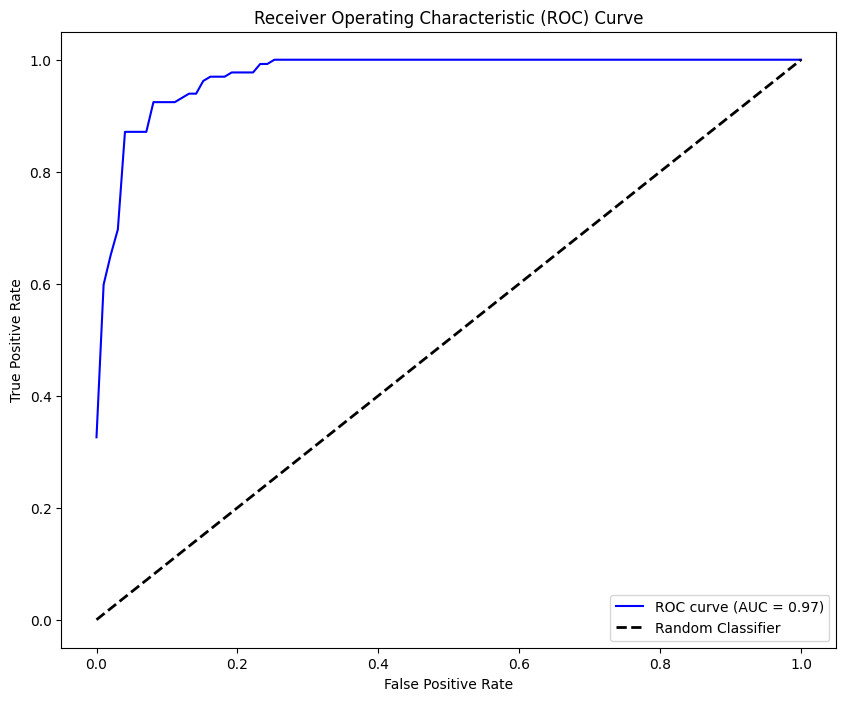

In [56]:
model = CustomVGG19().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_logistic_regression(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('VGG19 - LR - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


# LR - DenseNet

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 58.1MB/s]


Run 1:
Train Accuracy: 0.9784
Test Accuracy: 0.9070
Precision: 0.9154
Recall: 0.9015
F1 Score: 0.9084
AUC: 0.9701
Specificity: 0.9127
Confusion Matrix:
[[115  11]
 [ 13 119]]

Run 2:
Train Accuracy: 0.9784
Test Accuracy: 0.9070
Precision: 0.9154
Recall: 0.9015
F1 Score: 0.9084
AUC: 0.9701
Specificity: 0.9127
Confusion Matrix:
[[115  11]
 [ 13 119]]

Run 3:
Train Accuracy: 0.9784
Test Accuracy: 0.9070
Precision: 0.9154
Recall: 0.9015
F1 Score: 0.9084
AUC: 0.9701
Specificity: 0.9127
Confusion Matrix:
[[115  11]
 [ 13 119]]

Run 4:
Train Accuracy: 0.9784
Test Accuracy: 0.9070
Precision: 0.9154
Recall: 0.9015
F1 Score: 0.9084
AUC: 0.9701
Specificity: 0.9127
Confusion Matrix:
[[115  11]
 [ 13 119]]

Run 5:
Train Accuracy: 0.9784
Test Accuracy: 0.9070
Precision: 0.9154
Recall: 0.9015
F1 Score: 0.9084
AUC: 0.9701
Specificity: 0.9127
Confusion Matrix:
[[115  11]
 [ 13 119]]


Average Performance Metrics:
Test Accuracy: 0.9070
Precision: 0.9154
Recall: 0.9015
F1-Score: 0.9084
Specificity: 0.912

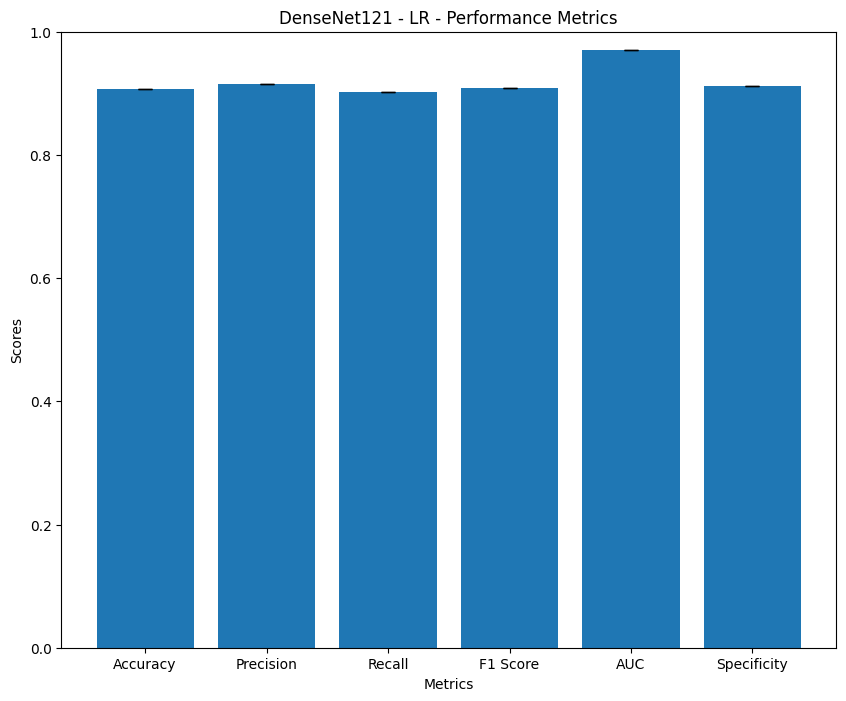

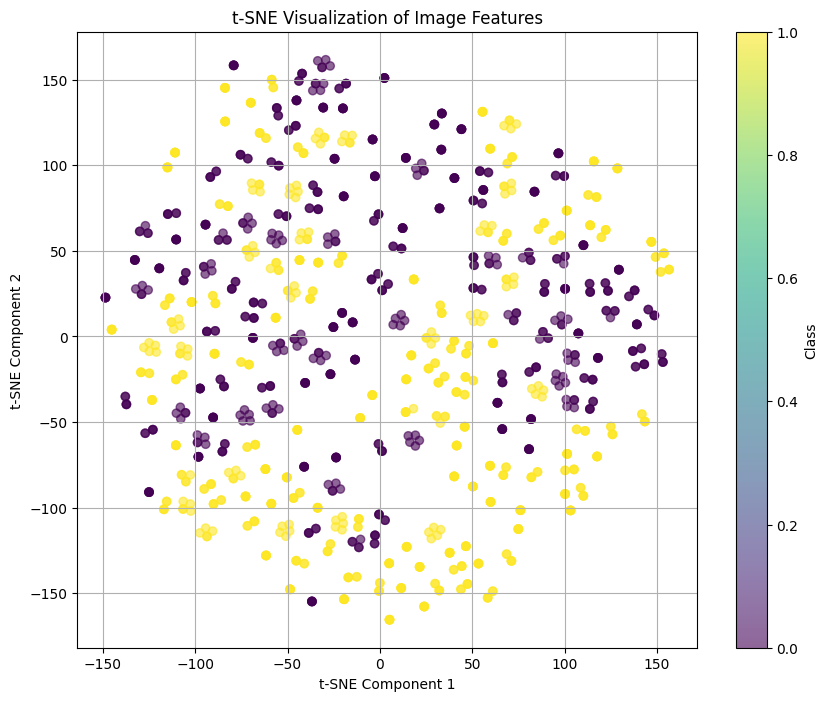

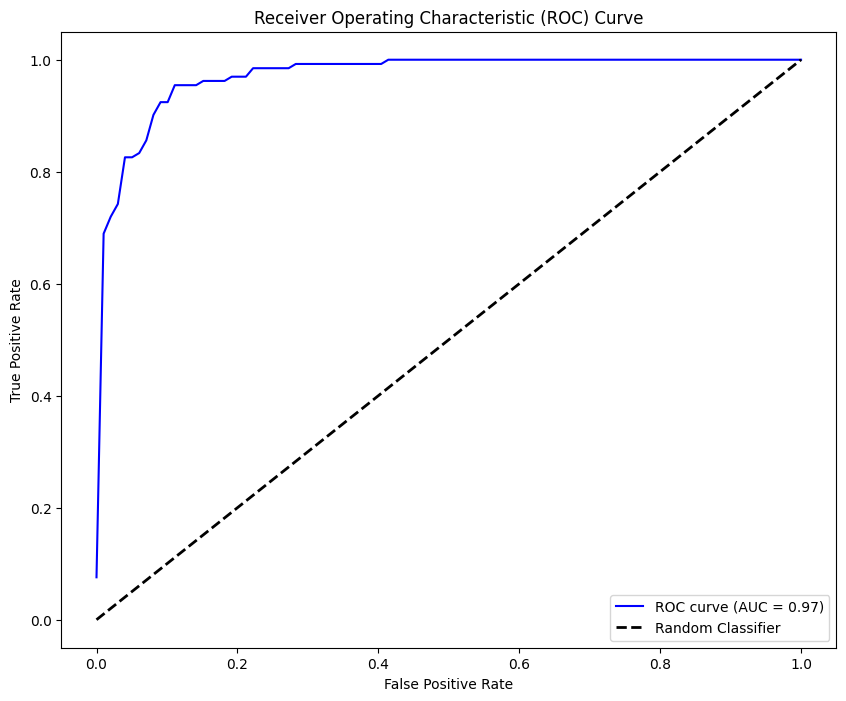

In [57]:
model = CustomDenseNet121().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_logistic_regression(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('DenseNet121 - LR - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet201-c1103571.pth" to /root/.cache/torch/hub/checkpoints/densenet201-c1103571.pth
100%|██████████| 77.4M/77.4M [00:00<00:00, 186MB/s]


Run 1:
Train Accuracy: 0.9850
Test Accuracy: 0.9109
Precision: 0.8865
Recall: 0.9470
F1 Score: 0.9158
AUC: 0.9778
Specificity: 0.8730
Confusion Matrix:
[[110  16]
 [  7 125]]

Run 2:
Train Accuracy: 0.9850
Test Accuracy: 0.9109
Precision: 0.8865
Recall: 0.9470
F1 Score: 0.9158
AUC: 0.9777
Specificity: 0.8730
Confusion Matrix:
[[110  16]
 [  7 125]]

Run 3:
Train Accuracy: 0.9850
Test Accuracy: 0.9109
Precision: 0.8865
Recall: 0.9470
F1 Score: 0.9158
AUC: 0.9777
Specificity: 0.8730
Confusion Matrix:
[[110  16]
 [  7 125]]

Run 4:
Train Accuracy: 0.9850
Test Accuracy: 0.9109
Precision: 0.8865
Recall: 0.9470
F1 Score: 0.9158
AUC: 0.9778
Specificity: 0.8730
Confusion Matrix:
[[110  16]
 [  7 125]]

Run 5:
Train Accuracy: 0.9850
Test Accuracy: 0.9109
Precision: 0.8865
Recall: 0.9470
F1 Score: 0.9158
AUC: 0.9778
Specificity: 0.8730
Confusion Matrix:
[[110  16]
 [  7 125]]


Average Performance Metrics:
Test Accuracy: 0.9109
Precision: 0.8865
Recall: 0.9470
F1-Score: 0.9158
Specificity: 0.873

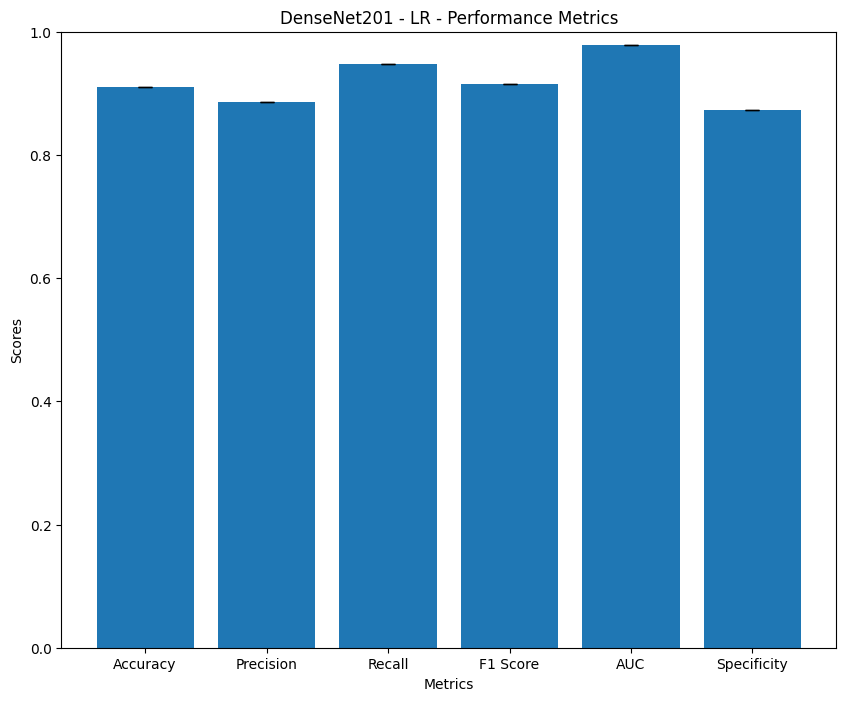

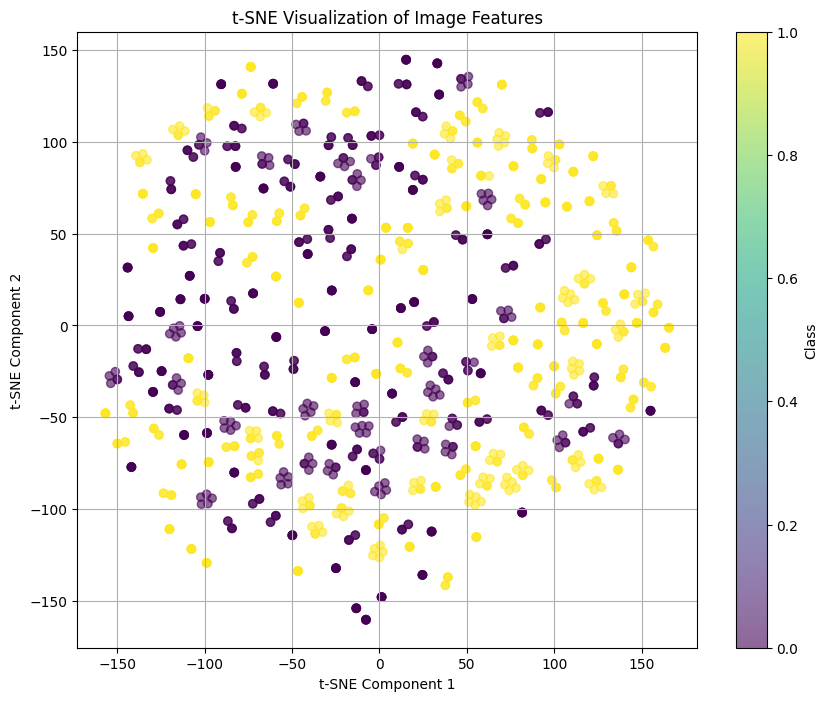

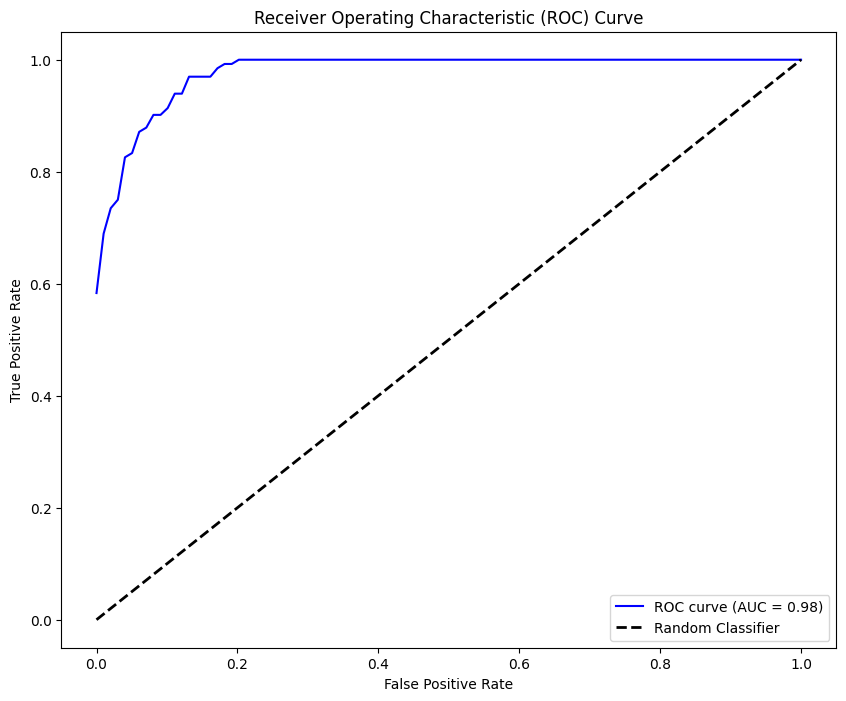

In [58]:
model = CustomDenseNet201().to(device)

num_runs = 5
results, tsne_features, tsne_labels, all_fprs, all_tprs = run_experiments_logistic_regression(num_runs, train_loader, test_loader, model)

(avg_train_accuracy, std_train_accuracy, avg_test_accuracy, std_test_accuracy, avg_precision, std_precision, avg_recall, std_recall, avg_f1, std_f1, avg_auc, std_auc, avg_specificity, std_specificity, avg_conf_matrix) = results

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for fpr, tpr in zip(all_fprs, all_tprs):
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= num_runs


print("\nAverage Performance Metrics:")
print(f"Test Accuracy: {avg_test_accuracy:.4f}")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall: {avg_recall:.4f}")
print(f"F1-Score: {avg_f1:.4f}")
print(f"Specificity: {avg_specificity:.4f}")
print(f"ROC AUC: {avg_auc:.4f}")


print("\nAverage Confusion Matrix:")
print(avg_conf_matrix)


metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
averages = [avg_test_accuracy, avg_precision, avg_recall, avg_f1, avg_auc, avg_specificity]
std_devs = [std_test_accuracy, std_precision, std_recall, std_f1, std_auc, std_specificity]

plt.figure(figsize=(10, 8))
plt.bar(metrics, averages, yerr=std_devs, capsize=5)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('DenseNet201 - LR - Performance Metrics')
plt.ylim(0, 1)
plt.show()


tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(tsne_features)

plt.figure(figsize=(10, 8))
plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=tsne_labels, cmap='viridis', alpha=0.6)
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Class')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 8))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'ROC curve (AUC = {avg_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
